In [1]:
import pandas as pd
import os
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from datetime import datetime
import matplotlib.dates as mdates
import matplotlib.font_manager as fm


import warnings
warnings.filterwarnings(action='ignore')

In [2]:
plt.rcParams['font.family'] = 'Malgun Gothic'

In [3]:
# ptc = pd.read_csv('Final_ptc.csv')

In [6]:
cu = pd.read_csv('EDA_customer_churn.csv')
tr = pd.read_csv('EDA_transaction_last1.csv')
pr = pd.read_csv('EDA_product_last1.csv')

In [7]:
# created_at 컬럼을 datetime 형식으로 변환
tr['created_at'] = pd.to_datetime(tr['created_at'])

# order_date 컬럼 생성
tr['order_date'] = tr['created_at'].dt.date

# order_time 컬럼 생성
tr['order_time'] = tr['created_at'].dt.time

# 초 아래 자릿수 삭제
tr['order_time'] = tr['order_time'].apply(lambda x: x.replace(microsecond=0))

tr['quantity_price'] = tr['item_price'] * tr['quantity']
tr_col=['created_at','order_date','order_time','customer_id', 'session_id', 'payment_method', 'payment_status', 'promo_amount', 'promo_code', 'shipment_fee', 'total_amount', 'product_id', 'quantity', 'item_price','quantity_price','product_id']
df = tr[tr_col]

In [8]:
tr['quantity_price'] = tr['item_price'] * tr['quantity']
tr_col=['created_at','order_date','order_time','customer_id', 'session_id', 'payment_method', 'payment_status', 'promo_amount', 'promo_code', 'shipment_fee', 'total_amount', 'product_id', 'quantity', 'item_price','quantity_price','product_id']
df = tr[tr_col]

In [7]:
urs4 = pd.read_csv('user_active_rates.csv')

In [8]:
df= pd.merge(df, urs4, on='customer_id', how='inner')

In [9]:
df.columns

Index(['created_at', 'order_date', 'order_time', 'customer_id', 'session_id',
       'payment_method', 'payment_status', 'promo_amount', 'promo_code',
       'shipment_fee', 'total_amount', 'product_id', 'quantity', 'item_price',
       'quantity_price', 'product_id', 'first_join_date', '2016년 9월~12월',
       '2017년 1월~4월', '2017년 5월~8월', '2017년 9월~12월', '2018년 1월~4월',
       '2018년 5월~8월', '2018년 9월~12월', '2019년 1월~4월', '2019년 5월~8월',
       '2019년 9월~12월', '2020년 1월~4월', '2020년 5월~8월', '2020년 9월~12월',
       '2021년 1월~4월', '2021년 5월~8월', '2021년 9월~12월', '2022년 1월~4월'],
      dtype='object')

In [10]:
df.head()

,created_at,order_date,order_time,customer_id,session_id,payment_method,payment_status,promo_amount,promo_code,shipment_fee,...,2019년 1월~4월,2019년 5월~8월,2019년 9월~12월,2020년 1월~4월,2020년 5월~8월,2020년 9월~12월,2021년 1월~4월,2021년 5월~8월,2021년 9월~12월,2022년 1월~4월
0,2018-07-29 15:22:01.458193+00:00,2018-07-29,15:22:01,5868,3abaa6ce-e320-4e51-9469-d9f3fa328e86,Debit Card,Success,1415,WEEKENDSERU,10000,...,dormant,dormant,dormant,dormant,dormant,dormant,dormant,dormant,dormant,dormant
1,2018-07-30 12:40:22.365620+00:00,2018-07-30,12:40:22,4774,2ee5ead1-f13e-4759-92df-7ff48475e970,Credit Card,Success,0,Not Promoted,10000,...,active_existing,active_existing,active_existing,active_existing,active_existing,active_existing,active_existing,active_existing,active_existing,active_existing
2,2018-09-15 11:51:17.365620+00:00,2018-09-15,11:51:17,4774,93325fb6-eb00-4268-bb0e-6471795a0ad0,OVO,Success,0,Not Promoted,10000,...,active_existing,active_existing,active_existing,active_existing,active_existing,active_existing,active_existing,active_existing,active_existing,active_existing
3,2018-11-01 11:23:48.365620+00:00,2018-11-01,11:23:48,4774,bcad5a61-1b67-448d-8ff4-781d67bc56e4,Credit Card,Success,0,Not Promoted,0,...,active_existing,active_existing,active_existing,active_existing,active_existing,active_existing,active_existing,active_existing,active_existing,active_existing
4,2018-12-18 11:20:30.365620+00:00,2018-12-18,11:20:30,4774,df1042ab-13e6-4072-b9d2-64a81974c51a,Credit Card,Success,0,Not Promoted,0,...,active_existing,active_existing,active_existing,active_existing,active_existing,active_existing,active_existing,active_existing,active_existing,active_existing


In [ ]:
active_esting df[df['2022년 1월~4월'] == "active_exsting"]

In [12]:
# Define a function to calculate unbounded retention for each user
def calculate_unbounded_retention(row):
    # Find the first active quarter for the user
    first_active_index = next((index for index, value in enumerate(row) if value in ['active_new', 'active_existing']), None)
    
    if first_active_index is None:
        return None  # This user never became active
    
    # Calculate the retention from the first active quarter
    total_periods = len(row) - first_active_index
    active_periods = sum(1 for value in row[first_active_index:] if value in ['active_new', 'active_existing'])
    
    return active_periods / total_periods

# Apply the function to each user
urs4['unbounded_retention'] = urs4.iloc[:, 2:].apply(calculate_unbounded_retention, axis=1)

# Get the average unbounded retention for all users
average_unbounded_retention = urs4['unbounded_retention'].mean()
average_unbounded_retention


0.7051301855599943

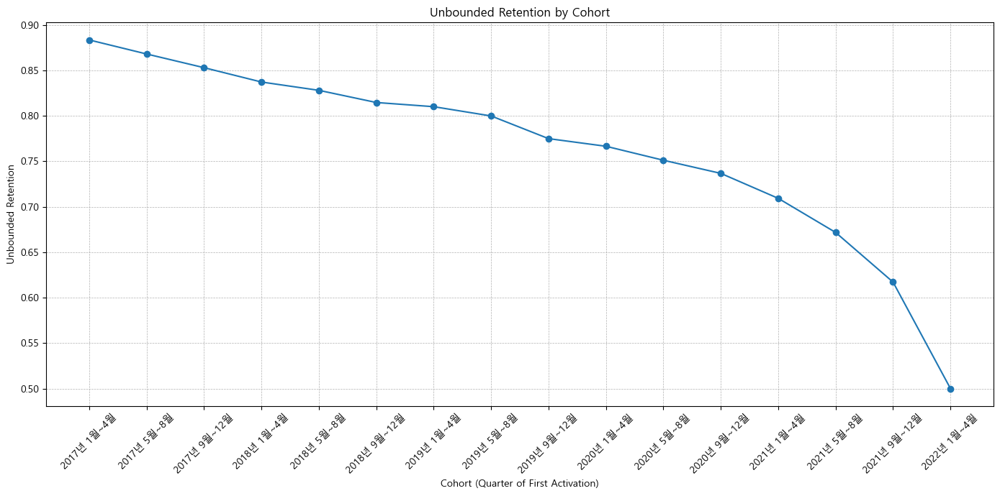

In [13]:
# Define a function to calculate unbounded retention for users who first became active in a given quarter
def calculate_retention_for_cohort(cohort_column):
    cohort_urs4 = urs4[urs4[cohort_column] == 'active_existing']
    return cohort_urs4.iloc[:, urs4.columns.get_loc(cohort_column):].apply(calculate_unbounded_retention, axis=1).mean()

# Calculate the unbounded retention for each cohort
cohorts = urs4.columns[2:]
retention_by_cohort = [calculate_retention_for_cohort(cohort) for cohort in cohorts]

# Plotting the unbounded retention by cohort
plt.figure(figsize=(14, 7))
plt.plot(cohorts, retention_by_cohort, marker='o', linestyle='-')
plt.title('Unbounded Retention by Cohort')
plt.xlabel('Cohort (Quarter of First Activation)')
plt.ylabel('Unbounded Retention')
plt.xticks(rotation=45)
plt.tight_layout()
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.show()


In [ ]:
# Define a function to calculate unbounded retention for users who first became active in a given quarter
def calculate_retention_for_cohort(cohort_column):
    cohort_urs4 = urs4[urs4[cohort_column] == 'active_existing']
    return cohort_urs4.iloc[:, urs4.columns.get_loc(cohort_column):].apply(calculate_unbounded_retention, axis=1).mean()

# Calculate the unbounded retention for each cohort
cohorts = urs4.columns[2:]
retention_by_cohort = [calculate_retention_for_cohort(cohort) for cohort in cohorts]

# Plotting the unbounded retention by cohort
plt.figure(figsize=(14, 7))
plt.plot(cohorts, retention_by_cohort, marker='o', linestyle='-')
plt.title('Unbounded Retention by Cohort')
plt.xlabel('Cohort (Quarter of First Activation)')
plt.ylabel('Unbounded Retention')
plt.xticks(rotation=45)
plt.tight_layout()
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.show()


In [18]:
# Define the active states
active_states = ["active_new", "active_existing"]

# Calculate Unbounded Retention for each period
unbounded_retention = (urs4.iloc[:, 2:] == "active_new") | (urs4.iloc[:, 2:] == "active_existing")
unbounded_retention_rates = unbounded_retention.mean()

unbounded_retention_rates

2016년 9월~12월           0.020405
2017년 1월~4월            0.031448
2017년 5월~8월            0.044915
2017년 9월~12월           0.057070
2018년 1월~4월            0.070726
2018년 5월~8월            0.089159
2018년 9월~12월           0.101314
2019년 1월~4월            0.115961
2019년 5월~8월            0.137247
2019년 9월~12월           0.151695
2020년 1월~4월            0.168766
2020년 5월~8월            0.195629
2020년 9월~12월           0.210707
2021년 1월~4월            0.235708
2021년 5월~8월            0.266775
2021년 9월~12월           0.284908
2022년 1월~4월            0.300947
unbounded_retention    0.000000
dtype: float64

In [26]:
# Define the active states
active_states = ["active_new", "active_existing"]

# Calculate Unbounded Retention for each period
unbounded_retention = (urs4.iloc[1:, 2:] == "active_new") | (urs4.iloc[1:, 2:] == "active_existing")
unbounded_retention_rates = unbounded_retention.mean()

unbounded_retention_rates

2016년 9월~12월           0.020405
2017년 1월~4월            0.031449
2017년 5월~8월            0.044915
2017년 9월~12월           0.057070
2018년 1월~4월            0.070727
2018년 5월~8월            0.089160
2018년 9월~12월           0.101315
2019년 1월~4월            0.115963
2019년 5월~8월            0.137249
2019년 9월~12월           0.151697
2020년 1월~4월            0.168768
2020년 5월~8월            0.195631
2020년 9월~12월           0.210709
2021년 1월~4월            0.235710
2021년 5월~8월            0.266778
2021년 9월~12월           0.284910
2022년 1월~4월            0.300950
unbounded_retention    0.000000
dtype: float64

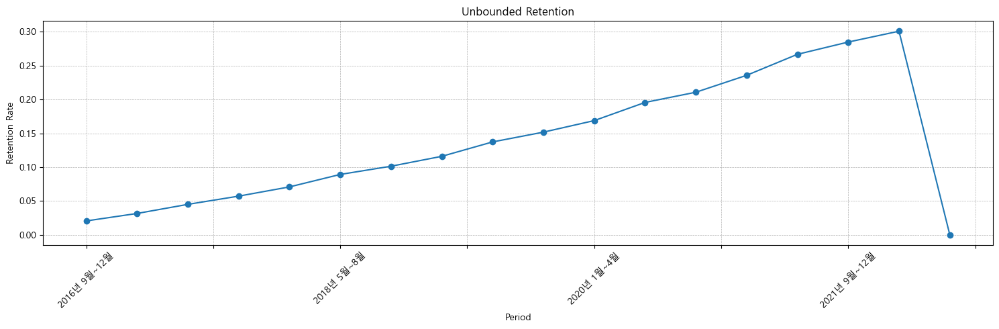

In [27]:
import matplotlib.pyplot as plt

# Plotting Unbounded Retention
plt.figure(figsize=(15, 5))
unbounded_retention_rates.plot(marker='o')
plt.title('Unbounded Retention')
plt.ylabel('Retention Rate')
plt.xlabel('Period')
plt.xticks(rotation=45)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()

In [23]:
# Create a function to calculate bracket retention for a specific cohort
def calculate_bracket_retention_for_cohort(cohort_column):
    cohort_urs4 = urs4[urs4[cohort_column].isin(active_states)]
    subsequent_periods = urs4.columns.tolist().index(cohort_column) + 1
    return ((cohort_urs4.iloc[:, subsequent_periods:] == "active_new") | 
            (cohort_urs4.iloc[:, subsequent_periods:] == "active_existing")).mean()

# Calculate bracket retention for all cohorts
bracket_retention_rates = {}
for column in urs4.columns[2:]:
    bracket_retention_rates[column] = calculate_bracket_retention_for_cohort(column)

bracket_retention_df = pd.DataFrame(bracket_retention_rates).transpose()
bracket_retention_df


,2017년 1월~4월,2017년 5월~8월,2017년 9월~12월,2018년 1월~4월,2018년 5월~8월,2018년 9월~12월,2019년 1월~4월,2019년 5월~8월,2019년 9월~12월,2020년 1월~4월,2020년 5월~8월,2020년 9월~12월,2021년 1월~4월,2021년 5월~8월,2021년 9월~12월,2022년 1월~4월,unbounded_retention
2016년 9월~12월,0.529931,0.590775,0.608930,0.611874,0.592247,0.635427,0.610402,0.608440,0.666340,0.608440,0.620216,0.610893,0.609912,0.620216,0.585378,0.568695,0.0
2017년 1월~4월,NaN,0.639605,0.702324,0.701369,0.715377,0.705826,0.708373,0.707736,0.771410,0.680675,0.708691,0.715059,0.711557,0.700414,0.700732,0.681948,0.0
2017년 5월~8월,NaN,NaN,0.689255,0.740749,0.745653,0.751895,0.763932,0.746099,0.738297,0.792688,0.749443,0.759028,0.752786,0.739857,0.744539,0.730718,0.0
2017년 9월~12월,NaN,NaN,NaN,0.721228,0.781228,0.782982,0.779474,0.795614,0.778772,0.820877,0.773860,0.778246,0.769123,0.805789,0.771053,0.759649,0.0
2018년 1월~4월,NaN,NaN,NaN,NaN,0.740374,0.798698,0.794734,0.810447,0.805493,0.789638,0.829700,0.790062,0.809740,0.797424,0.800113,0.781993,0.0
2018년 5월~8월,NaN,NaN,NaN,NaN,NaN,0.738012,0.788097,0.805503,0.808984,0.790567,0.831443,0.781583,0.809096,0.793599,0.791690,0.778214,0.0
2018년 9월~12월,NaN,NaN,NaN,NaN,NaN,NaN,0.749185,0.814606,0.816187,0.818954,0.808479,0.841980,0.808084,0.829825,0.802747,0.793655,0.0
2019년 1월~4월,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.767484,0.822051,0.822397,0.830772,0.843896,0.808496,0.826282,0.819116,0.807546,0.0
2019년 5월~8월,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.756128,0.814707,0.831923,0.797418,0.838416,0.822877,0.815655,0.793186,0.0
2019년 9월~12월,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.761534,0.819154,0.821200,0.845423,0.808395,0.810376,0.808131,0.0


In [24]:
# Define function to calculate N-month retention for specific cohort and N
def calculate_n_month_retention_for_cohort(cohort_column, n):
    cohort_urs4 = urs4[urs4[cohort_column].isin(active_states)]
    n_month_column_index = urs4.columns.tolist().index(cohort_column) + n
    if n_month_column_index >= len(urs4.columns):
        return None
    return ((cohort_urs4.iloc[:, n_month_column_index] == "active_new") | 
            (cohort_urs4.iloc[:, n_month_column_index] == "active_existing")).mean()

# Calculate N-month retention for all cohorts for N=1,2,3,...
n_month_retention_rates = {}
max_n = len(urs4.columns) - 2
for column in urs4.columns[2:]:
    n_month_retention_rates[column] = [calculate_n_month_retention_for_cohort(column, i) for i in range(1, max_n)]

n_month_retention_df = pd.DataFrame(n_month_retention_rates).transpose()
n_month_retention_df.columns = [f"{i}-Month Retention" for i in range(1, max_n)]
n_month_retention_df


,1-Month Retention,2-Month Retention,3-Month Retention,4-Month Retention,5-Month Retention,6-Month Retention,7-Month Retention,8-Month Retention,9-Month Retention,10-Month Retention,11-Month Retention,12-Month Retention,13-Month Retention,14-Month Retention,15-Month Retention,16-Month Retention,17-Month Retention
2016년 9월~12월,0.529931,0.590775,0.60893,0.611874,0.592247,0.635427,0.610402,0.60844,0.66634,0.60844,0.620216,0.610893,0.609912,0.620216,0.585378,0.568695,0.0
2017년 1월~4월,0.639605,0.702324,0.701369,0.715377,0.705826,0.708373,0.707736,0.77141,0.680675,0.708691,0.715059,0.711557,0.700414,0.700732,0.681948,0.0,NaN
2017년 5월~8월,0.689255,0.740749,0.745653,0.751895,0.763932,0.746099,0.738297,0.792688,0.749443,0.759028,0.752786,0.739857,0.744539,0.730718,0.0,NaN,NaN
2017년 9월~12월,0.721228,0.781228,0.782982,0.779474,0.795614,0.778772,0.820877,0.77386,0.778246,0.769123,0.805789,0.771053,0.759649,0.0,NaN,NaN,NaN
2018년 1월~4월,0.740374,0.798698,0.794734,0.810447,0.805493,0.789638,0.8297,0.790062,0.80974,0.797424,0.800113,0.781993,0.0,NaN,NaN,NaN,NaN
2018년 5월~8월,0.738012,0.788097,0.805503,0.808984,0.790567,0.831443,0.781583,0.809096,0.793599,0.79169,0.778214,0.0,NaN,NaN,NaN,NaN,NaN
2018년 9월~12월,0.749185,0.814606,0.816187,0.818954,0.808479,0.84198,0.808084,0.829825,0.802747,0.793655,0.0,NaN,NaN,NaN,NaN,NaN,NaN
2019년 1월~4월,0.767484,0.822051,0.822397,0.830772,0.843896,0.808496,0.826282,0.819116,0.807546,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019년 5월~8월,0.756128,0.814707,0.831923,0.797418,0.838416,0.822877,0.815655,0.793186,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019년 9월~12월,0.761534,0.819154,0.8212,0.845423,0.808395,0.810376,0.808131,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


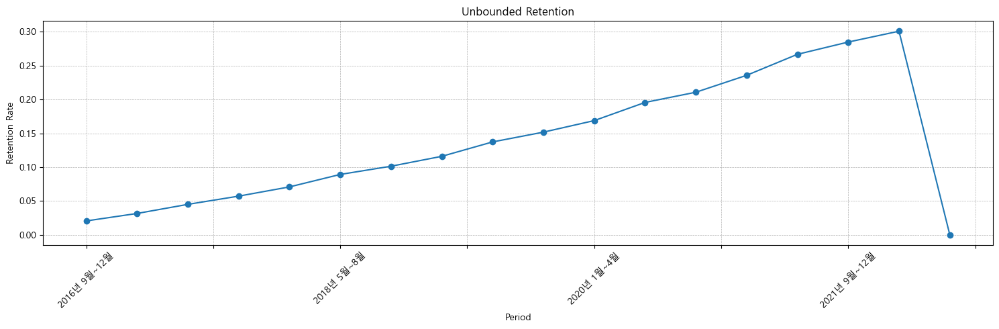

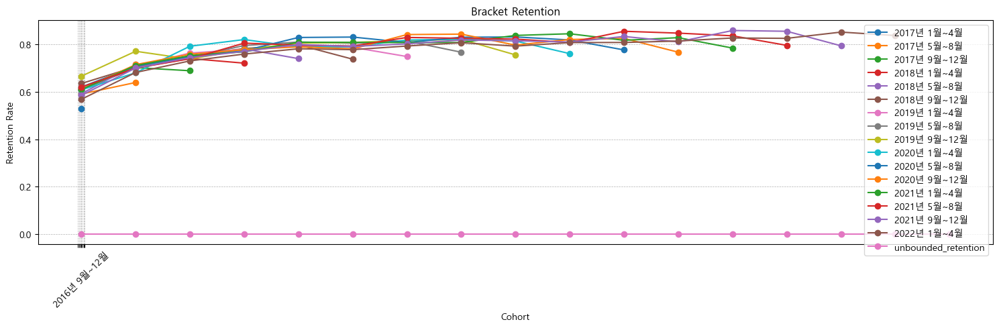

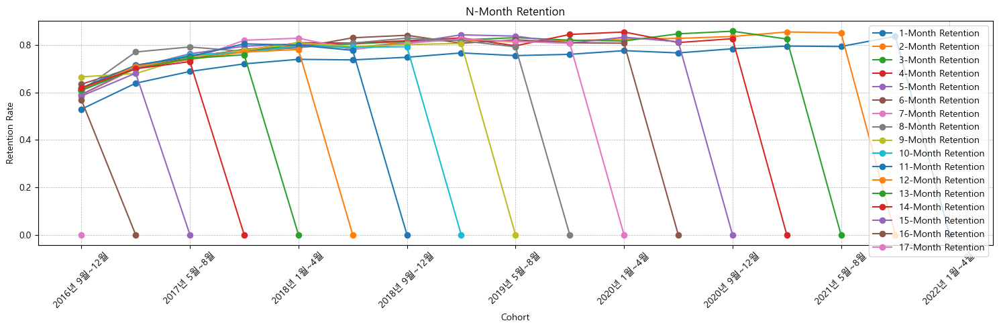

In [25]:
import matplotlib.pyplot as plt

# Plotting Unbounded Retention
plt.figure(figsize=(15, 5))
unbounded_retention_rates.plot(marker='o')
plt.title('Unbounded Retention')
plt.ylabel('Retention Rate')
plt.xlabel('Period')
plt.xticks(rotation=45)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()

# Plotting Bracket Retention
plt.figure(figsize=(15, 5))
for column in bracket_retention_df.columns:
    bracket_retention_df[column].plot(label=column, marker='o')
plt.title('Bracket Retention')
plt.ylabel('Retention Rate')
plt.xlabel('Cohort')
plt.legend()
plt.xticks(rotation=45)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()

# Plotting N-Month Retention
plt.figure(figsize=(15, 5))
for column in n_month_retention_df.columns:
    n_month_retention_df[column].plot(label=column, marker='o')
plt.title('N-Month Retention')
plt.ylabel('Retention Rate')
plt.xlabel('Cohort')
plt.legend()
plt.xticks(rotation=45)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()


# 이탈률

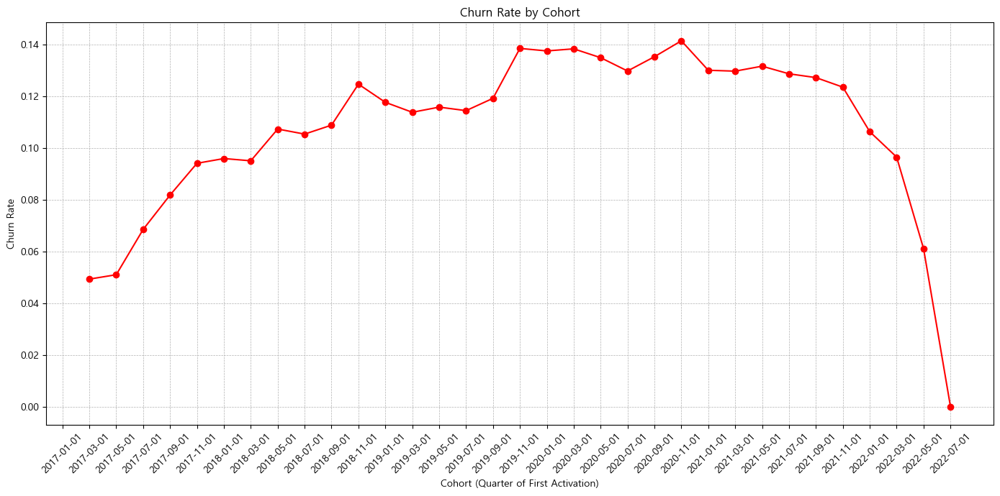

In [66]:
# Calculate churn rate for each cohort
churn_rates_by_cohort = [1 - retention for retention in retention_by_cohort]

# Plotting the churn rate by cohort
plt.figure(figsize=(14, 7))
plt.plot(cohorts, churn_rates_by_cohort, marker='o', linestyle='-', color='red')
plt.title('Churn Rate by Cohort')
plt.xlabel('Cohort (Quarter of First Activation)')
plt.ylabel('Churn Rate')
plt.xticks(rotation=45)
plt.tight_layout()
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.show()


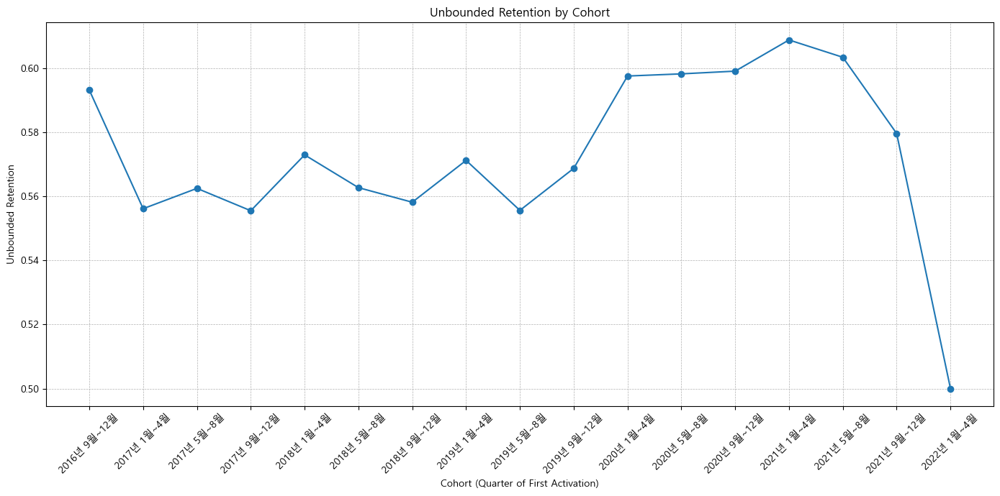

In [55]:
# Define a function to calculate unbounded retention for users who first became active in a given quarter
def calculate_retention_for_cohort(cohort_column):
    cohort_urs4 = urs4[urs4[cohort_column] == 'active_new']
    return cohort_urs4.iloc[:, urs4.columns.get_loc(cohort_column):].apply(calculate_unbounded_retention, axis=1).mean()

# Calculate the unbounded retention for each cohort
cohorts = urs4.columns[2:]
retention_by_cohort = [calculate_retention_for_cohort(cohort) for cohort in cohorts]

# Plotting the unbounded retention by cohort
plt.figure(figsize=(14, 7))
plt.plot(cohorts, retention_by_cohort, marker='o', linestyle='-')
plt.title('Unbounded Retention by Cohort')
plt.xlabel('Cohort (Quarter of First Activation)')
plt.ylabel('Unbounded Retention')
plt.xticks(rotation=45)
plt.tight_layout()
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.show()


In [138]:
df_sampled = df.sample(100)
df_sampled.to_csv('df_sampled.csv')

In [49]:
urs.head()

,customer_id,first_join_date,2017-01-01,2017-03-01,2017-05-01,2017-07-01,2017-09-01,2017-11-01,2018-01-01,2018-03-01,...,2021-01-01,2021-03-01,2021-05-01,2021-07-01,2021-09-01,2021-11-01,2022-01-01,2022-03-01,2022-05-01,2022-07-01
0,2870,2019-07-21,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,...,low_potential_new,low_potential_new,low_potential_new,low_potential_new,low_potential_new,low_potential_new,low_potential_new,low_potential_new,low_potential_new,low_potential_new
1,8193,2017-07-16,not_join_yet,not_join_yet,not_join_yet,not_join_yet,inactive_new,inactive_new,low_potential_new,low_potential_new,...,low_potential_new,low_potential_new,low_potential_new,low_potential_new,low_potential_new,low_potential_new,low_potential_new,low_potential_new,low_potential_new,low_potential_new
2,7279,2020-08-23,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,...,active_existing,active_existing,active_existing,active_existing,active_existing,active_existing,active_existing,active_existing,active_existing,active_existing
3,88813,2021-10-03,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,...,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,inactive_new,inactive_new,low_potential_new,low_potential_new,low_potential_new
4,82542,2021-04-11,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,...,not_join_yet,not_join_yet,active_new,active_new,dormant,dormant,dormant,dormant,dormant,dormant


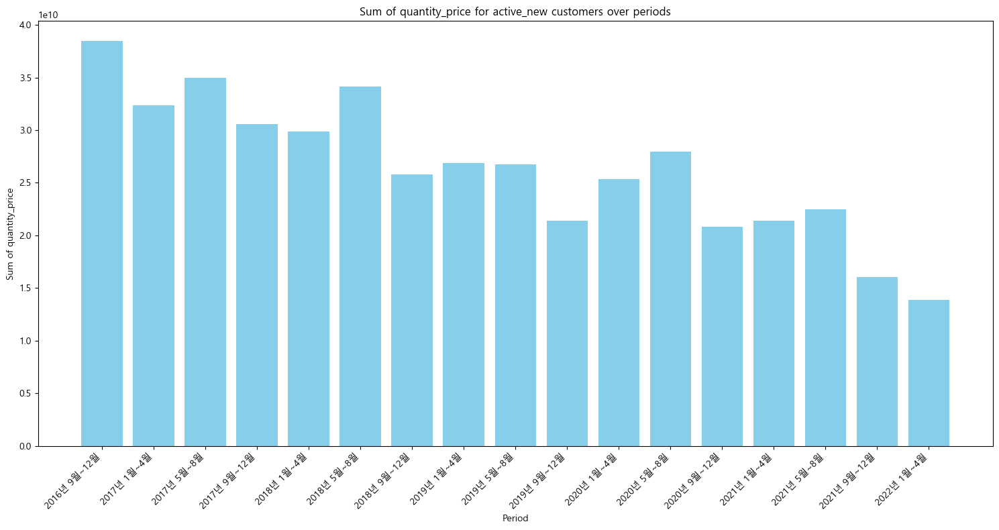

In [31]:
# 신규 유저 매출액
# Calculate the sum of quantity_price for active_new customers for each period
sales = {'2016년 9월~12월': 38441572796,
 '2017년 1월~4월': 32349041191,
 '2017년 5월~8월': 34941177257,
 '2017년 9월~12월': 30543041960,
 '2018년 1월~4월': 29889865634,
 '2018년 5월~8월': 34117380446,
 '2018년 9월~12월': 25769191713,
 '2019년 1월~4월': 26853574440,
 '2019년 5월~8월': 26753302433,
 '2019년 9월~12월': 21386774134,
 '2020년 1월~4월': 25318955536,
 '2020년 5월~8월': 27944544056,
 '2020년 9월~12월': 20817501526,
 '2021년 1월~4월': 21387400133,
 '2021년 5월~8월': 22499450344,
 '2021년 9월~12월': 16045957840,
 '2022년 1월~4월': 13849752952}


# Plotting the results
plt.figure(figsize=(15, 8))
plt.bar(sales.keys(), sales.values(), color='skyblue')
plt.xticks(rotation=45, ha='right')
plt.title('Sum of quantity_price for active_new customers over periods')
plt.ylabel('Sum of quantity_price')
plt.xlabel('Period')
plt.tight_layout()
plt.show()


In [36]:
sums = {'2016년 9월~12월': 0,
 '2017년 1월~4월': 36758961993,
 '2017년 5월~8월': 67278300617,
 '2017년 9월~12월': 101180816217,
 '2018년 1월~4월': 130530626802,
 '2018년 5월~8월': 159381167623,
 '2018년 9월~12월': 192048032337,
 '2019년 1월~4월': 216487071723,
 '2019년 5월~8월': 243270017791,
 '2019년 9월~12월': 268294202957,
 '2020년 1월~4월': 288771856658,
 '2020년 5월~8월': 314193697218,
 '2020년 9월~12월': 340198766538,
 '2021년 1월~4월': 361103815516,
 '2021년 5월~8월': 382437242529,
 '2021년 9월~12월': 403236463470,
 '2022년 1월~4월': 417515182392}

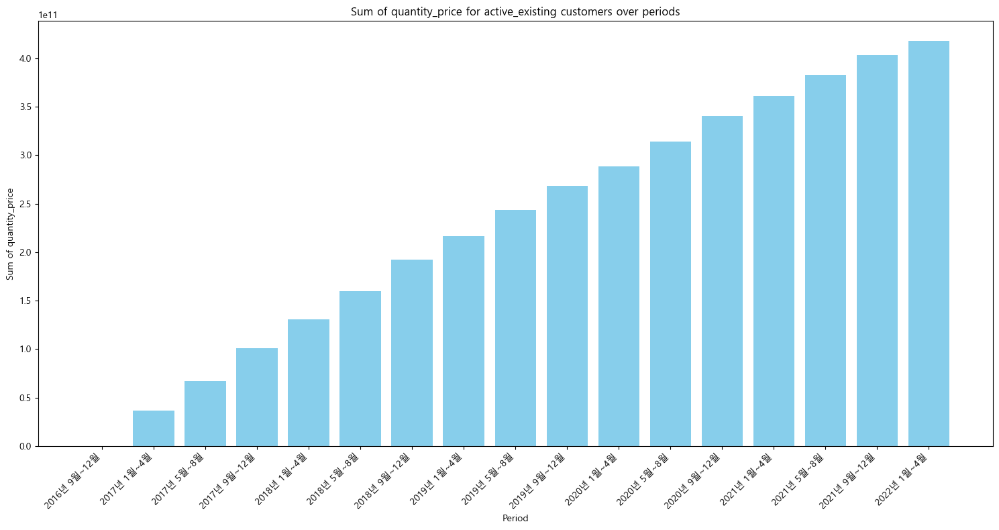

In [37]:


# Plotting the results
plt.figure(figsize=(15, 8))
plt.bar(sums.keys(), sums.values(), color='skyblue')
plt.xticks(rotation=45, ha='right')
plt.title('Sum of quantity_price for active_existing customers over periods')
plt.ylabel('Sum of quantity_price')
plt.xlabel('Period')
plt.tight_layout()
plt.show()


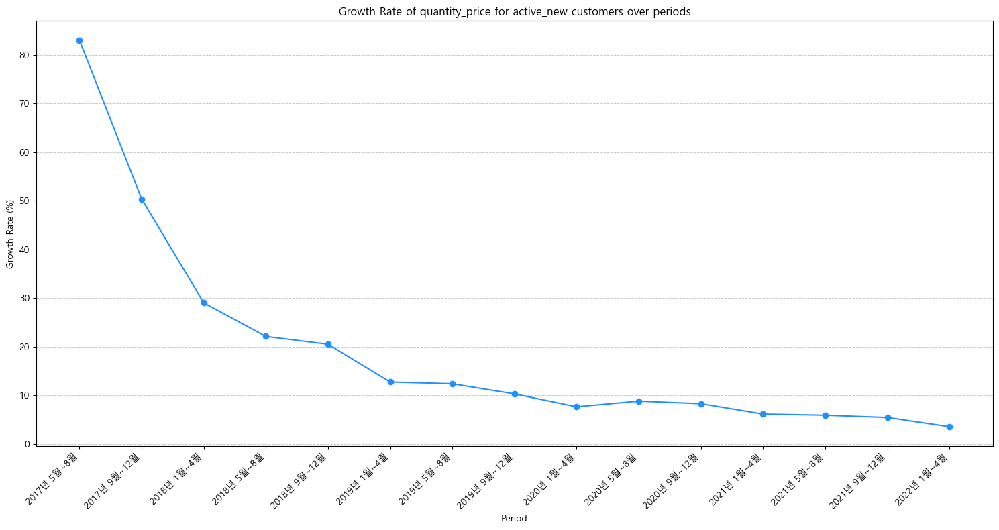

In [41]:
sums = {
 '2017년 1월~4월': 36758961993,
 '2017년 5월~8월': 67278300617,
 '2017년 9월~12월': 101180816217,
 '2018년 1월~4월': 130530626802,
 '2018년 5월~8월': 159381167623,
 '2018년 9월~12월': 192048032337,
 '2019년 1월~4월': 216487071723,
 '2019년 5월~8월': 243270017791,
 '2019년 9월~12월': 268294202957,
 '2020년 1월~4월': 288771856658,
 '2020년 5월~8월': 314193697218,
 '2020년 9월~12월': 340198766538,
 '2021년 1월~4월': 361103815516,
 '2021년 5월~8월': 382437242529,
 '2021년 9월~12월': 403236463470,
 '2022년 1월~4월': 417515182392}

# Calculating growth rates and plotting the graph again
periods = list(sums.keys())
growth_rates = []

# Starting from the second period
for i in range(1, len(periods)):
    prev_period_sums = sums[periods[i - 1]]
    current_period_sums = sums[periods[i]]
    
    growth_rate = ((current_period_sums - prev_period_sums) / prev_period_sums) * 100
    growth_rates.append(growth_rate)

# Inserting None for the first period
growth_rates.insert(0, None)

# Plotting the growth rates
plt.figure(figsize=(15, 8))
plt.plot(periods, growth_rates, marker='o', color='dodgerblue', linestyle='-')
plt.xticks(rotation=45, ha='right')
plt.title('Growth Rate of quantity_price for active_new customers over periods')
plt.ylabel('Growth Rate (%)')
plt.xlabel('Period')
plt.grid(True, axis='y', linestyle='--', linewidth=0.7, alpha=0.7)
plt.tight_layout()
plt.show()


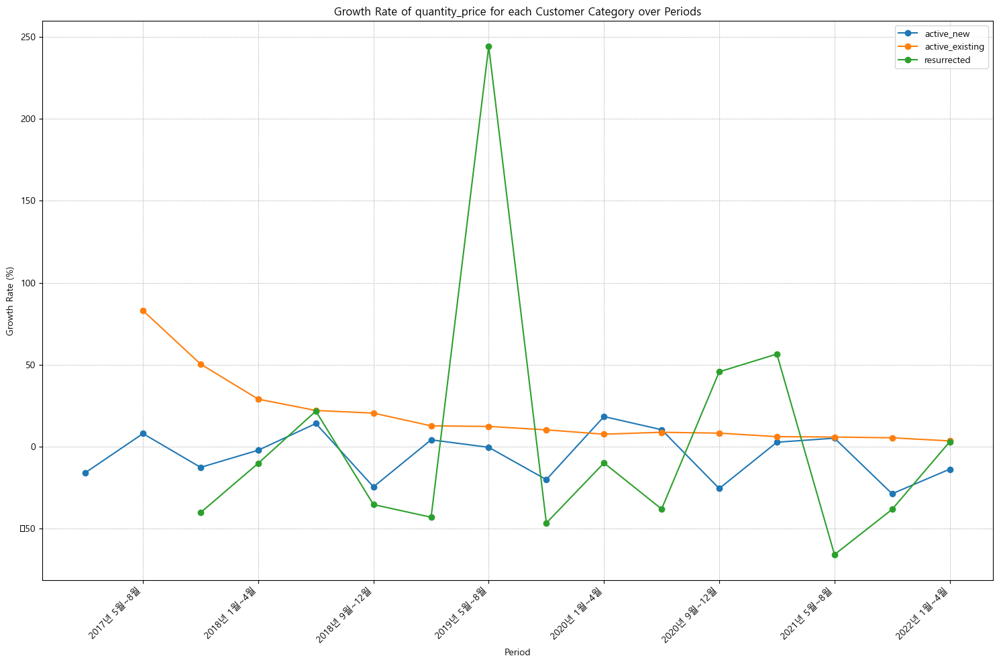

In [142]:
# Calculate growth rate for each customer category
growth_rates = results_df.pct_change() * 100

# Plotting the growth rates
fig, ax = plt.subplots(figsize=(15, 10))
growth_rates.plot(kind='line', marker='o', ax=ax)
ax.set_title("Growth Rate of quantity_price for each Customer Category over Periods")
ax.set_ylabel("Growth Rate (%)")
ax.set_xlabel("Period")
plt.xticks(rotation=45, ha="right")
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()

plt.show()


In [143]:
# Calculate the total sales for each period
total_sales_per_period = results_df.sum(axis=1)

# Calculate the proportion of each customer category's sales to the total sales for each period
sales_proportion = results_df.divide(total_sales_per_period, axis=0) * 100

sales_proportion


,active_new,active_existing,resurrected
2016년 9월~12월,100.000000,0.000000,0.000000
2017년 1월~4월,46.809399,53.190601,0.000000
2017년 5월~8월,34.108736,65.675458,0.215806
2017년 9월~12월,23.163910,76.735752,0.100338
2018년 1월~4월,18.618396,81.307521,0.074083
2018년 5월~8월,17.618676,82.306588,0.074736
2018년 9월~12월,11.825563,88.131446,0.042991
2019년 1월~4월,11.032963,88.945101,0.021936
2019년 5월~8월,9.901038,90.030968,0.067993
2019년 9월~12월,7.380368,92.585720,0.033912


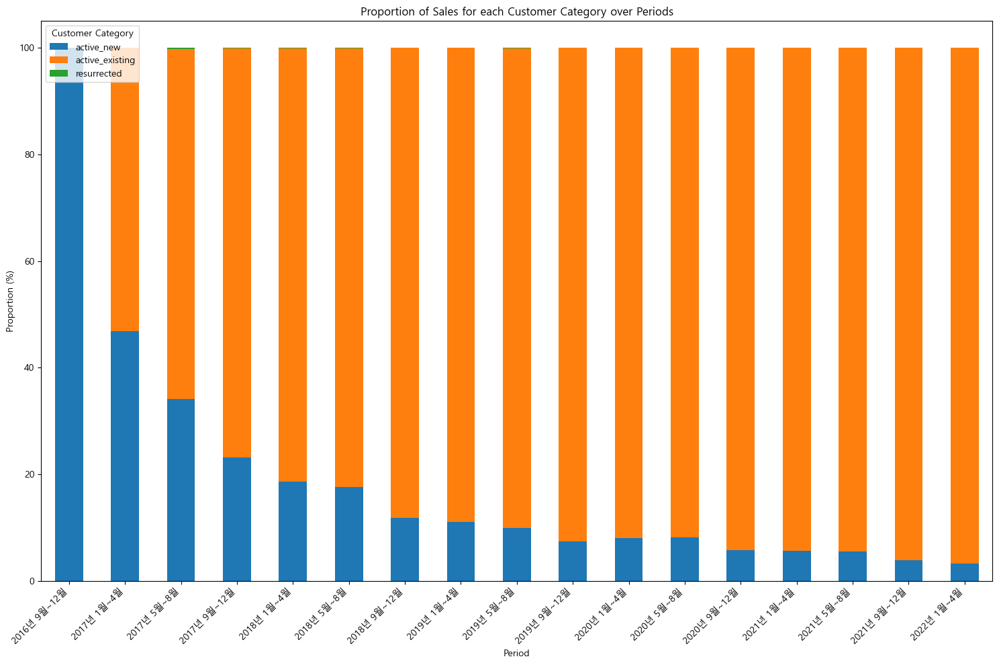

In [144]:
# Plotting the sales proportion
fig, ax = plt.subplots(figsize=(15, 10))
sales_proportion.plot(kind='bar', stacked=True, ax=ax)
ax.set_title("Proportion of Sales for each Customer Category over Periods")
ax.set_ylabel("Proportion (%)")
ax.set_xlabel("Period")
plt.xticks(rotation=45, ha="right")
ax.legend(title="Customer Category", loc="upper left")
plt.tight_layout()

plt.show()


# 체크

In [ ]:
# Convert the 'order_date' column to datetime format
df['order_date'] = pd.to_datetime(df['order_date'])

# Extract the month and year from the 'order_date' column
df['year_month'] = df['order_date'].dt.to_period('M')

# Group by the extracted year-month and sum up the 'quantity_price' column
monthly_sales = df.groupby('year_month')['quantity_price'].sum()

# Filter out the months of interest
highlight_months = ['02', '06', '09']

# Plotting
plt.figure(figsize=(16, 8))
monthly_sales.plot(linewidth=2, marker='o', markersize=5, color='b', label='Monthly Sales')
for month in highlight_months:
    subset = monthly_sales[monthly_sales.index.month == int(month)]
    plt.scatter(subset.index, subset.values, color=['r'], s=100, label=f'Highlight {month}', zorder=5)

# Adding title and labels
plt.title("Monthly Sales over Time", fontsize=16)
plt.xlabel("Date", fontsize=14)
plt.ylabel("Sales Amount", fontsize=14)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.legend(loc='upper left')

# Display the plot
plt.tight_layout()
plt.show()


# 월별 명절 매출

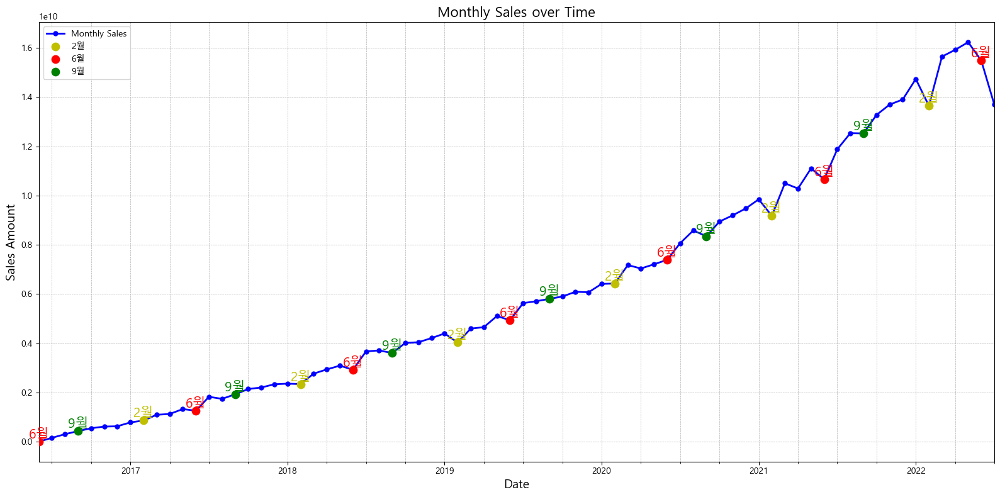

In [24]:
# Using the provided code to plot the graph

# Convert the 'order_date' column to datetime format
df['order_date'] = pd.to_datetime(df['order_date'])

# Extract the month and year from the 'order_date' column
df['year_month'] = df['order_date'].dt.to_period('M')

# Group by the extracted year-month and sum up the 'quantity_price' column
monthly_sales = df.groupby('year_month')['quantity_price'].sum()

# Filter out the months of interest
highlight_months = ['2', '6', '9']

# Plotting
plt.figure(figsize=(16, 8))
monthly_sales.plot(linewidth=2, marker='o', markersize=5, color='b', label='Monthly Sales')

colors = ['y', 'r', 'g']
for idx, month in enumerate(highlight_months):
    subset = monthly_sales[monthly_sales.index.month == int(month)]
    plt.scatter(subset.index, subset.values, color=colors[idx], s=80, label=f'{month}월', zorder=6)

for idx, month in enumerate(highlight_months):
    subset = monthly_sales[monthly_sales.index.month == int(month)]
    for date in subset.index:
        plt.text(date, subset.loc[date] + 5000, f'{month}월', color=colors[idx], fontsize=15, ha='center', va='bottom')  # Adjusted the y value for better visualization

# Removing duplicate labels from the legend
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys(), loc='upper left')

# Adding title and labels
plt.title("Monthly Sales over Time", fontsize=16)
plt.xlabel("Date", fontsize=14)
plt.ylabel("Sales Amount", fontsize=14)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Display the plot
plt.tight_layout()
plt.show()


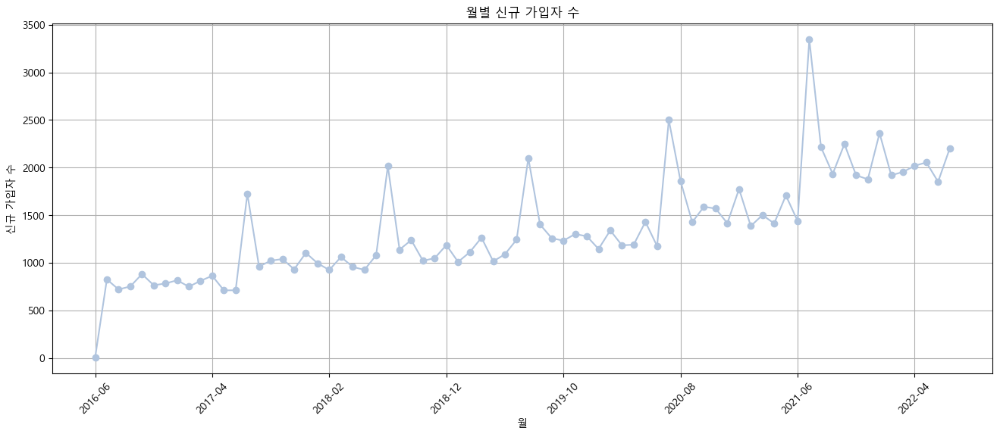

In [11]:
period_new_customer = cu.groupby('first_join_month')['customer_id'].count()

plt.figure(figsize=(16, 6))
plt.rcParams['font.family'] = 'Malgun Gothic'

period_new_customer.plot(marker='o', color='lightsteelblue')

plt.xlabel('월')
plt.ylabel('신규 가입자 수')
plt.title('월별 신규 가입자 수')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

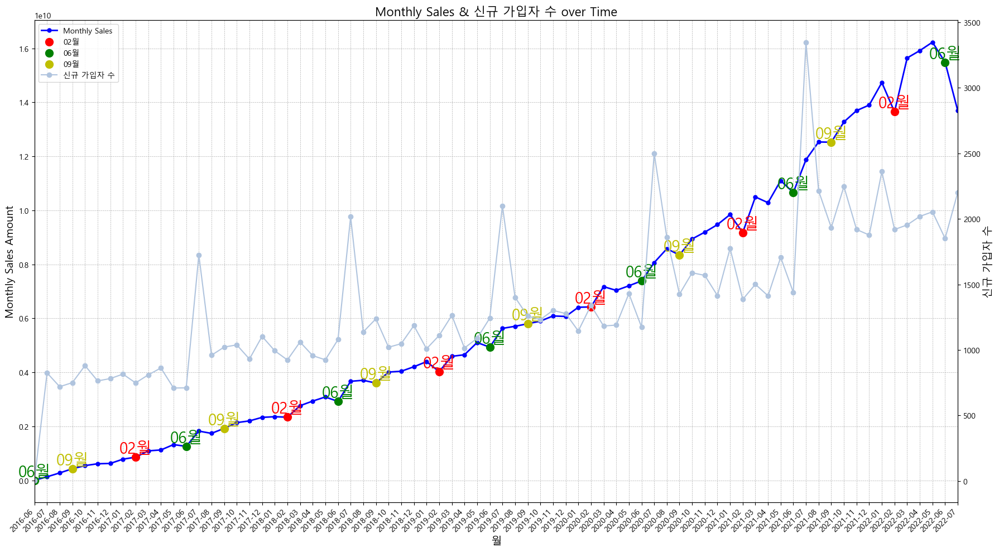

In [14]:
# Setting up the figure and axis
plt.figure(figsize=(18, 10))
ax1 = plt.gca()

# Plotting the 'monthly_sales' graph on the first y-axis
monthly_sales.plot(linewidth=2, marker='o', markersize=5, color='b', label='Monthly Sales', ax=ax1)

colors = ['r', 'g', 'y']
for idx, month in enumerate(highlight_months):
    subset = monthly_sales[monthly_sales.index.month == int(month)]
    ax1.scatter(subset.index, subset.values, color=colors[idx], s=100, label=f'{month}월', zorder=5)

for idx, month in enumerate(highlight_months):
    subset = monthly_sales[monthly_sales.index.month == int(month)]
    for date in subset.index:
        ax1.text(date, subset[date] + 3000, f'{month}월', color=colors[idx], fontsize=20, ha='center', va='bottom')

# Using twinx() to create a second y-axis for the 'period_new_customer' graph
ax2 = ax1.twinx()
period_new_customer.index = pd.to_datetime(period_new_customer.index)
period_new_customer.plot(marker='o', color='lightsteelblue', ax=ax2, label='신규 가입자 수')


# Setting labels and title
ax1.set_xlabel("월", fontsize=14)
ax1.set_ylabel("Monthly Sales Amount", fontsize=14)
ax2.set_ylabel("신규 가입자 수", fontsize=14)
ax1.set_title("Monthly Sales & 신규 가입자 수 over Time", fontsize=16)
ax1.grid(True, which='both', linestyle='--', linewidth=0.5)

# Adjusting the x-axis labels for better visibility
ax1.set_xticks(monthly_sales.index)
ax1.set_xticklabels(monthly_sales.index, rotation=45, ha='right')

# Handling legends from both ax1 and ax2
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc='upper left')

# Displaying the combined graph
plt.tight_layout()
plt.show()


In [ ]:
# Setting up the figure and axis
plt.figure(figsize=(18, 10))
ax1 = plt.gca()

# Plotting the 'monthly_sales' graph on the first y-axis
monthly_sales.plot(linewidth=2, marker='o', markersize=5, color='b', label='Monthly Sales', ax=ax1)

colors = ['r', 'g', 'y']
for idx, month in enumerate(highlight_months):
    subset = monthly_sales[monthly_sales.index.month == int(month)]
    ax1.scatter(subset.index, subset.values, color=colors[idx], s=100, label=f'{month}월', zorder=5)

for idx, month in enumerate(highlight_months):
    subset = monthly_sales[monthly_sales.index.month == int(month)]
    for date in subset.index:
        ax1.text(date, subset[date] + 3000, f'{month}월', color=colors[idx], fontsize=20, ha='center', va='bottom')

# Using twinx() to create a second y-axis for the 'period_new_customer' graph
ax2 = ax1.twinx()
period_new_customer.index = pd.to_datetime(period_new_customer.index)
period_new_customer.plot(marker='o', color='lightsteelblue', ax=ax2, label='신규 가입자 수')


# Setting labels and title
ax1.set_xlabel("월", fontsize=14)
ax1.set_ylabel("Monthly Sales Amount", fontsize=14)
ax2.set_ylabel("신규 가입자 수", fontsize=14)
ax1.set_title("Monthly Sales & 신규 가입자 수 over Time", fontsize=16)
ax1.grid(True, which='both', linestyle='--', linewidth=0.5)

# Adjusting the x-axis labels for better visibility
ax1.set_xticks(monthly_sales.index)
ax1.set_xticklabels(monthly_sales.index, rotation=45, ha='right')

# Handling legends from both ax1 and ax2
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc='upper left')

# Displaying the combined graph
plt.tight_layout()
plt.show()


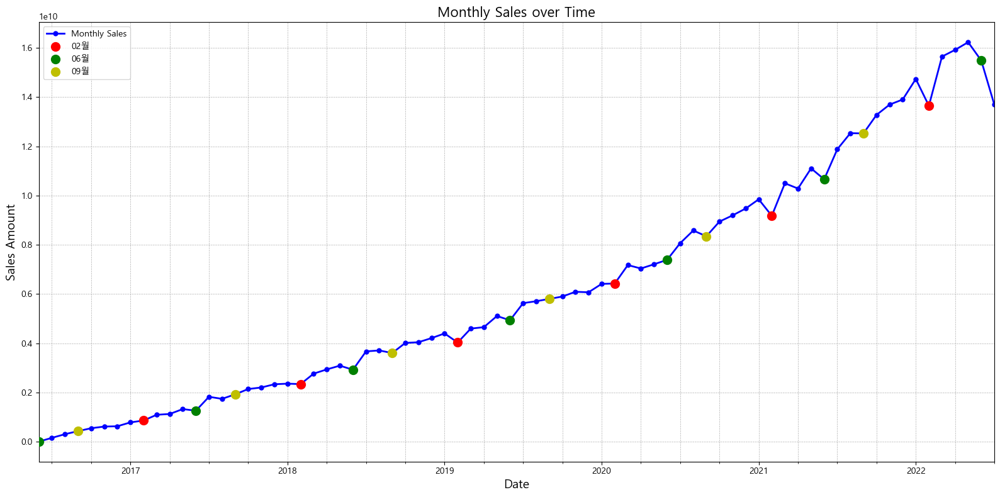

In [72]:
# Re-plotting the graph using the provided code

# Convert the 'order_date' column to datetime format again
df['order_date'] = pd.to_datetime(df['order_date'])

# Extract the month and year from the 'order_date' column
df['year_month'] = df['order_date'].dt.to_period('M')

# Group by the extracted year-month and sum up the 'quantity_price' column
monthly_sales = df.groupby('year_month')['quantity_price'].sum()

# Plotting
plt.figure(figsize=(16, 8))
monthly_sales.plot(linewidth=2, marker='o', markersize=5, color='b', label='Monthly Sales')

colors = ['r', 'g', 'y']
for idx, month in enumerate(highlight_months):
    subset = monthly_sales[monthly_sales.index.month == int(month)]
    plt.scatter(subset.index, subset.values, color=colors[idx], s=100, label=f'{month}월', zorder=5)

# Adding title and labels
plt.title("Monthly Sales over Time", fontsize=16)
plt.xlabel("Date", fontsize=14)
plt.ylabel("Sales Amount", fontsize=14)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.legend(loc='upper left')

# Display the plot
plt.tight_layout()
plt.show()


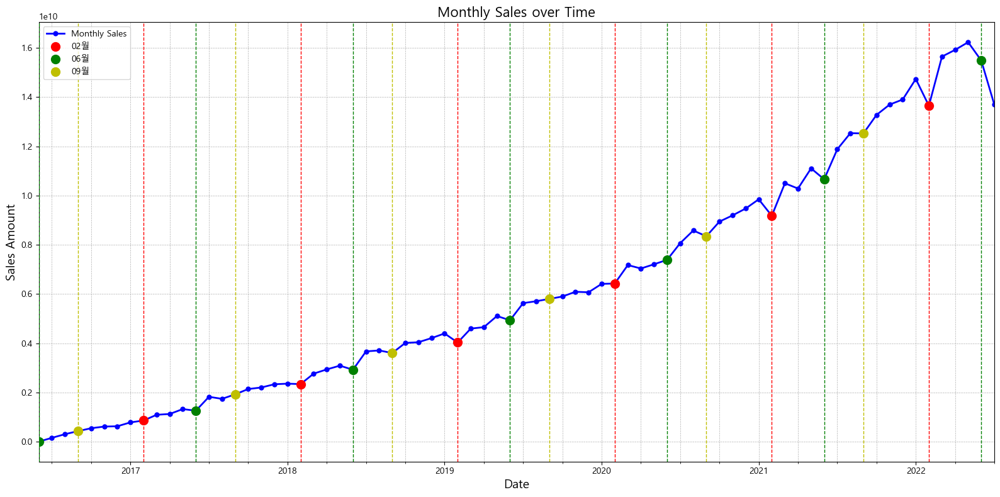

In [75]:
# Re-plotting the graph using the provided code with vertical lines for 2, 6, and 9 months

# Convert the 'order_date' column to datetime format again
df['order_date'] = pd.to_datetime(df['order_date'])

# Extract the month and year from the 'order_date' column
df['year_month'] = df['order_date'].dt.to_period('M')

# Group by the extracted year-month and sum up the 'quantity_price' column
monthly_sales = df.groupby('year_month')['quantity_price'].sum()

# Plotting
plt.figure(figsize=(16, 8))
monthly_sales.plot(linewidth=2, marker='o', markersize=5, color='b', label='Monthly Sales')

colors = ['r', 'g', 'y']
for idx, month in enumerate(highlight_months):
    subset = monthly_sales[monthly_sales.index.month == int(month)]
    for date in subset.index:
        plt.axvline(date, color=colors[idx], linestyle='--', linewidth=1, label=f'{month}월', zorder=5)

for idx, month in enumerate(highlight_months):
    subset = monthly_sales[monthly_sales.index.month == int(month)]
    plt.scatter(subset.index, subset.values, color=colors[idx], s=100, label=f'{month}월', zorder=5)

# Removing duplicate labels from the legend
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys(), loc='upper left')

# Adding title and labels
plt.title("Monthly Sales over Time", fontsize=16)
plt.xlabel("Date", fontsize=14)
plt.ylabel("Sales Amount", fontsize=14)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Display the plot
plt.tight_layout()
plt.show()


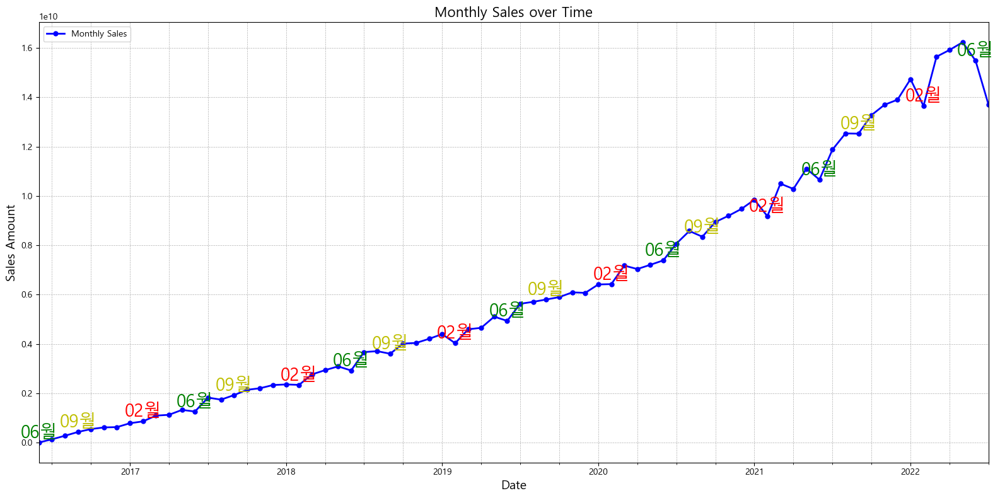

In [9]:
# Using the provided code to plot the graph

# Convert the 'order_date' column to datetime format
df['order_date'] = pd.to_datetime(df['order_date'])

# Extract the month and year from the 'order_date' column
df['year_month'] = df['order_date'].dt.to_period('M')

# Group by the extracted year-month and sum up the 'quantity_price' column
monthly_sales = df.groupby('year_month')['quantity_price'].sum()

# Filter out the months of interest
highlight_months = ['02', '06', '09']

# Plotting
plt.figure(figsize=(16, 8))
monthly_sales.plot(linewidth=2, marker='o', markersize=5, color='b', label='Monthly Sales')

colors = ['r', 'g', 'y']
for idx, month in enumerate(highlight_months):
    subset = monthly_sales[monthly_sales.index.month == int(month)]
    for date in subset.index:
        plt.text(date, subset[date] + 3000, f'{month}월', color=colors[idx], fontsize=20, ha='center', va='bottom')  # Adjusted the y value for better visualization

# Removing duplicate labels from the legend
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys(), loc='upper left')

# Adding title and labels
plt.title("Monthly Sales over Time", fontsize=16)
plt.xlabel("Date", fontsize=14)
plt.ylabel("Sales Amount", fontsize=14)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Display the plot
plt.tight_layout()
plt.show()


# 신규 유저, 현재 유저 리텐션

In [20]:
urs = pd.read_csv('user_active_rates.csv')

In [21]:
urs

,customer_id,first_join_date,2017-01-01,2017-05-01,2017-09-01,2018-01-01,2018-05-01,2018-09-01,2019-01-01,2019-05-01,2019-09-01,2020-01-01,2020-05-01,2020-09-01,2021-01-01,2021-05-01,2021-09-01,2022-01-01,2022-05-01
0,2870,2019-07-21,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,inactive_new,low_potential_new,low_potential_new,low_potential_new,low_potential_new,low_potential_new,low_potential_new,low_potential_new,low_potential_new
1,8193,2017-07-16,not_join_yet,not_join_yet,inactive_new,low_potential_new,low_potential_new,low_potential_new,low_potential_new,low_potential_new,low_potential_new,low_potential_new,low_potential_new,low_potential_new,low_potential_new,low_potential_new,low_potential_new,low_potential_new,low_potential_new
2,7279,2020-08-23,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,active_new,active_existing,active_existing,active_existing,active_existing,active_existing
3,88813,2021-10-03,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,inactive_new,low_potential_new
4,82542,2021-04-11,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,active_new,dormant,dormant,dormant
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99873,34743,2020-10-17,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,active_new,active_existing,active_existing,active_existing,active_existing
99874,72065,2017-11-25,not_join_yet,not_join_yet,not_join_yet,active_new,active_existing,active_existing,active_existing,active_existing,active_existing,active_existing,active_existing,active_existing,active_existing,active_existing,active_existing,active_existing,active_existing
99875,32818,2018-09-01,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,inactive_new,active_new,active_existing,active_existing,active_existing,active_existing,active_existing,active_existing,active_existing,active_existing,active_existing,active_existing
99876,75597,2020-05-31,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,not_join_yet,inactive_new,low_potential_new,low_potential_new,low_potential_new,low_potential_new,low_potential_new


In [22]:
# Extracting the renamed column names from the provided list
renamed_columns_list = [
    'customer_id',
    'first_join_date',
    '2016년 9월~12월',
    '2017년 1월~4월',
    '2017년 5월~8월',
    '2017년 9월~12월',
    '2018년 1월~4월',
    '2018년 5월~8월',
    '2018년 9월~12월',
    '2019년 1월~4월',
    '2019년 5월~8월',
    '2019년 9월~12월',
    '2020년 1월~4월',
    '2020년 5월~8월',
    '2020년 9월~12월',
    '2021년 1월~4월',
    '2021년 5월~8월',
    '2021년 9월~12월',
    '2022년 1월~4월'
]

urs.columns = renamed_columns_list


In [26]:
urs.to_csv("user_active_rates.csv", index=False, encoding="utf-8-sig")

In [32]:
urs['2019년 5월~8월'].unique()

array(['inactive_new', 'low_potential_new', 'not_join_yet',
       'active_existing', 'dormant', 'active_new', 'resurrected'],
      dtype=object)

In [28]:
retention_data = {}

for col in urs.columns[2:]:  # Starting from the 3rd column (0-indexed)
    num_active_new = len(urs[urs[col] == "active_new"])
    num_active_or_inactive_new = len(urs[(urs[col] == "active_new") | (urs[col] == "inactive_new")])
    
    ratio = num_active_new / num_active_or_inactive_new if num_active_or_inactive_new != 0 else 0
    retention_data[col] = [ratio]

retention_df = pd.DataFrame(retention_data, index=['신규 유저 리텐션'])
retention_df


,2016년 9월~12월,2017년 1월~4월,2017년 5월~8월,2017년 9월~12월,2018년 1월~4월,2018년 5월~8월,2018년 9월~12월,2019년 1월~4월,2019년 5월~8월,2019년 9월~12월,2020년 1월~4월,2020년 5월~8월,2020년 9월~12월,2021년 1월~4월,2021년 5월~8월,2021년 9월~12월,2022년 1월~4월
신규 유저 리텐션,0.434171,0.601721,0.545211,0.522301,0.567951,0.514345,0.50566,0.562274,0.497486,0.482691,0.5465,0.490909,0.474734,0.514746,0.446682,0.418798,0.435394


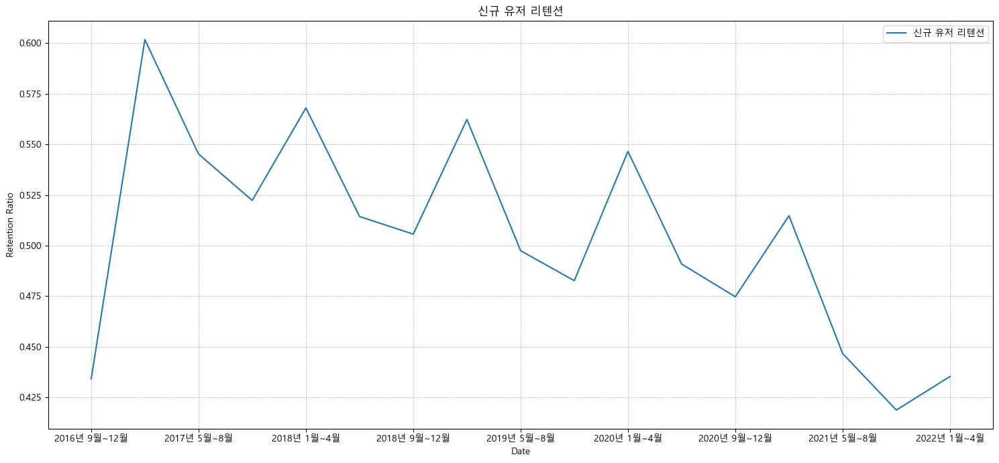

In [30]:
# Plotting
plt.figure(figsize=(15, 7))
retention_df.T.plot(ax=plt.gca())  # Transpose to get dates as x-axis
plt.title("신규 유저 리텐션")
plt.rcParams['font.family'] = 'Malgun Gothic'
plt.xticks(rotation=0)
plt.ylabel("Retention Ratio")
plt.xlabel("Date")
plt.tight_layout()
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.legend(loc="upper right")
plt.show()


## 현재 유저 수

<Figure size 1400x700 with 0 Axes>

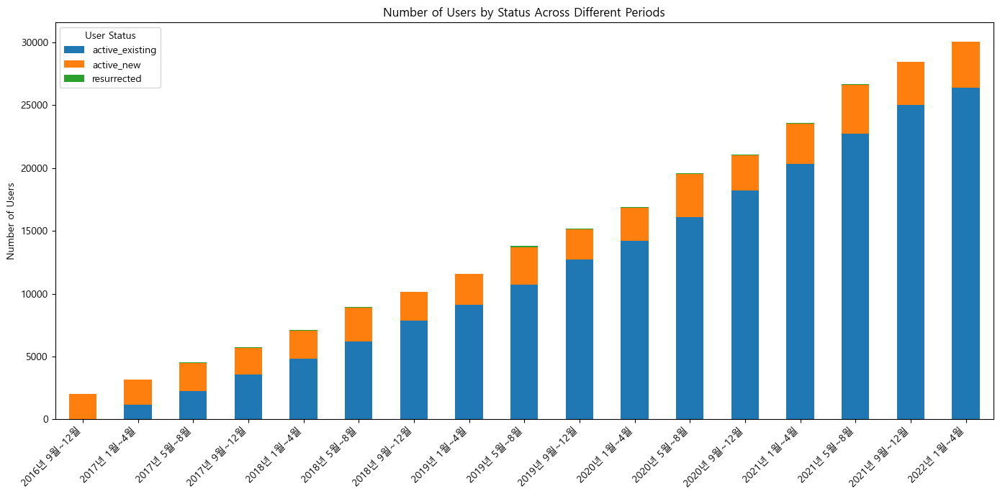

In [37]:
# Summarized code for user's convenience

# 2. Drop the columns that are not period-status related
status_data = urs.drop(columns=['customer_id', 'first_join_date'])

# 3. Initialize an empty dictionary to hold the counts for each status in each period
status_count_dict = {col: Counter() for col in status_data.columns}

# 4. Update the counts for each status in each period
for col in status_data.columns:
    status_count_dict[col].update(status_data[col].value_counts().to_dict())

# 5. Filter only the statuses we're interested in and prepare data for plotting
plot_data = {}
for period, counts in status_count_dict.items():
    plot_data[period] = {status: counts.get(status, 0) for status in ['active_existing', 'active_new', 'resurrected']}

# 6. Convert to DataFrame for easier plotting
plot_df = pd.DataFrame(plot_data)

# 7. Plotting
plt.figure(figsize=(14, 7))
plot_df.transpose().plot(kind='bar', stacked=True, figsize=(14, 7))
plt.xticks(rotation=45, ha='right')
plt.ylabel('Number of Users')
plt.title('Number of Users by Status Across Different Periods')
plt.legend(title='User Status')
plt.tight_layout()
plt.show()


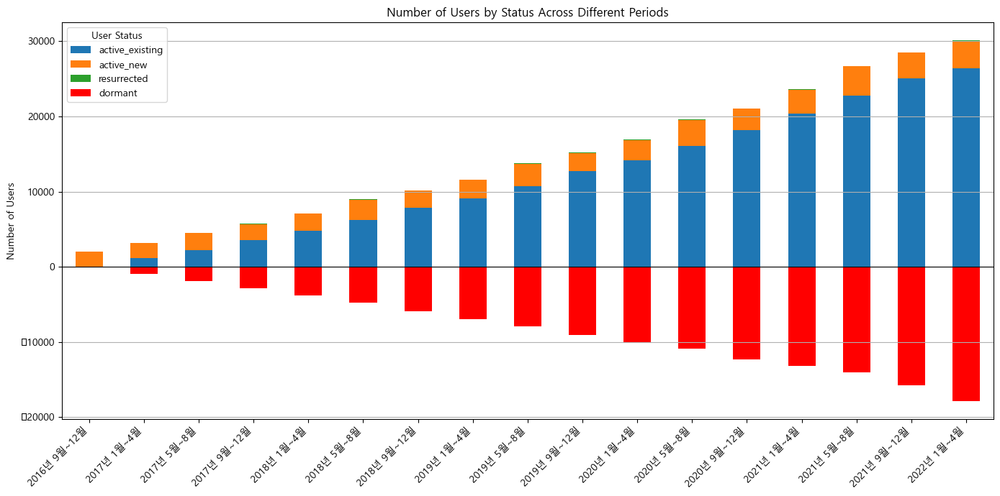

In [106]:
from collections import Counter
import matplotlib.pyplot as plt

# Drop the columns that are not period-status related
status_data = urs.drop(columns=['customer_id', 'first_join_date'])

# Initialize an empty dictionary to hold the counts for each status in each period
status_count_dict = {col: Counter() for col in status_data.columns}

# Update the counts for each status in each period
for col in status_data.columns:
    status_count_dict[col].update(status_data[col].value_counts().to_dict())

# Filter only the statuses we're interested in and prepare data for plotting
plot_data = {}
for period, counts in status_count_dict.items():
    plot_data[period] = {status: counts.get(status, 0) for status in ['active_existing', 'active_new', 'resurrected', 'dormant']}

# Convert to DataFrame for easier plotting
plot_df = pd.DataFrame(plot_data)

# Plotting with x-axis in the center and dormant counts below the x-axis
plt.figure(figsize=(14, 7))
ax = plot_df.drop('dormant', axis=0).transpose().plot(kind='bar', stacked=True, figsize=(14, 7), ax=plt.gca())
plot_df.loc['dormant'].mul(-1).transpose().plot(kind='bar', color='red', ax=ax)

# Adjusting the plot
plt.axhline(0, color='black',linewidth=0.8)
plt.xticks(rotation=45, ha='right')
plt.ylabel('Number of Users')
plt.title('Number of Users by Status Across Different Periods')
plt.legend(title='User Status', loc='upper left')
plt.tight_layout()
plt.grid(axis='y')
plt.show()



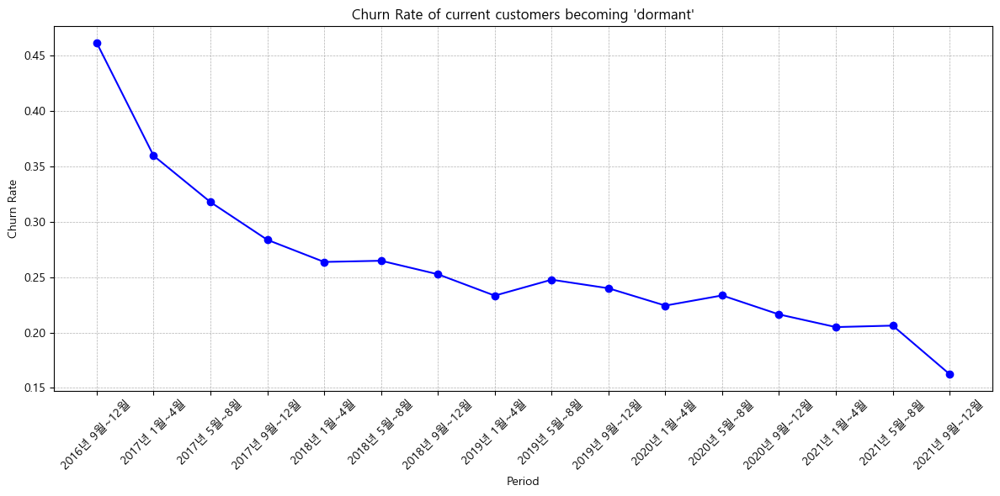

In [128]:
# Create a list to store churn rates for the current customers
current_churn_rates = []

# Loop through each period to calculate the churn rate for current customers
for i in range(len(periods) - 1):
    current_customer_count = ((urs[periods[i]] == 'active_existing') |
                              (urs[periods[i]] == 'active_new') |
                              (urs[periods[i]] == 'resurrected')).sum()
    
    dormant_next_period_count = (((urs[periods[i]] == 'active_existing') |
                                  (urs[periods[i]] == 'active_new') |
                                  (urs[periods[i]] == 'resurrected')) & 
                                 (urs[periods[i+1]] == 'dormant')).sum()
    
    # Calculate the churn rate for the period and append to the list
    if current_customer_count != 0:
        churn_rate = dormant_next_period_count / current_customer_count
    else:
        churn_rate = 0
        
    current_churn_rates.append(churn_rate)

# Plotting the churn rates for current customers
plt.figure(figsize=(12, 6))
plt.plot(periods[:-1], current_churn_rates, marker='o', color='blue')
plt.xticks(rotation=45)
plt.title("Churn Rate of current customers becoming 'dormant'")
plt.ylabel("Churn Rate")
plt.xlabel("Period")
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()

plt.show()


### 현재 고객 이탈률

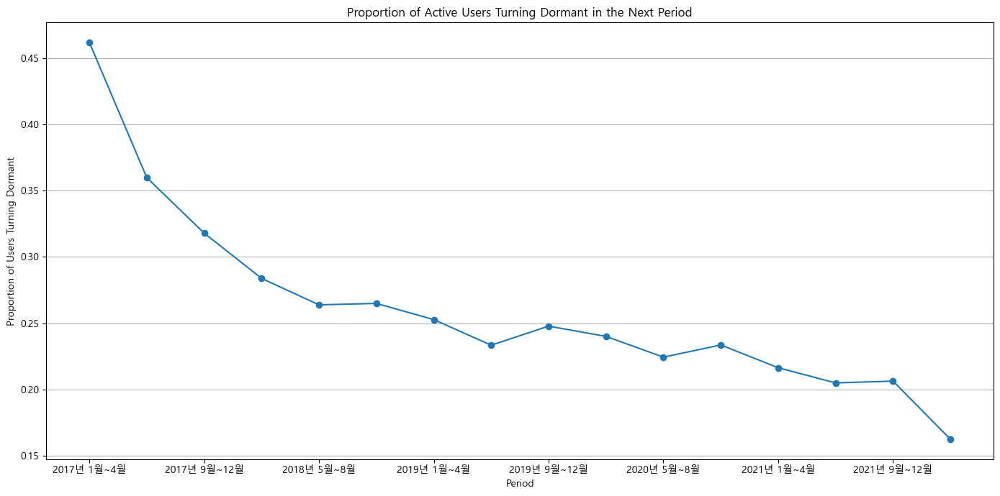

In [121]:
# Drop unnecessary columns
status_data = urs.drop(columns=['customer_id', 'first_join_date'])

# Calculate the proportion of users that turn dormant in the next period
dormant_proportions = {}

# Iterate over each period except the last one
for i in range(len(status_data.columns) - 1):
    past_period = status_data.columns[i]
    current_period = status_data.columns[i + 1]
    
    # Identify users that were active (existing, new, resurrected) in the past period
    active_users = set(status_data[status_data[past_period].isin(['active_existing', 'active_new', 'resurrected'])].index)
    
    # From those users, identify users who are 'dormant' in the current period
    dormant_users = set(status_data[status_data[current_period] == 'dormant'].index)
    common_users = active_users.intersection(dormant_users)
    
    # Store the proportion of active users that turned dormant
    dormant_proportions[current_period] = len(common_users) / len(active_users) if active_users else 0

dormant_proportions_series = pd.Series(dormant_proportions)

# Plotting the proportions
plt.figure(figsize=(14, 7))
dormant_proportions_series.plot(marker='o', linestyle='-')
plt.title('Proportion of Active Users Turning Dormant in the Next Period')
plt.xlabel('Period')
plt.ylabel('Proportion of Users Turning Dormant')
plt.grid(axis='y')
plt.tight_layout()
plt.show()


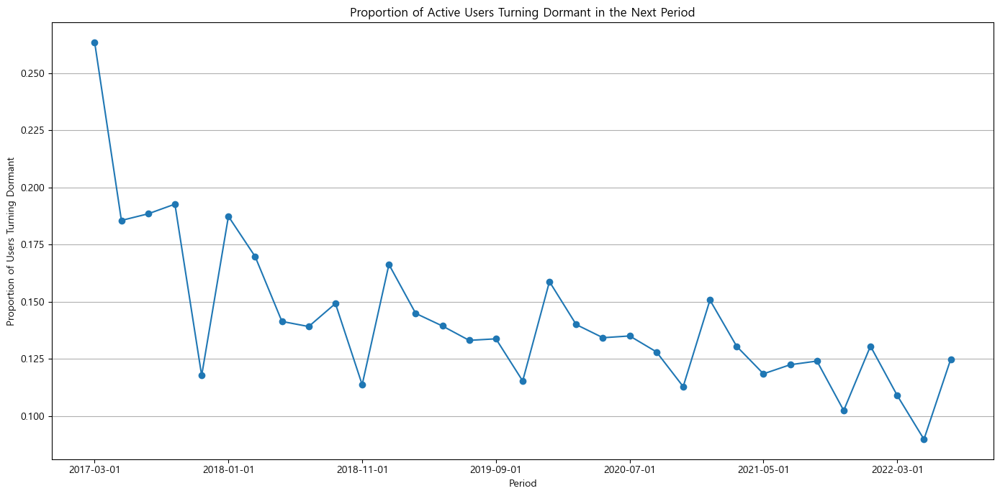

In [50]:
# Drop unnecessary columns
status_data = urs.drop(columns=['customer_id', 'first_join_date'])

# Calculate the proportion of users that turn dormant in the next period
dormant_proportions = {}

# Iterate over each period except the last one
for i in range(len(status_data.columns) - 1):
    past_period = status_data.columns[i]
    current_period = status_data.columns[i + 1]
    
    # Identify users that were active (existing, new, resurrected) in the past period
    active_users = set(status_data[status_data[past_period].isin(['active_existing', 'active_new', 'resurrected'])].index)
    
    # From those users, identify users who are 'dormant' in the current period
    dormant_users = set(status_data[status_data[current_period] == 'dormant'].index)
    common_users = active_users.intersection(dormant_users)
    
    # Store the proportion of active users that turned dormant
    dormant_proportions[current_period] = len(common_users) / len(active_users) if active_users else 0

dormant_proportions_series = pd.Series(dormant_proportions)

# Plotting the proportions
plt.figure(figsize=(14, 7))
dormant_proportions_series.plot(marker='o', linestyle='-')
plt.title('Proportion of Active Users Turning Dormant in the Next Period')
plt.xlabel('Period')
plt.ylabel('Proportion of Users Turning Dormant')
plt.grid(axis='y')
plt.tight_layout()
plt.show()


# 신규 고객 리텐션

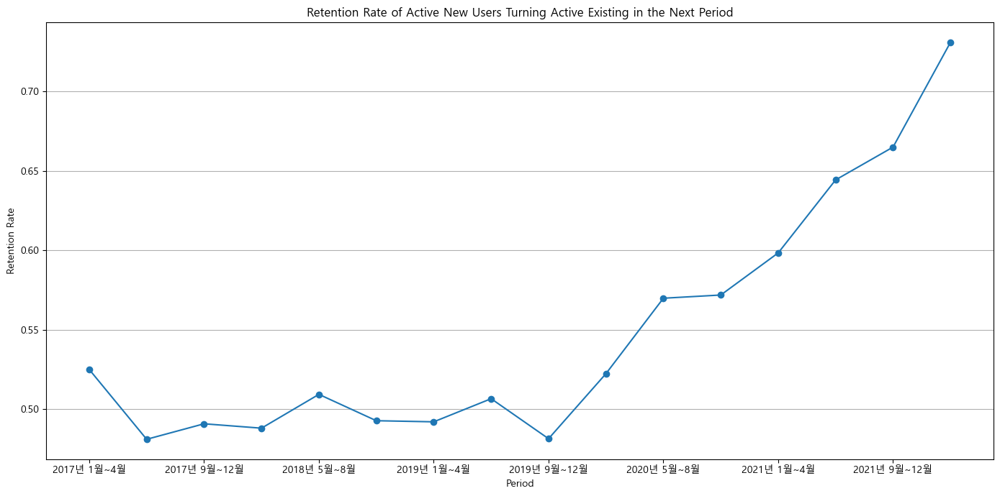

In [122]:
# Drop unnecessary columns
status_data = urs.drop(columns=['customer_id', 'first_join_date'])

# Calculate the retention rate of users that were 'active_new' and turned 'active_existing' in the next period
retention_rates = {}

# Iterate over each period except the last one
for i in range(len(status_data.columns) - 1):
    past_period = status_data.columns[i]
    current_period = status_data.columns[i + 1]
    
    # Identify users that were 'active_new' in the past period
    new_users = set(status_data[status_data[past_period] == 'active_new'].index)
    
    # From those users, identify users who are 'active_existing' in the current period
    retained_users = set(status_data[status_data[current_period] == 'active_existing'].index)
    common_users = new_users.intersection(retained_users)
    
    # Store the retention rate of 'active_new' users that turned 'active_existing'
    retention_rates[current_period] = len(common_users) / len(new_users) if new_users else 0

retention_rates_series = pd.Series(retention_rates)

# Plotting the retention rates
plt.figure(figsize=(14, 7))
retention_rates_series.plot(marker='o', linestyle='-')
plt.title('Retention Rate of Active New Users Turning Active Existing in the Next Period')
plt.xlabel('Period')
plt.ylabel('Retention Rate')
plt.grid(axis='y')
plt.tight_layout()
plt.show()


### 신규 고객 이탈률

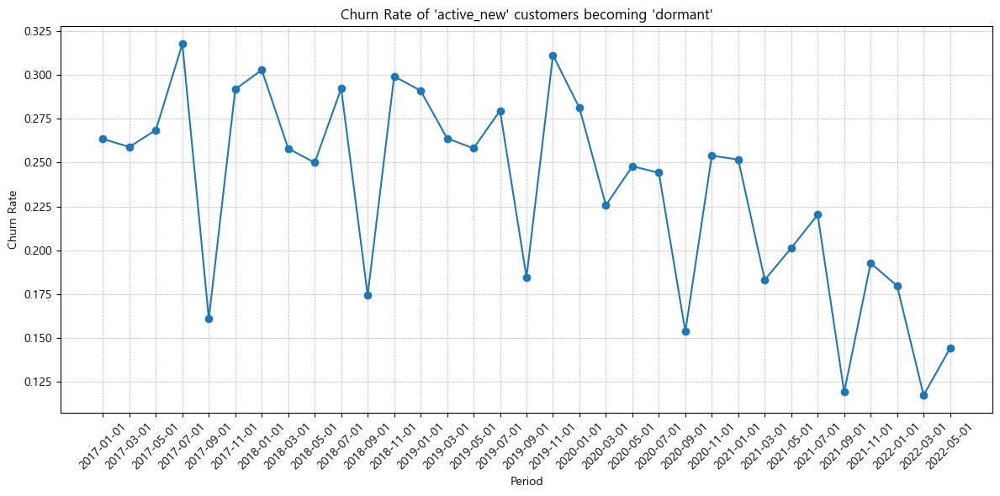

In [51]:

# Extracting the columns representing the periods
periods = urs.columns[2:]

# Create a list to store churn rates
churn_rates = []

# Loop through each period to calculate the churn rate
for i in range(len(periods) - 1):
    active_new_count = (urs[periods[i]] == 'active_new').sum()
    dormant_next_period_count = ((urs[periods[i]] == 'active_new') & (urs[periods[i+1]] == 'dormant')).sum()
    
    # Calculate the churn rate for the period and append to the list
    if active_new_count != 0:
        churn_rate = dormant_next_period_count / active_new_count
    else:
        churn_rate = 0
        
    churn_rates.append(churn_rate)

# Plotting the churn rates
plt.figure(figsize=(12, 6))
plt.plot(periods[:-1], churn_rates, marker='o')
plt.xticks(rotation=45)
plt.title("Churn Rate of 'active_new' customers becoming 'dormant'")
plt.ylabel("Churn Rate")
plt.xlabel("Period")
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()

plt.show()


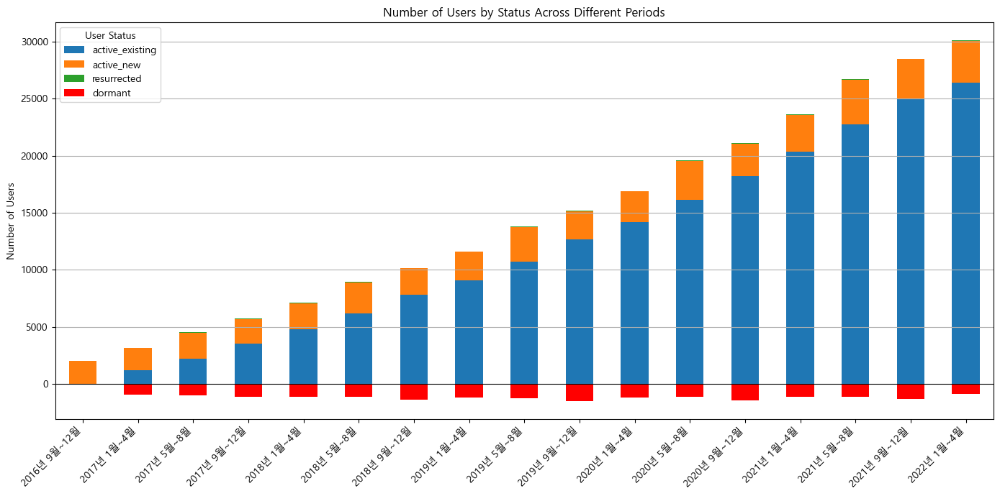

In [107]:
# Identify users who were 'active_new' in the past and 'dormant' in the current period
dormant_after_active_new_counts = {}

# Iterate over each period except the last one
for i in range(len(status_data.columns) - 1):
    past_period = status_data.columns[i]
    current_period = status_data.columns[i + 1]
    
    # Identify users who were 'active_new' in the past period
    active_new_users = set(status_data[status_data[past_period] == 'active_new'].index)
    
    # From those users, identify users who are 'dormant' in the current period
    dormant_users = set(status_data[status_data[current_period] == 'dormant'].index)
    common_users = active_new_users.intersection(dormant_users)
    
    # Store the count of such users
    dormant_after_active_new_counts[current_period] = len(common_users)

# Update the dormant row in plot_df with these counts
plot_df.loc['dormant'] = pd.Series(dormant_after_active_new_counts)

# Plotting with the updated dormant data
plt.figure(figsize=(14, 7))
ax = plot_df.drop('dormant', axis=0).transpose().plot(kind='bar', stacked=True, figsize=(14, 7), ax=plt.gca())
plot_df.loc['dormant'].mul(-1).transpose().plot(kind='bar', color='red', ax=ax)

# Adjusting the plot
plt.axhline(0, color='black',linewidth=0.8)
plt.xticks(rotation=45, ha='right')
plt.ylabel('Number of Users')
plt.title('Number of Users by Status Across Different Periods')
plt.legend(title='User Status', loc='upper left')
plt.tight_layout()
plt.grid(axis='y')
plt.show()


# 활성 잔존 유저 리텐션

In [44]:
retention_rates = {
 '2017년 5월~8월': 0.8994082840236687,
 '2017년 9월~12월': 0.8872046366473473,
 '2018년 1월~4월': 0.8614000562271578,
 '2018년 5월~8월': 0.8474295190713101,
 '2018년 9월~12월': 0.8426911907066795,
 '2019년 1월~4월': 0.8238745058028313,
 '2019년 5월~8월': 0.8384437850313221,
 '2019년 9월~12월': 0.8308193668528864,
 '2020년 1월~4월': 0.8076711034102544,
 '2020년 5월~8월': 0.8159785824996477,
 '2020년 9월~12월': 0.8089385474860336,
 '2021년 1월~4월': 0.814118423222827,
 '2021년 5월~8월': 0.8199331629644191,
 '2021년 9월~12월': 0.8165867815839233,
 '2022년 1월~4월': 0.8514020931533115}

In [47]:
retention_rates_series

2017년 5월~8월     0.899408
2017년 9월~12월    0.887205
2018년 1월~4월     0.861400
2018년 5월~8월     0.847430
2018년 9월~12월    0.842691
2019년 1월~4월     0.823875
2019년 5월~8월     0.838444
2019년 9월~12월    0.830819
2020년 1월~4월     0.807671
2020년 5월~8월     0.815979
2020년 9월~12월    0.808939
2021년 1월~4월     0.814118
2021년 5월~8월     0.819933
2021년 9월~12월    0.816587
2022년 1월~4월     0.851402
2017년 1월~4월     0.000000
dtype: float64

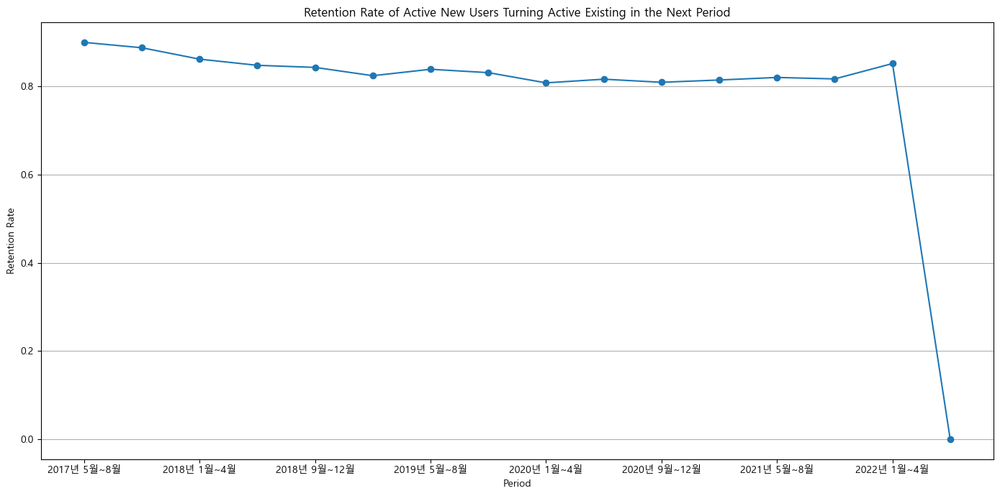

In [45]:
# Drop unnecessary columns
status_data = urs.drop(columns=['customer_id', 'first_join_date'])

# Calculate the retention rate of users that were 'active_new' and turned 'active_existing' in the next period

# Iterate over each period except the last one
for i in range(len(status_data.columns) - 1):
    past_period = status_data.columns[i]
    current_period = status_data.columns[i + 1]
    
    # Identify users that were 'active_new' in the past period
    new_users = set(status_data[status_data[past_period] == 'active_existing'].index)
    
    # From those users, identify users who are 'active_existing' in the current period
    retained_users = set(status_data[status_data[current_period] == 'active_existing'].index)
    common_users = new_users.intersection(retained_users)
    
    # Store the retention rate of 'active_new' users that turned 'active_existing'
    retention_rates[current_period] = len(common_users) / len(new_users) if new_users else 0

retention_rates_series = pd.Series(retention_rates)

# Plotting the retention rates
plt.figure(figsize=(14, 7))
retention_rates_series.plot(marker='o', linestyle='-')
plt.title('Retention Rate of Active New Users Turning Active Existing in the Next Period')
plt.xlabel('Period')
plt.ylabel('Retention Rate')
plt.grid(axis='y')
plt.tight_layout()
plt.show()


### 활성 잔존 유저 이탈률
이탈 유저 수는 꾸준히 증가중 </br>
이탈률도 증가할까?

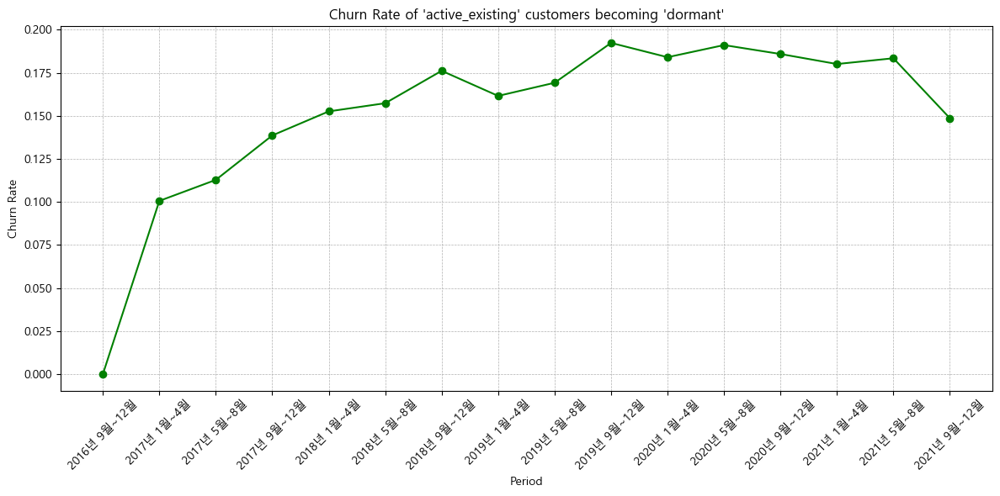

In [130]:
# Create a list to store churn rates for active existing customers
active_existing_churn_rates = []

# Loop through each period to calculate the churn rate for active existing customers
for i in range(len(periods) - 1):
    active_existing_count = (urs[periods[i]] == 'active_existing').sum()
    
    dormant_next_period_count = ((urs[periods[i]] == 'active_existing') & 
                                 (urs[periods[i+1]] == 'dormant')).sum()
    
    # Calculate the churn rate for the period and append to the list
    if active_existing_count != 0:
        churn_rate = dormant_next_period_count / active_existing_count
    else:
        churn_rate = 0
        
    active_existing_churn_rates.append(churn_rate)

# Plotting the churn rates for active existing customers
plt.figure(figsize=(12, 6))
plt.plot(periods[:-1], active_existing_churn_rates, marker='o', color='green')
plt.xticks(rotation=45)
plt.title("Churn Rate of 'active_existing' customers becoming 'dormant'")
plt.ylabel("Churn Rate")
plt.xlabel("Period")
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()

plt.show()


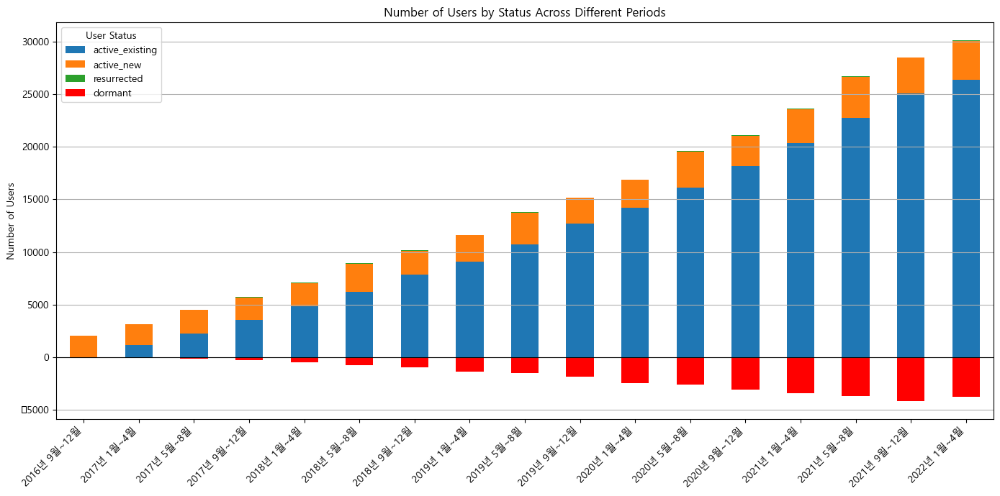

In [110]:
# Identify users who were 'active_existing' in the past and 'dormant' in the current period
dormant_after_active_existing_counts = {}

# Iterate over each period except the last one
for i in range(len(status_data.columns) - 1):
    past_period = status_data.columns[i]
    current_period = status_data.columns[i + 1]
    
    # Identify users who were 'active_existing' in the past period
    active_existing_users = set(status_data[status_data[past_period] == 'active_existing'].index)
    
    # From those users, identify users who are 'dormant' in the current period
    dormant_users = set(status_data[status_data[current_period] == 'dormant'].index)
    common_users = active_existing_users.intersection(dormant_users)
    
    # Store the count of such users
    dormant_after_active_existing_counts[current_period] = len(common_users)

# Update the dormant row in plot_df with these counts
plot_df.loc['dormant'] = pd.Series(dormant_after_active_existing_counts)

# Plotting with the updated dormant data
plt.figure(figsize=(14, 7))
ax = plot_df.drop('dormant', axis=0).transpose().plot(kind='bar', stacked=True, figsize=(14, 7), ax=plt.gca())
plot_df.loc['dormant'].mul(-1).transpose().plot(kind='bar', color='red', ax=ax)

# Adjusting the plot
plt.axhline(0, color='black',linewidth=0.8)
plt.xticks(rotation=45, ha='right')
plt.ylabel('Number of Users')
plt.title('Number of Users by Status Across Different Periods')
plt.legend(title='User Status', loc='upper left')
plt.tight_layout()
plt.grid(axis='y')
plt.show()


In [ ]:
# Identify users who were 'active_new' in the past and 'dormant' in the current period
dormant_after_active_new_counts = {}

# Iterate over each period except the last one
for i in range(len(status_data.columns) - 1):
    past_period = status_data.columns[i]
    current_period = status_data.columns[i + 1]
    
    # Identify users who were 'active_new' in the past period
    active_new_users = set(status_data[status_data[past_period] == 'active_new'].index)
    
    # From those users, identify users who are 'dormant' in the current period
    dormant_users = set(status_data[status_data[current_period] == 'dormant'].index)
    common_users = active_new_users.intersection(dormant_users)
    
    # Store the count of such users
    dormant_after_active_new_counts[current_period] = len(common_users)

# Update the dormant row in plot_df with these counts
plot_df.loc['dormant'] = pd.Series(dormant_after_active_new_counts)

# Plotting with the updated dormant data
plt.figure(figsize=(14, 7))
ax = plot_df.drop('dormant', axis=0).transpose().plot(kind='bar', stacked=True, figsize=(14, 7), ax=plt.gca())
plot_df.loc['dormant'].mul(-1).transpose().plot(kind='bar', color='red', ax=ax)

# Adjusting the plot
plt.axhline(0, color='black',linewidth=0.8)
plt.xticks(rotation=45, ha='right')
plt.ylabel('Number of Users')
plt.title('Number of Users by Status Across Different Periods')
plt.legend(title='User Status', loc='upper left')
plt.tight_layout()
plt.grid(axis='y')
plt.show()


### 현재 유저 중 액티브 잔존 유저 비율

In [45]:
# Calculate the ratio of active_existing to the sum of active_new and resurrected for each column
ratio = plot_df.loc['active_existing'] / (plot_df.loc['active_new'] + plot_df.loc['resurrected'] + plot_df.loc['active_existing'])

# Convert the series to a dataframe with the specified row name
ratio_df = pd.DataFrame([ratio], index=['현재 유저 중 액티브 잔존 유저 비율'])
ratio_df


,2016년 9월~12월,2017년 1월~4월,2017년 5월~8월,2017년 9월~12월,2018년 1월~4월,2018년 5월~8월,2018년 9월~12월,2019년 1월~4월,2019년 5월~8월,2019년 9월~12월,2020년 1월~4월,2020년 5월~8월,2020년 9월~12월,2021년 1월~4월,2021년 5월~8월,2021년 9월~12월,2022년 1월~4월
현재 유저 중 액티브 잔존 유저 비율,0.0,0.376632,0.493401,0.619255,0.678672,0.69151,0.77236,0.784329,0.777979,0.835769,0.84018,0.823031,0.86261,0.862021,0.852329,0.878972,0.87677


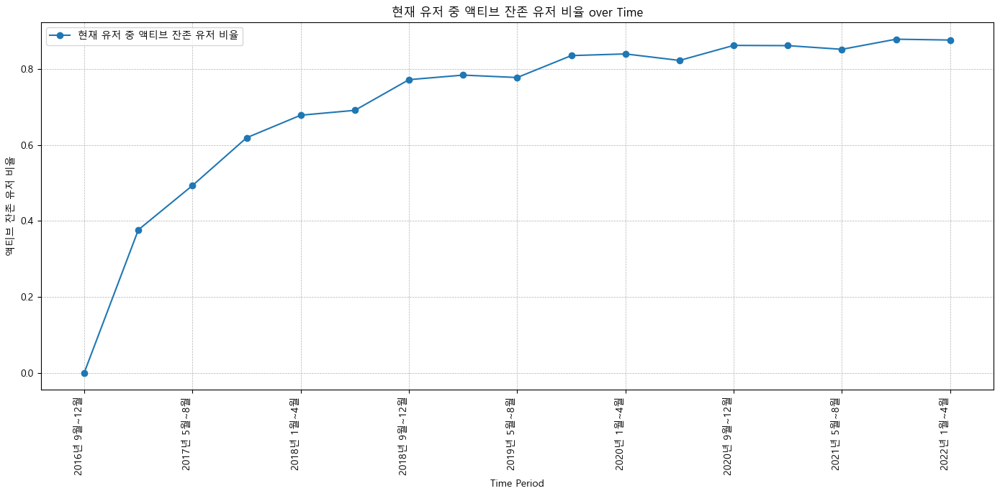

In [46]:
# Plotting the ratio as a line graph
plt.figure(figsize=(14,7))
ratio_df.transpose().plot(ax=plt.gca(), marker='o', linestyle='-')
plt.title('현재 유저 중 액티브 잔존 유저 비율 over Time')
plt.ylabel('액티브 잔존 유저 비율')
plt.xlabel('Time Period')
plt.xticks(rotation=90, ha='right')
plt.tight_layout()
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.show()


In [47]:
# Calculate the ratio of active_new to the sum of active_existing and resurrected for each column
new_ratio = plot_df.loc['active_new'] / (plot_df.loc['active_existing'] + plot_df.loc['active_new']+ plot_df.loc['resurrected'])

# Convert the series to a dataframe with the specified row name
new_ratio_df = pd.DataFrame([new_ratio], index=['현재 유저 중 액티브 신규 유저 비율'])

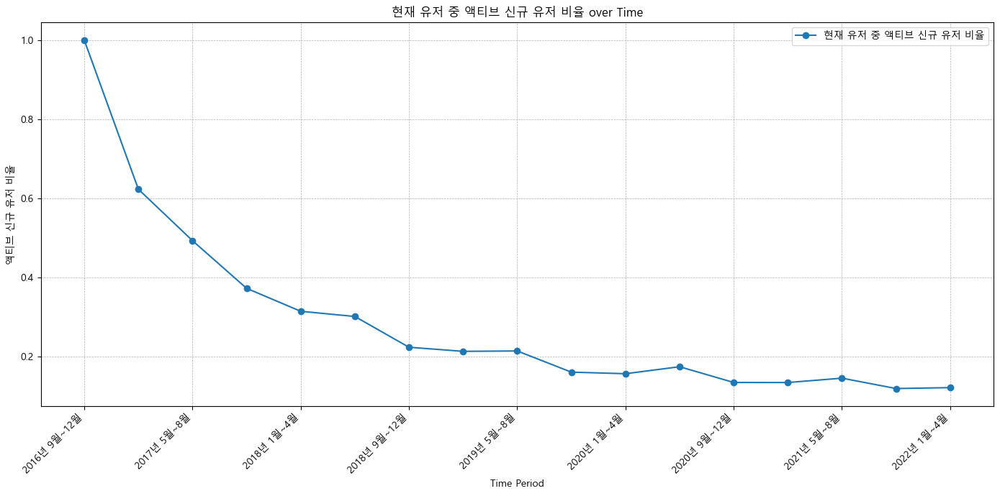

In [48]:


# Plotting the ratio as a line graph
plt.figure(figsize=(14,7))
new_ratio_df.transpose().plot(ax=plt.gca(), marker='o', linestyle='-')
plt.title('현재 유저 중 액티브 신규 유저 비율 over Time')
plt.ylabel('액티브 신규 유저 비율')
plt.xlabel('Time Period')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.show()


In [49]:
# Calculate the ratio of resurrected to the sum of active_existing, active_new, and resurrected for each column
resurrected_ratio = plot_df.loc['resurrected'] / plot_df.sum()

# Convert the series to a dataframe with the specified row name
resurrected_ratio_df = pd.DataFrame([resurrected_ratio], index=['현재 유저 중 복귀 유저 비율'])
resurrected_ratio_df


,2016년 9월~12월,2017년 1월~4월,2017년 5월~8월,2017년 9월~12월,2018년 1월~4월,2018년 5월~8월,2018년 9월~12월,2019년 1월~4월,2019년 5월~8월,2019년 9월~12월,2020년 1월~4월,2020년 5월~8월,2020년 9월~12월,2021년 1월~4월,2021년 5월~8월,2021년 9월~12월,2022년 1월~4월
현재 유저 중 복귀 유저 비율,0.0,0.0,0.013198,0.00766,0.00619,0.006471,0.003251,0.001638,0.007026,0.002699,0.002249,0.001788,0.001944,0.002669,0.001349,0.000878,0.000798


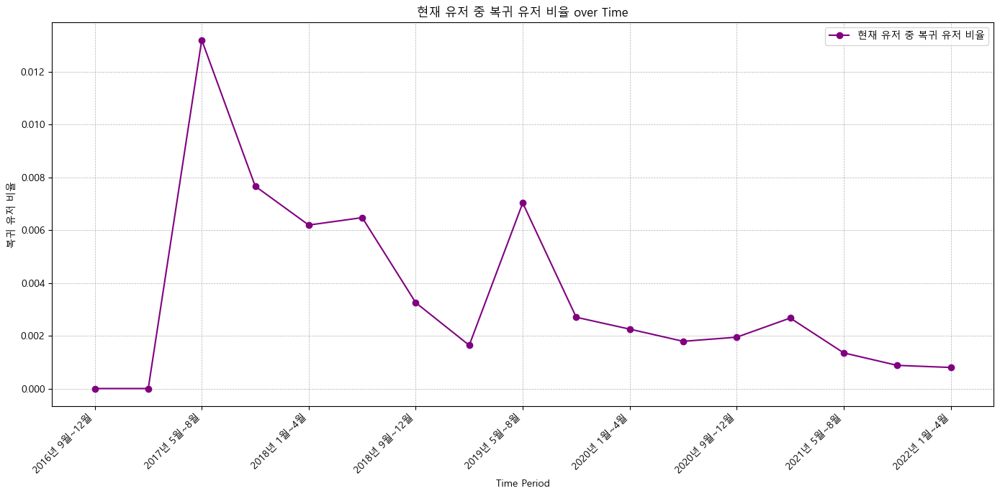

In [50]:
# Plotting the resurrected ratio as a line graph
plt.figure(figsize=(14,7))
resurrected_ratio_df.transpose().plot(ax=plt.gca(), marker='o', linestyle='-', color='purple')
plt.title('현재 유저 중 복귀 유저 비율 over Time')
plt.ylabel('복귀 유저 비율')
plt.xlabel('Time Period')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.show()


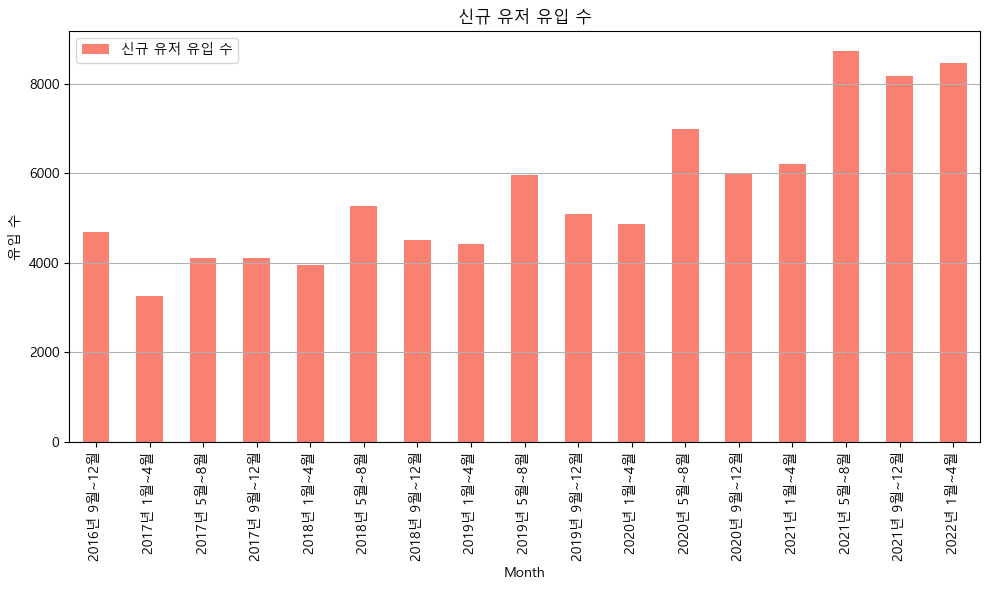

In [97]:
# 신규 유저 수
# Filter only columns with user join and create a count dataframe
new_join_data = urs.drop(columns=['customer_id', 'first_join_date'])
new_join_counts = new_join_data.apply(lambda x: x.value_counts()).fillna(0).transpose()

# Calculate the churn rate for new users
new_join_counts['신규 유저 유입 수'] = new_join_counts['active_new'] + new_join_counts['inactive_new']
new_join_counts['활성 신규 유저 수'] = new_join_counts['active_new'] 
new_join_counts['비활성 신규 유저 수'] = new_join_counts['inactive_new'] 



# Extract only the churn rate
new_join_df = new_join_counts[['신규 유저 유입 수']]
new_join_df

new_join_df.plot(kind='bar', figsize=(10, 6), color='salmon')
plt.title("신규 유저 유입 수")
plt.ylabel("유입 수")
plt.xlabel("Month")
plt.xticks(rotation=90)
plt.grid(axis='y')

plt.tight_layout()
plt.show()

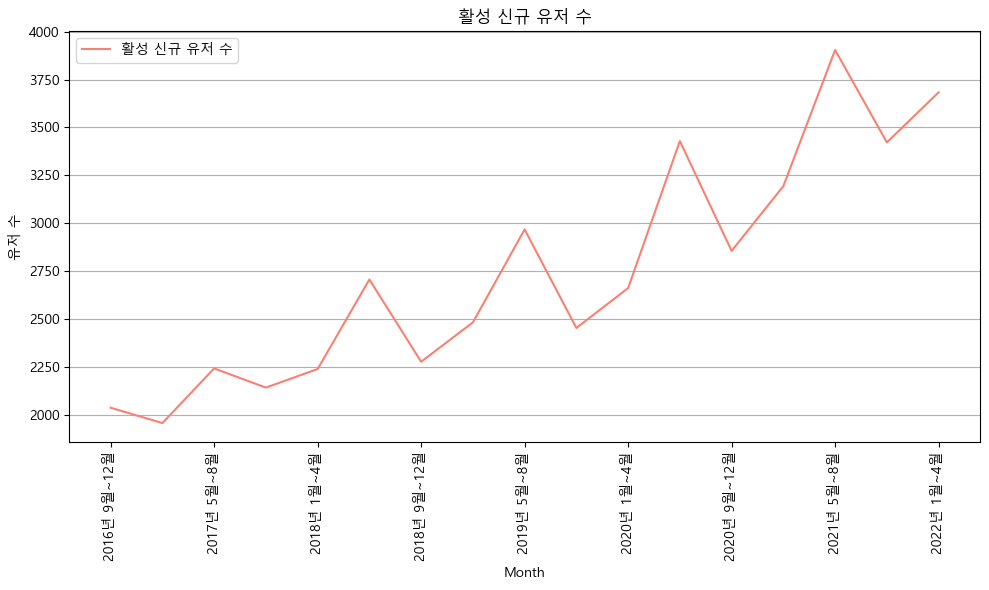

In [98]:
# 신규 유저 수
# Filter only columns with user join and create a count dataframe
new_join_data = urs.drop(columns=['customer_id', 'first_join_date'])
new_join_counts = new_join_data.apply(lambda x: x.value_counts()).fillna(0).transpose()

# Calculate the churn rate for new users
new_join_counts['신규 유저 유입 수'] = new_join_counts['active_new'] + new_join_counts['inactive_new']
new_join_counts['활성 신규 유저 수'] = new_join_counts['active_new'] 
new_join_counts['비활성 신규 유저 수'] = new_join_counts['inactive_new'] 



# Extract only the churn rate
new_join_df = new_join_counts[['활성 신규 유저 수']]
new_join_df

new_join_df.plot(kind='line', figsize=(10, 6), color='salmon')
plt.title("활성 신규 유저 수")
plt.ylabel("유저 수")
plt.xlabel("Month")
plt.xticks(rotation=90)
plt.grid(axis='y')

plt.tight_layout()
plt.show()

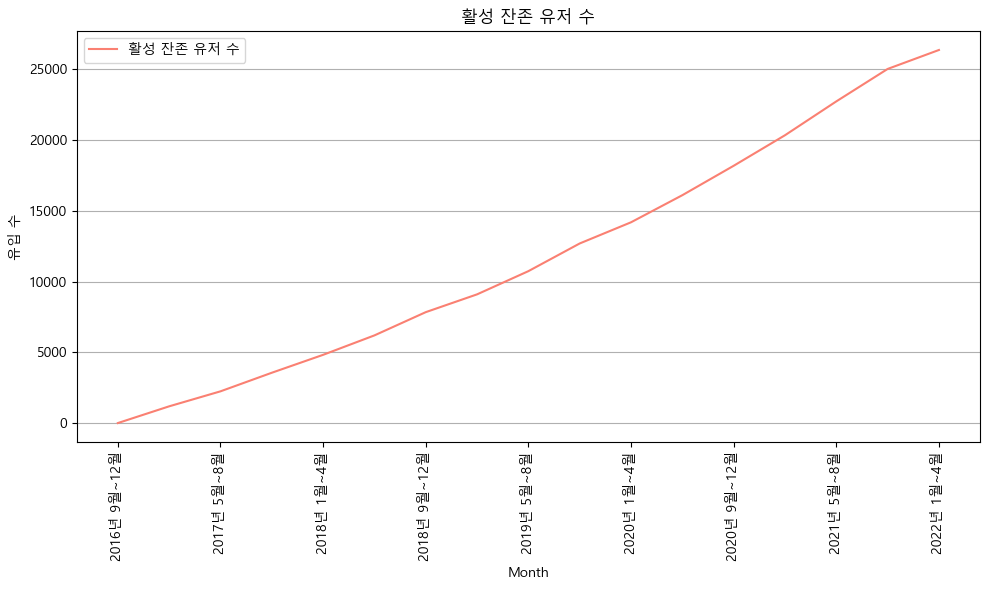

In [158]:
# 활성 유저 수
# Filter only columns with user join and create a count dataframe
existing_data = urs.drop(columns=['customer_id', 'first_join_date'])
existing_counts = existing_data.apply(lambda x: x.value_counts()).fillna(0).transpose()

# Calculate the churn rate for new users
existing_counts['활성 잔존 유저 수'] = existing_counts['active_existing']


# Extract only the churn rate
existing_df = existing_counts[['활성 잔존 유저 수']]
existing_df

existing_df.plot(kind='line', figsize=(10, 6), color='salmon')
plt.title("활성 잔존 유저 수")
plt.ylabel("유입 수")
plt.xlabel("Month")
plt.xticks(rotation=90)
plt.grid(axis='y')

plt.tight_layout()
plt.show()



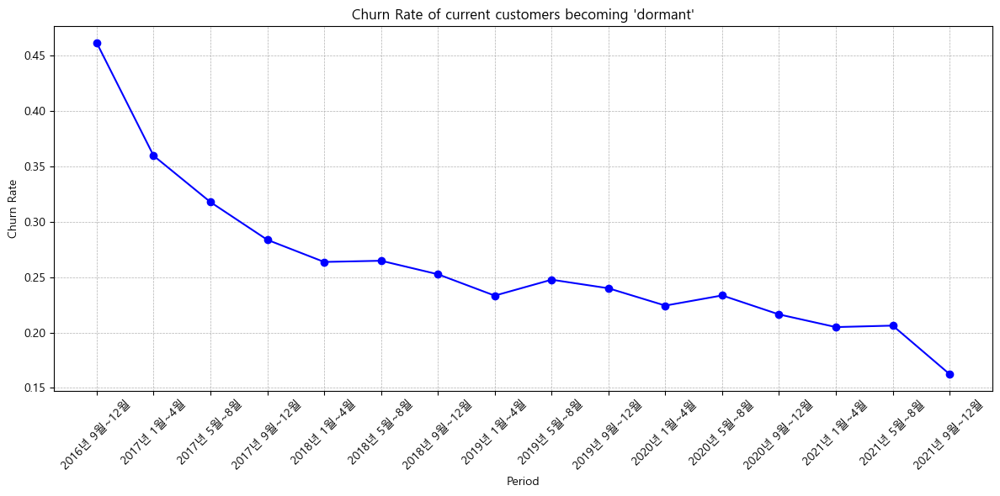

In [131]:
# Create a list to store churn rates for the current customers
current_churn_rates = []

# Loop through each period to calculate the churn rate for current customers
for i in range(len(periods) - 1):
    current_customer_count = ((urs[periods[i]] == 'active_existing') |
                              (urs[periods[i]] == 'active_new') |
                              (urs[periods[i]] == 'resurrected')).sum()
    
    dormant_next_period_count = (((urs[periods[i]] == 'active_existing') |
                                  (urs[periods[i]] == 'active_new') |
                                  (urs[periods[i]] == 'resurrected')) & 
                                 (urs[periods[i+1]] == 'dormant')).sum()
    
    # Calculate the churn rate for the period and append to the list
    if current_customer_count != 0:
        churn_rate = dormant_next_period_count / current_customer_count
    else:
        churn_rate = 0
        
    current_churn_rates.append(churn_rate)

# Plotting the churn rates for current customers
plt.figure(figsize=(12, 6))
plt.plot(periods[:-1], current_churn_rates, marker='o', color='blue')
plt.xticks(rotation=45)
plt.title("Churn Rate of current customers becoming 'dormant'")
plt.ylabel("Churn Rate")
plt.xlabel("Period")
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()

plt.show()


In [99]:
new_join_df

,활성 신규 유저 수
2016년 9월~12월,2038.0
2017년 1월~4월,1958.0
2017년 5월~8월,2243.0
2017년 9월~12월,2143.0
2018년 1월~4월,2240.0
2018년 5월~8월,2707.0
2018년 9월~12월,2278.0
2019년 1월~4월,2483.0
2019년 5월~8월,2968.0
2019년 9월~12월,2454.0


In [92]:
# 신규 유저 수
# Filter only columns with user join and create a count dataframe
new_join_data = urs.drop(columns=['customer_id', 'first_join_date'])
new_join_counts = new_join_data.apply(lambda x: x.value_counts()).fillna(0).transpose()

# Calculate the churn rate for new users
new_join_counts['신규 유저 유입 수'] = new_join_counts['active_new'] + new_join_counts['inactive_new']
new_join_counts['활성 신규 유저 수'] = new_join_counts['active_new'] 
new_join_counts['비활성 신규 유저 수'] = new_join_counts['inactive_new'] 



# Extract only the churn rate
new_join_df = new_join_counts[['활성 신규 유저 수']]
new_join_df

new_join_df.plot(kind='line', figsize=(10, 6), color='salmon')
plt.title("활성 신규 유저 수")
plt.ylabel("유저 수")
plt.xlabel("Month")
plt.xticks(rotation=90)
plt.grid(axis='y')

plt.tight_layout()
plt.show()

8459.0

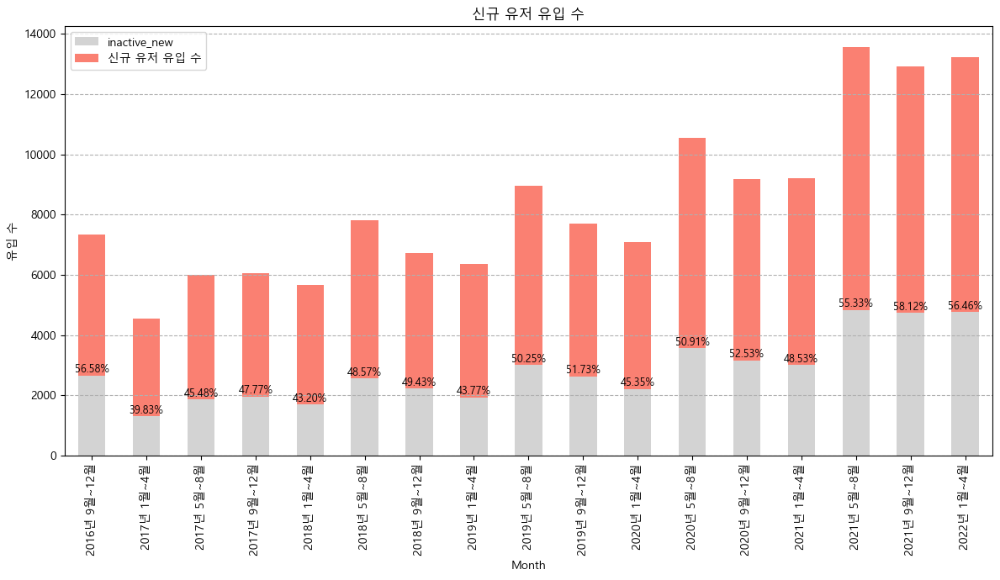

In [90]:
# Following the provided code to process the data
new_join_data = urs.drop(columns=['customer_id', 'first_join_date'])
new_join_counts = new_join_data.apply(lambda x: x.value_counts()).fillna(0).transpose()
new_join_counts['신규 유저 유입 수'] = new_join_counts['active_new'] + new_join_counts['inactive_new']

# Changing the order of columns for stacked bar graph
new_join_df = new_join_df[['inactive_new', '신규 유저 유입 수']]

# Plotting
ax = new_join_df.plot(kind='bar', figsize=(12, 7), color=['lightgray', 'salmon'], stacked=True)
plt.title("신규 유저 유입 수")
plt.ylabel("유입 수")
plt.xlabel("Month")
plt.xticks(rotation=90)
plt.grid(axis='y', linestyle='--')

# Annotating the percentage of inactive_new users on top of each bar
for idx, rect in enumerate(ax.patches):
    # For every bar: Place a label
    # rect.get_x() + rect.get_width() / 2 gives the middle of each bar
    # Depending on the height of the bar, the label is placed above (height+3) or inside the bar (height-5)
    height = rect.get_height()
    total_height = new_join_df.iloc[idx % len(new_join_df), 1]  # total users for that month
    inactive_users = new_join_df.iloc[idx % len(new_join_df), 0]  # inactive users for that month
    percentage = (inactive_users / total_height) * 100
    if idx < len(new_join_df):  # this ensures we're only labeling the 'inactive_new' bars
        ax.text(rect.get_x() + rect.get_width() / 2, height + 5, f"{percentage:.2f}%",
                ha='center', va='bottom', fontsize=9, color='black')

plt.tight_layout()
plt.show()


In [108]:
# Filter only columns with user status and create a count dataframe
new_status_data = urs.drop(columns=['customer_id', 'first_join_date'])
new_status_counts = new_status_data.apply(lambda x: x.value_counts()).fillna(0).transpose()

# Calculate the churn rate for new users
new_status_counts['신규 유저 비활성율'] = new_status_counts['inactive_new'] / (new_status_counts['active_new'] + new_status_counts['inactive_new'])

# Extract only the churn rate
churn_rate_df = new_status_counts[['신규 유저 비활성율']]
churn_rate_df

# Plotting the churn rate as a line graph
plt.figure(figsize=(14,7))
churn_rate_df.plot(ax=plt.gca(), marker='o', linestyle='-', color='blue')
plt.title('신규 유저 비활성율 over Time')
plt.ylabel('신규 유저 비활성율')
plt.xlabel('Time Period')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.show()


,신규 유저 비활성율
2016년 9월~12월,0.565829
2017년 1월~4월,0.398279
2017년 5월~8월,0.454789
2017년 9월~12월,0.477699
2018년 1월~4월,0.432049
2018년 5월~8월,0.485655
2018년 9월~12월,0.494340
2019년 1월~4월,0.437726
2019년 5월~8월,0.502514
2019년 9월~12월,0.517309


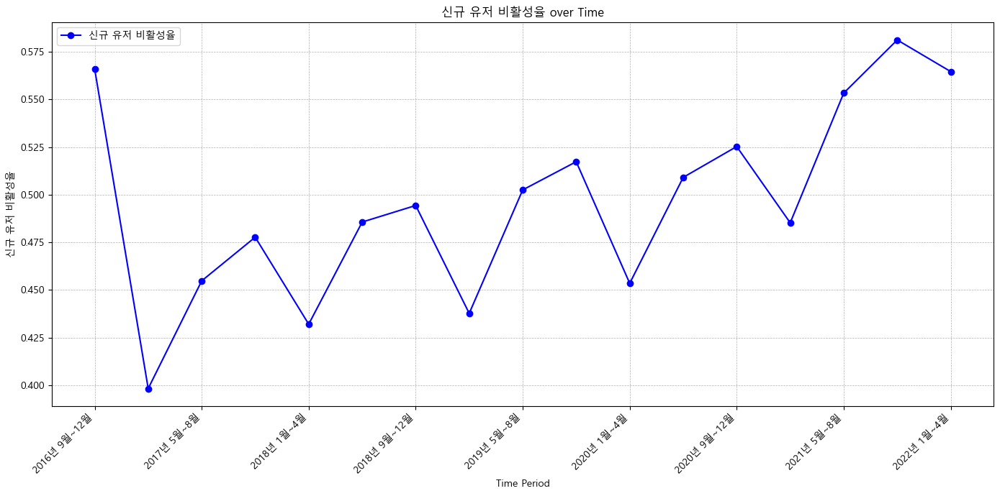

In [109]:
# Plotting the churn rate as a line graph
plt.figure(figsize=(14,7))
churn_rate_df.plot(ax=plt.gca(), marker='o', linestyle='-', color='blue')
plt.title('신규 유저 비활성율 over Time')
plt.ylabel('신규 유저 비활성율')
plt.xlabel('Time Period')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.show()


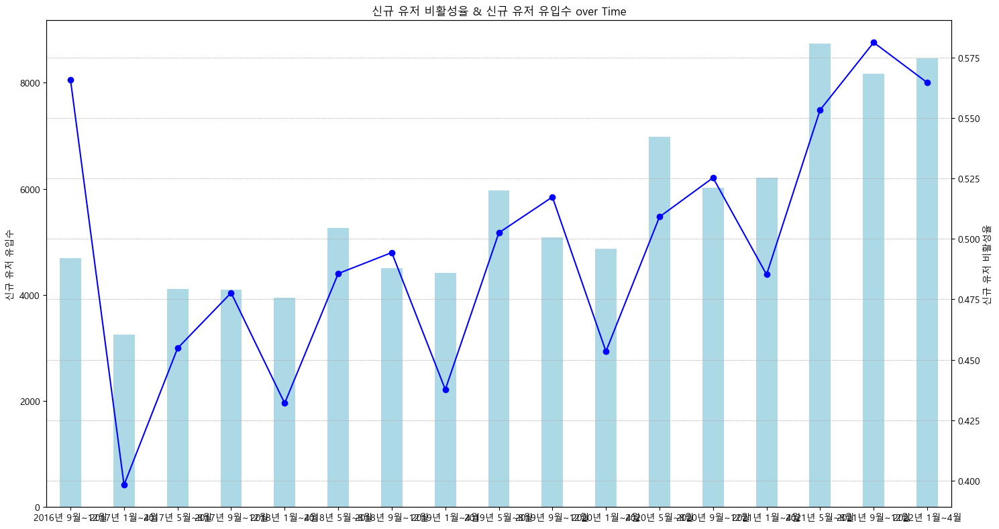

In [160]:
# Filter only columns with user status and create a count dataframe
new_status_data = urs.drop(columns=['customer_id', 'first_join_date'])
new_status_counts = new_status_data.apply(lambda x: x.value_counts()).fillna(0).transpose()

# Calculate the churn rate for new users
new_status_counts['신규 유저 비활성율'] = new_status_counts['inactive_new'] / (new_status_counts['active_new'] + new_status_counts['inactive_new'])

# Calculate the influx of new users
new_status_counts['신규 유저 유입수'] = new_status_counts['active_new'] + new_status_counts['inactive_new']

# Extract only the churn rate and influx of new users
churn_and_influx_df = new_status_counts[['신규 유저 비활성율', '신규 유저 유입수']]

# Set figure and axis
plt.figure(figsize=(15, 8))

# Plotting the influx of new users as a bar graph
ax1 = churn_and_influx_df['신규 유저 유입수'].plot(kind='bar', position=0.5, width=0.4, color='lightblue', label='신규 유저 유입수')

# Plotting the churn rate as a line graph on the same axis
churn_and_influx_df['신규 유저 비활성율'].plot(ax=ax1, secondary_y=True, marker='o', linestyle='-', color='blue', label='신규 유저 비활성율')

# Setting labels, title, and legend
plt.title('신규 유저 비활성율 & 신규 유저 유입수 over Time')
ax1.set_ylabel('신규 유저 유입수')
ax1.right_ax.set_ylabel('신규 유저 비활성율')
plt.xticks(rotation=45, ha='right')
plt.xlabel('Time Period')
plt.tight_layout()
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Display the combined plot
plt.show()


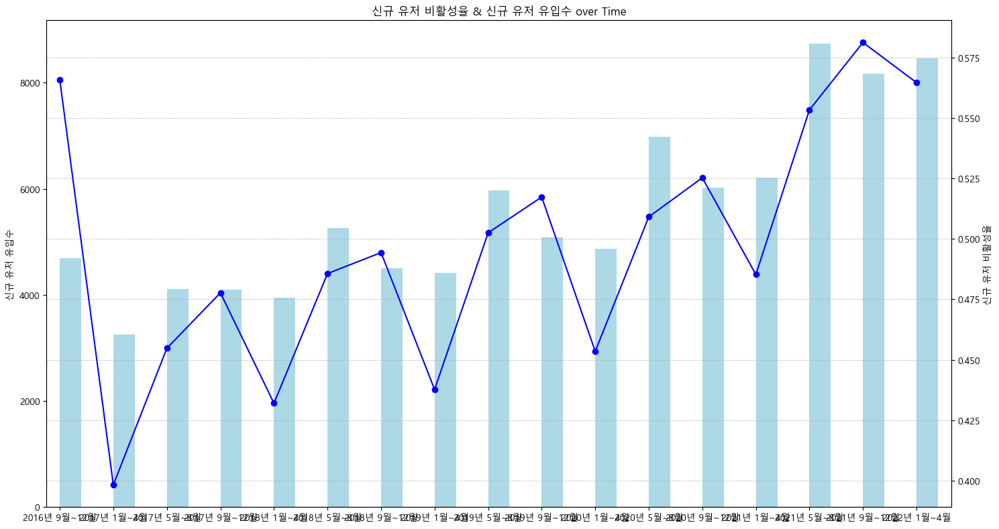

In [150]:
# Set figure and axis
plt.figure(figsize=(15, 8))

# Plotting the influx of new users as a bar graph
ax1 = churn_and_influx_df['신규 유저 유입수'].plot(kind='bar', position=0, width=0.4, color='lightblue', label='신규 유저 유입수')

# Plotting the churn rate as a line graph on the same axis
churn_and_influx_df['신규 유저 비활성율'].plot(ax=ax1, secondary_y=True, marker='o', linestyle='-', color='blue', label='신규 유저 비활성율')

# Setting labels, title, and legend
plt.title('신규 유저 비활성율 & 신규 유저 유입수 over Time')
ax1.set_ylabel('신규 유저 유입수')
ax1.right_ax.set_ylabel('신규 유저 비활성율')
plt.xlabel('Time Period')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Display the combined plot
plt.show()


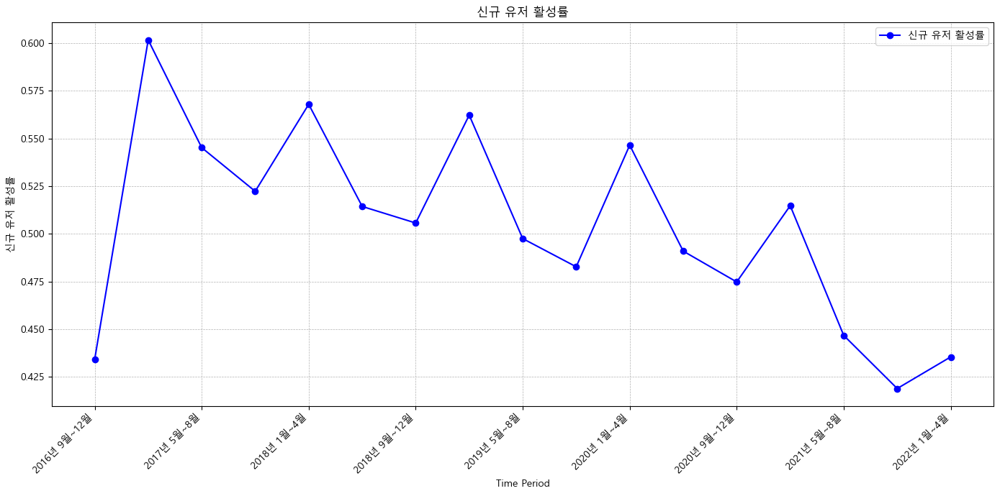

In [104]:
# Filter only columns with user status and create a count dataframe
new_status_data = urs.drop(columns=['customer_id', 'first_join_date'])
new_status_counts = new_status_data.apply(lambda x: x.value_counts()).fillna(0).transpose()

# Calculate the churn rate for new users
new_status_counts['신규 유저 활성률'] = new_status_counts['active_new'] / (new_status_counts['active_new'] + new_status_counts['inactive_new'])

# Extract only the churn rate
churn_rate_df = new_status_counts[['신규 유저 활성률']]
churn_rate_df

# Plotting the churn rate as a line graph
plt.figure(figsize=(14,7))
churn_rate_df.plot(ax=plt.gca(), marker='o', linestyle='-', color='blue')
plt.title('신규 유저 활성률')
plt.ylabel('신규 유저 활성률')
plt.xlabel('Time Period')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.show()


# 배송기간 증감 추이

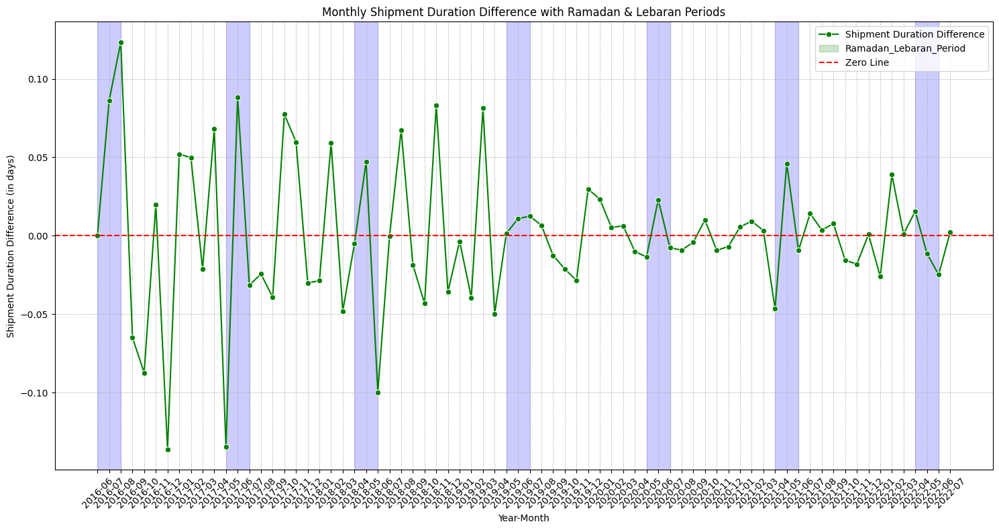

In [168]:
# order_date 컬럼을 datetime 타입으로 변환
tr['order_date'] = pd.to_datetime(tr['order_date'])

# 연도와 월만 추출하여 새로운 컬럼 생성
tr['year_month'] = tr['order_date'].dt.to_period('M')

# shipment_time에서 "일" 단위 제거 후 숫자로 변환
tr['shipment_duration'] = tr['shipment_time'].str.split(' ').str[0].astype(int)

# 월별 shipment_duration의 평균 계산
monthly_shipment_avg = tr.groupby('year_month')['shipment_duration'].mean().reset_index()
monthly_shipment_avg['shipment_difference'] = monthly_shipment_avg['shipment_duration'].diff().fillna(0)

monthly_shipment_avg.head()


# 라마단과 르바란의 시작과 종료 날짜 데이터
ramadan_lebaran_dates = {
    "2016": ("2016-06", "2016-08"),
    "2017": ("2017-05", "2017-07"),
    "2018": ("2018-04", "2018-06"),
    "2019": ("2019-05", "2019-07"),
    "2020": ("2020-05", "2020-07"),
    "2021": ("2021-04", "2021-06"),
    "2022": ("2022-04", "2022-06")
}


# 라마단과 르바란의 시작과 종료 날짜를 "연-월" 형식으로 변환
ramadan_lebaran_monthly = {(pd.to_datetime(start).strftime('%Y-%m'), pd.to_datetime(end).strftime('%Y-%m')) for start, end in ramadan_lebaran_dates.values()}


# 월별 shipment_duration의 증감을 다시 시각화하면서 라마단과 르바란 기간을 표시
plt.figure(figsize=(15, 8))
sns.lineplot(data=monthly_shipment_avg, x='year_month', y='shipment_difference', marker="o", color='green')
plt.axhline(y=0, color='red', linestyle='--')  # 0의 기준선 추가

# 라마단의 시작과 종료 월을 그래프에 수직선으로 표시
for start, end in ramadan_lebaran_monthly:
    plt.axvspan(start, end, color='blue', alpha=0.2)
    

plt.title('Monthly Shipment Duration Difference with Ramadan & Lebaran Periods')
plt.xlabel('Year-Month')
plt.ylabel('Shipment Duration Difference (in days)')
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.xticks(rotation=45)
plt.legend(['Shipment Duration Difference', 'Ramadan_Lebaran_Period','Zero Line' ])
plt.tight_layout()
plt.show()



In [112]:
tr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1254585 entries, 0 to 1254584
Data columns (total 21 columns):
 #   Column               Non-Null Count    Dtype              
---  ------               --------------    -----              
 0   created_at           1254585 non-null  datetime64[ns, UTC]
 1   customer_id          1254585 non-null  int64              
 2   session_id           1254585 non-null  object             
 3   payment_method       1254585 non-null  object             
 4   payment_status       1254585 non-null  object             
 5   promo_amount         1254585 non-null  int64              
 6   promo_code           1254585 non-null  object             
 7   shipment_fee         1254585 non-null  int64              
 8   shipment_date_limit  1254585 non-null  object             
 9   total_amount         1254585 non-null  int64              
 10  product_id           1254585 non-null  int64              
 11  quantity             1254585 non-null  int64      

In [117]:
tr_since17=tr.query('order_month > "2017-01-01"')

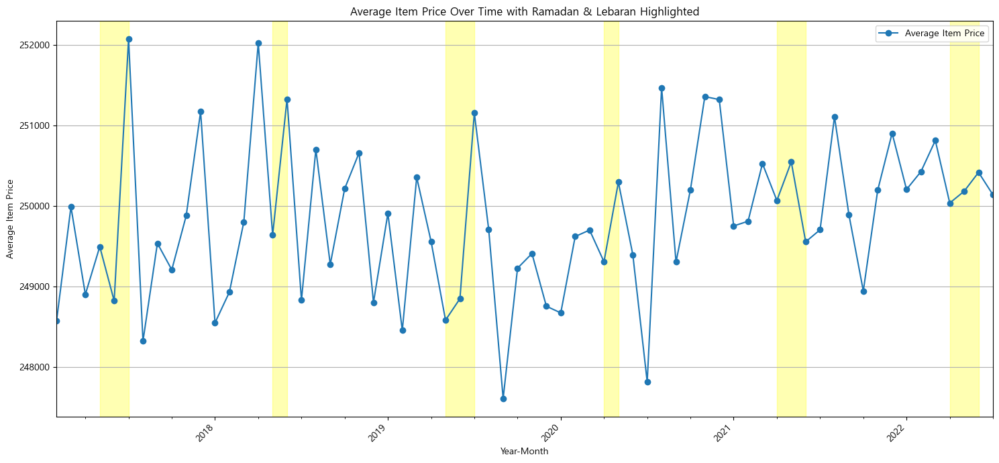

In [120]:
# Convert 'order_date' to datetime format and then to "Year-Month" format
tr_since17['order_month'] = pd.to_datetime(tr_since17['order_date']).dt.strftime('%Y-%m')

# Calculate the average item price for each month
avg_price_per_month = tr_since17.groupby('order_month')['item_price'].mean()


# Redefining the ramadan_lebaran_dates and ramadan_lebaran_monthly variables
ramadan_lebaran_dates = {
    "2016": ("2016-06", "2016-08"),
    "2017": ("2017-05", "2017-07"),
    "2018": ("2018-05", "2018-06"),
    "2019": ("2019-05", "2019-07"),
    "2020": ("2020-04", "2020-05"),
    "2021": ("2021-04", "2021-06"),
    "2022": ("2022-04", "2022-06")
}
ramadan_lebaran_monthly = {(pd.to_datetime(start).strftime('%Y-%m'), pd.to_datetime(end).strftime('%Y-%m')) for start, end in ramadan_lebaran_dates.values()}

# Convert the index of avg_price_per_month to datetime type
avg_price_per_month.index = pd.to_datetime(avg_price_per_month.index)

# Plotting the average item prices with consistent x-axis
plt.figure(figsize=(15, 7))
avg_price_per_month.plot(label='Average Item Price', marker='o', linestyle='-')

# Highlighting the Ramadan and Lebaran periods
for start, end in ramadan_lebaran_monthly:
    plt.axvspan(pd.to_datetime(start), pd.to_datetime(end), color='yellow', alpha=0.3)

plt.title('Average Item Price Over Time with Ramadan & Lebaran Highlighted')
plt.ylabel('Average Item Price')
plt.xlabel('Year-Month')
plt.legend()
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.grid(axis='y')
plt.show()




In [139]:
df_price= pd.merge( tr,pr, on='product_id', how='inner')

In [141]:
df_price.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1254585 entries, 0 to 1254584
Data columns (total 12 columns):
 #   Column              Non-Null Count    Dtype  
---  ------              --------------    -----  
 0   order_date          1254585 non-null  object 
 1   item_price          1254585 non-null  int64  
 2   product_id          1254585 non-null  int64  
 3   p_gender            1254585 non-null  object 
 4   masterCategory      1254585 non-null  object 
 5   subCategory         1254585 non-null  object 
 6   articleType         1254585 non-null  object 
 7   baseColour          1254585 non-null  object 
 8   season              1254585 non-null  object 
 9   p_year              1254585 non-null  float64
 10  usage               1254585 non-null  object 
 11  productDisplayName  1254585 non-null  object 
dtypes: float64(1), int64(2), object(9)
memory usage: 114.9+ MB


In [142]:
# order_date 컬럼을 datetime 타입으로 변환
df_price['order_date'] = pd.to_datetime(df_price['order_date'])

# 연도와 월만 추출하여 새로운 컬럼 생성
df_price['year_month'] = df_price['order_date'].dt.to_period('M')

# 월별, product_id 별 item_price의 평균 계산
new_monthly_price_difference = df_price.groupby(['year_month', 'product_id', 'productDisplayName'])['item_price'].mean().reset_index()
new_monthly_price_difference['price_difference'] = new_monthly_price_difference.groupby('product_id')['item_price'].diff().fillna(0)

new_monthly_price_difference.head()


,year_month,product_id,productDisplayName,item_price,price_difference
0,2016-06,33314,Arrow New York Men Navy Blue Polo T-shirt,210265.0,0.0
1,2016-07,2328,Reebok Men Graphic White T-shirt,114205.0,0.0
2,2016-07,2553,Numero Uno Men's Casual Red Graphic Flip Flop,105254.0,0.0
3,2016-07,2685,Inkfruit Women's Mesmerize Black T-shirt,615019.0,0.0
4,2016-07,2845,Mr.Men Men's Mr.Noisy Blue T-shirt,253772.0,0.0


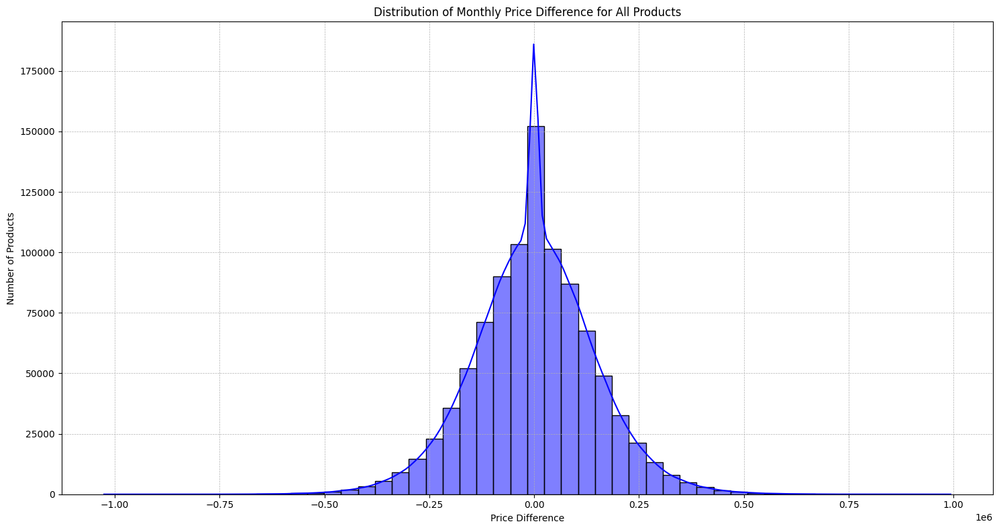

In [143]:
# 히스토그램과 KDE 그래프 시각화
plt.figure(figsize=(15, 8))
sns.histplot(new_monthly_price_difference['price_difference'], kde=True, bins=50, color='blue')
plt.title('Distribution of Monthly Price Difference for All Products')
plt.xlabel('Price Difference')
plt.ylabel('Number of Products')
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()


In [145]:
new_monthly_price_difference

,year_month,product_id,productDisplayName,item_price,price_difference
0,2016-06,33314,Arrow New York Men Navy Blue Polo T-shirt,210265.0,0.0
1,2016-07,2328,Reebok Men Graphic White T-shirt,114205.0,0.0
2,2016-07,2553,Numero Uno Men's Casual Red Graphic Flip Flop,105254.0,0.0
3,2016-07,2685,Inkfruit Women's Mesmerize Black T-shirt,615019.0,0.0
4,2016-07,2845,Mr.Men Men's Mr.Noisy Blue T-shirt,253772.0,0.0
...,...,...,...,...,...
956114,2022-07,59992,Avirate Black & White Dress,282595.0,-2879.0
956115,2022-07,59993,Avirate Black Dress,302175.0,-93086.0
956116,2022-07,59994,Avirate Black Formal Dress,237817.0,-62158.0
956117,2022-07,59996,Avirate Black & Purple Dress,295686.0,31657.0


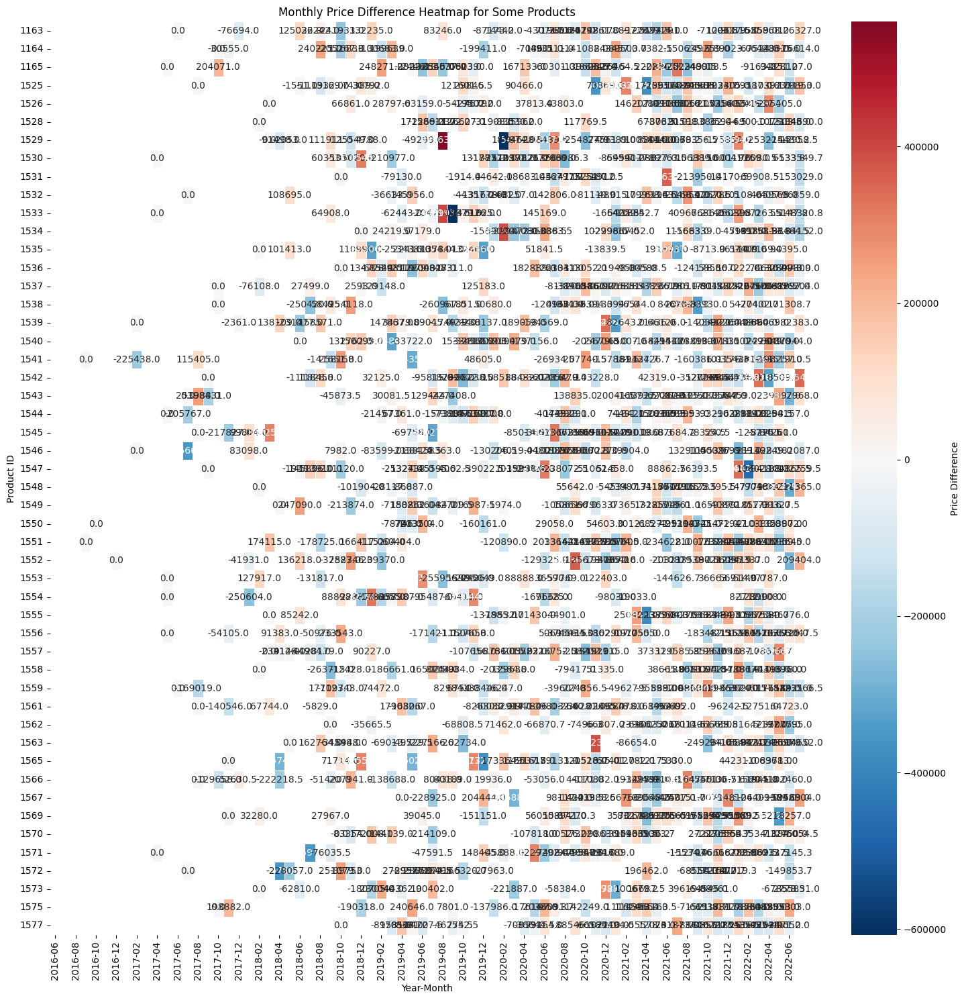

In [146]:
# 제품 ID와 월별로 피벗 테이블 생성 (정확한 방식으로)
heatmap_data_corrected = new_monthly_price_difference.pivot(index='product_id', columns='year_month', values='price_difference')

# 일부 제품만 선택하여 히트맵 시각화
plt.figure(figsize=(15, 15))
sns.heatmap(heatmap_data_corrected.iloc[:50, :], cmap='RdBu_r', center=0, linewidths=0.5, annot=True, fmt=".1f", cbar_kws={'label': 'Price Difference'})
plt.title('Monthly Price Difference Heatmap for Some Products')
plt.xlabel('Year-Month')
plt.ylabel('Product ID')
plt.tight_layout()
plt.show()


# 체크

In [178]:
cu_join = cu[['customer_id','birthdate','first_join_date']]
df= pd.merge(df, cu_join, on='customer_id', how='inner')

In [179]:
df['order_date'] = pd.to_datetime(df['order_date'])
df['order_month'] = df['order_date'].dt.strftime('%Y-%m')
month_list = np.sort(df['order_month'].unique().tolist())
df['order_year'] = df['order_date'].dt.year

In [180]:
df['birthdate'] = pd.to_datetime(df['birthdate'])
df['first_join_date'] = pd.to_datetime(df['first_join_date'])
df['join_year'] = df['first_join_date'].dt.year

In [181]:
df = df.sort_values(['customer_id', 'order_date'])
df['order_num'] = df.groupby('customer_id')['order_date'].rank(method='dense').astype(int)

df.head()


,created_at,order_date,order_time,customer_id,session_id,payment_method,payment_status,promo_amount,promo_code,shipment_fee,...,quantity,item_price,quantity_price,product_id,birthdate,first_join_date,order_month,order_year,join_year,order_num
352123,2018-08-25 18:54:03.844494+00:00,2018-08-25,18:54:03,3,f03b6825-1e6e-4916-bf71-f94ecbcbaee5,Credit Card,Success,8073,WEEKENDMANTAP,0,...,5,166934,834670,56019,1986-07-12,2018-08-25,2018-08,2018,2018,1
352124,2018-09-22 18:42:52.844494+00:00,2018-09-22,18:42:52,3,36673b2f-940a-42b5-994d-1cce4796b55f,Credit Card,Success,0,Not Promoted,10000,...,1,153784,153784,30235,1986-07-12,2018-08-25,2018-09,2018,2018,2
352125,2018-10-20 19:07:54.844494+00:00,2018-10-20,19:07:54,3,93e1d3c4-bed1-4ef4-b79f-e24a79e905b7,Credit Card,Success,8828,WEEKENDSERU,10000,...,1,123760,123760,7808,1986-07-12,2018-08-25,2018-10,2018,2018,3
352126,2018-11-17 19:09:49.844494+00:00,2018-11-17,19:09:49,3,8356370c-267e-4530-a2d3-1830e4be3f2b,Credit Card,Success,3415,WEEKENDSERU,0,...,1,251317,251317,48968,1986-07-12,2018-08-25,2018-11,2018,2018,4
352127,2018-12-15 19:33:50.844494+00:00,2018-12-15,19:33:50,3,ef7f4829-e7d1-4513-861b-1fbbc6e41bbf,Credit Card,Success,2645,LIBURDONG,10000,...,1,173882,173882,59272,1986-07-12,2018-08-25,2018-12,2018,2018,5


In [182]:
df = df.sort_values(by=['customer_id', 'order_date'])
df['date_diff'] = df.groupby('customer_id')['order_date'].diff().dt.days
df['date_diff'] = df.groupby(['customer_id', 'order_date'])['date_diff'].transform('first')

In [183]:
max_order_nums = df.groupby('customer_id')['order_num'].max()

one_time_customers = max_order_nums[max_order_nums == 1].index
multiple_times_customers = max_order_nums[max_order_nums > 1].index

one_data = df[df['customer_id'].isin(one_time_customers)]
multiple_data = df[df['customer_id'].isin(multiple_times_customers)]

In [184]:
print(df['customer_id'].nunique())
print(len(one_time_customers))
print(len(multiple_times_customers))

50705
10344
40361


In [185]:
df.head(3)

,created_at,order_date,order_time,customer_id,session_id,payment_method,payment_status,promo_amount,promo_code,shipment_fee,...,item_price,quantity_price,product_id,birthdate,first_join_date,order_month,order_year,join_year,order_num,date_diff
352123,2018-08-25 18:54:03.844494+00:00,2018-08-25,18:54:03,3,f03b6825-1e6e-4916-bf71-f94ecbcbaee5,Credit Card,Success,8073,WEEKENDMANTAP,0,...,166934,834670,56019,1986-07-12,2018-08-25,2018-08,2018,2018,1,NaN
352124,2018-09-22 18:42:52.844494+00:00,2018-09-22,18:42:52,3,36673b2f-940a-42b5-994d-1cce4796b55f,Credit Card,Success,0,Not Promoted,10000,...,153784,153784,30235,1986-07-12,2018-08-25,2018-09,2018,2018,2,28.0
352125,2018-10-20 19:07:54.844494+00:00,2018-10-20,19:07:54,3,93e1d3c4-bed1-4ef4-b79f-e24a79e905b7,Credit Card,Success,8828,WEEKENDSERU,10000,...,123760,123760,7808,1986-07-12,2018-08-25,2018-10,2018,2018,3,28.0


In [14]:
# df.to_csv("rfm.csv", index=False, encoding="utf-8-sig", mode="w")

In [186]:
df=df[df['payment_status']=='Success']

In [187]:
print(df['customer_id'].nunique())
print(len(one_time_customers))
print(len(multiple_times_customers))

50242
10344
40361


In [17]:
purchase_per_person_day=df.groupby(['customer_id','order_date'])['quantity_price'].sum().mean()
purchase_per_person_day

544376.7439363695

In [18]:
df.query('session_id=="4fc4d81b-4b29-4aef-bd1f-263c373950d1"')

,created_at,order_date,order_time,customer_id,session_id,payment_method,payment_status,promo_amount,promo_code,shipment_fee,...,item_price,quantity_price,product_id,birthdate,first_join_date,order_month,order_year,join_year,order_num,date_diff
336574,2022-01-25 00:54:09.703960+00:00,2022-01-25,00:54:09,99998,4fc4d81b-4b29-4aef-bd1f-263c373950d1,Credit Card,Success,1954,BUYMORE,10000,...,282198,282198,45294,2014-05-21,2018-07-01,2022-01,2022,2018,8,187.0
336575,2022-01-25 00:54:09.703960+00:00,2022-01-25,00:54:09,99998,4fc4d81b-4b29-4aef-bd1f-263c373950d1,Credit Card,Success,1954,BUYMORE,10000,...,142052,142052,18975,2014-05-21,2018-07-01,2022-01,2022,2018,8,187.0
336576,2022-01-25 00:54:09.703960+00:00,2022-01-25,00:54:09,99998,4fc4d81b-4b29-4aef-bd1f-263c373950d1,Credit Card,Success,1954,BUYMORE,10000,...,200489,200489,30906,2014-05-21,2018-07-01,2022-01,2022,2018,8,187.0
336577,2022-01-25 00:54:09.703960+00:00,2022-01-25,00:54:09,99998,4fc4d81b-4b29-4aef-bd1f-263c373950d1,Credit Card,Success,1954,BUYMORE,10000,...,284884,284884,32389,2014-05-21,2018-07-01,2022-01,2022,2018,8,187.0
336578,2022-01-25 00:54:09.703960+00:00,2022-01-25,00:54:09,99998,4fc4d81b-4b29-4aef-bd1f-263c373950d1,Credit Card,Success,1954,BUYMORE,10000,...,108532,108532,49247,2014-05-21,2018-07-01,2022-01,2022,2018,8,187.0
336579,2022-01-25 00:54:09.703960+00:00,2022-01-25,00:54:09,99998,4fc4d81b-4b29-4aef-bd1f-263c373950d1,Credit Card,Success,1954,BUYMORE,10000,...,93879,563274,9488,2014-05-21,2018-07-01,2022-01,2022,2018,8,187.0
336580,2022-01-25 00:54:09.703960+00:00,2022-01-25,00:54:09,99998,4fc4d81b-4b29-4aef-bd1f-263c373950d1,Credit Card,Success,1954,BUYMORE,10000,...,142990,142990,28958,2014-05-21,2018-07-01,2022-01,2022,2018,8,187.0
336581,2022-01-25 00:54:09.703960+00:00,2022-01-25,00:54:09,99998,4fc4d81b-4b29-4aef-bd1f-263c373950d1,Credit Card,Success,1954,BUYMORE,10000,...,228529,457058,35193,2014-05-21,2018-07-01,2022-01,2022,2018,8,187.0
336582,2022-01-25 00:54:09.703960+00:00,2022-01-25,00:54:09,99998,4fc4d81b-4b29-4aef-bd1f-263c373950d1,Credit Card,Success,1954,BUYMORE,10000,...,411675,411675,15565,2014-05-21,2018-07-01,2022-01,2022,2018,8,187.0
336583,2022-01-25 00:54:09.703960+00:00,2022-01-25,00:54:09,99998,4fc4d81b-4b29-4aef-bd1f-263c373950d1,Credit Card,Success,1954,BUYMORE,10000,...,298504,298504,18973,2014-05-21,2018-07-01,2022-01,2022,2018,8,187.0


In [19]:
df.head()

,created_at,order_date,order_time,customer_id,session_id,payment_method,payment_status,promo_amount,promo_code,shipment_fee,...,item_price,quantity_price,product_id,birthdate,first_join_date,order_month,order_year,join_year,order_num,date_diff
352123,2018-08-25 18:54:03.844494+00:00,2018-08-25,18:54:03,3,f03b6825-1e6e-4916-bf71-f94ecbcbaee5,Credit Card,Success,8073,WEEKENDMANTAP,0,...,166934,834670,56019,1986-07-12,2018-08-25,2018-08,2018,2018,1,NaN
352124,2018-09-22 18:42:52.844494+00:00,2018-09-22,18:42:52,3,36673b2f-940a-42b5-994d-1cce4796b55f,Credit Card,Success,0,Not Promoted,10000,...,153784,153784,30235,1986-07-12,2018-08-25,2018-09,2018,2018,2,28.0
352125,2018-10-20 19:07:54.844494+00:00,2018-10-20,19:07:54,3,93e1d3c4-bed1-4ef4-b79f-e24a79e905b7,Credit Card,Success,8828,WEEKENDSERU,10000,...,123760,123760,7808,1986-07-12,2018-08-25,2018-10,2018,2018,3,28.0
352126,2018-11-17 19:09:49.844494+00:00,2018-11-17,19:09:49,3,8356370c-267e-4530-a2d3-1830e4be3f2b,Credit Card,Success,3415,WEEKENDSERU,0,...,251317,251317,48968,1986-07-12,2018-08-25,2018-11,2018,2018,4,28.0
352127,2018-12-15 19:33:50.844494+00:00,2018-12-15,19:33:50,3,ef7f4829-e7d1-4513-861b-1fbbc6e41bbf,Credit Card,Success,2645,LIBURDONG,10000,...,173882,173882,59272,1986-07-12,2018-08-25,2018-12,2018,2018,5,28.0


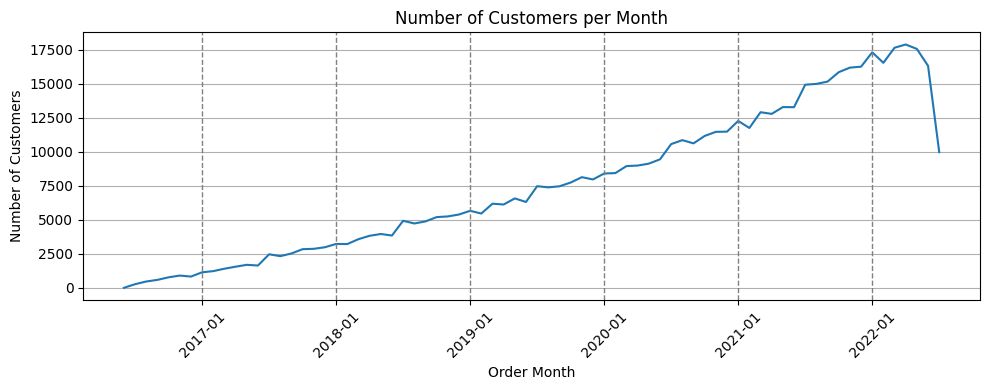

In [20]:
customers_per_month = df.groupby('order_month')['customer_id'].nunique()

plt.figure(figsize=(10, 4))
ax = customers_per_month.plot()

january_ticks = []
for idx, month in enumerate(customers_per_month.index):
    if month.endswith('-01'):
        ax.axvline(x=idx, color='gray', linestyle='--', linewidth=1)
        january_ticks.append(idx)

ax.set_xticks(january_ticks)
ax.set_xticklabels([customers_per_month.index[i] for i in january_ticks], rotation=45)
plt.title('Number of Customers per Month')
plt.xlabel('Order Month')
plt.ylabel('Number of Customers')
plt.grid(True, axis='y')
plt.tight_layout()
plt.show()

In [290]:
import pandas as pd

pd.set_option('display.max_columns', None)  # 모든 컬럼을 출력하도록 설정
df.info()
columns = df.columns[19:22]  # 20, 21, 22번째 컬럼의 이름을 가져옵니다.

for col in columns:
    dtype = df[col].dtype
    non_null_count = df[col].notnull().sum()
    print(f"{col}: {dtype}, Non-Null Count: {non_null_count}")


<class 'pandas.core.frame.DataFrame'>
Index: 1201035 entries, 352123 to 1202276
Data columns (total 23 columns):
 #   Column           Non-Null Count    Dtype              
---  ------           --------------    -----              
 0   created_at       1201035 non-null  datetime64[ns, UTC]
 1   order_date       1201035 non-null  datetime64[ns]     
 2   order_time       1201035 non-null  object             
 3   customer_id      1201035 non-null  int64              
 4   session_id       1201035 non-null  object             
 5   payment_method   1201035 non-null  object             
 6   payment_status   1201035 non-null  object             
 7   promo_amount     1201035 non-null  int64              
 8   promo_code       1201035 non-null  object             
 9   shipment_fee     1201035 non-null  int64              
 10  total_amount     1201035 non-null  int64              
 11  product_id       1201035 non-null  int64              
 12  quantity         1201035 non-null  int64  

In [39]:
df.head()

,created_at,order_date,order_time,customer_id,session_id,payment_method,payment_status,promo_amount,promo_code,shipment_fee,total_amount,product_id,quantity,item_price,quantity_price,product_id,birthdate,first_join_date,order_month,order_year,join_year,order_num,date_diff,days_to_first_order
352123,2018-08-25 18:54:03.844494+00:00,2018-08-25,18:54:03,3,f03b6825-1e6e-4916-bf71-f94ecbcbaee5,Credit Card,Success,8073,WEEKENDMANTAP,0,826597,56019,5,166934,834670,56019,1986-07-12,2018-08-25,2018-08,2018,2018,1,NaN,0
352124,2018-09-22 18:42:52.844494+00:00,2018-09-22,18:42:52,3,36673b2f-940a-42b5-994d-1cce4796b55f,Credit Card,Success,0,Not Promoted,10000,163784,30235,1,153784,153784,30235,1986-07-12,2018-08-25,2018-09,2018,2018,2,28.0,0
352125,2018-10-20 19:07:54.844494+00:00,2018-10-20,19:07:54,3,93e1d3c4-bed1-4ef4-b79f-e24a79e905b7,Credit Card,Success,8828,WEEKENDSERU,10000,124932,7808,1,123760,123760,7808,1986-07-12,2018-08-25,2018-10,2018,2018,3,28.0,0
352126,2018-11-17 19:09:49.844494+00:00,2018-11-17,19:09:49,3,8356370c-267e-4530-a2d3-1830e4be3f2b,Credit Card,Success,3415,WEEKENDSERU,0,247902,48968,1,251317,251317,48968,1986-07-12,2018-08-25,2018-11,2018,2018,4,28.0,0
352127,2018-12-15 19:33:50.844494+00:00,2018-12-15,19:33:50,3,ef7f4829-e7d1-4513-861b-1fbbc6e41bbf,Credit Card,Success,2645,LIBURDONG,10000,181237,59272,1,173882,173882,59272,1986-07-12,2018-08-25,2018-12,2018,2018,5,28.0,0


In [403]:
df.shape

(1201035, 24)

In [404]:
df.duplicated(subset=['order_date','customer_id']).sum()

386960

In [409]:
df.query('session_id=="4fc4d81b-4b29-4aef-bd1f-263c373950d1"')

,created_at,order_date,order_time,customer_id,session_id,payment_method,payment_status,promo_amount,promo_code,shipment_fee,total_amount,product_id,quantity,item_price,quantity_price,product_id,birthdate,first_join_date,order_month,order_year,join_year,order_num,date_diff,days_to_first_order
336574,2022-01-25 00:54:09.703960+00:00,2022-01-25,00:54:09,99998,4fc4d81b-4b29-4aef-bd1f-263c373950d1,Credit Card,Success,1954,BUYMORE,10000,4222436,45294,1,282198,282198,45294,2014-05-21,2018-07-01,2022-01,2022,2018,8,187.0,1
336575,2022-01-25 00:54:09.703960+00:00,2022-01-25,00:54:09,99998,4fc4d81b-4b29-4aef-bd1f-263c373950d1,Credit Card,Success,1954,BUYMORE,10000,4222436,18975,1,142052,142052,18975,2014-05-21,2018-07-01,2022-01,2022,2018,8,187.0,1
336576,2022-01-25 00:54:09.703960+00:00,2022-01-25,00:54:09,99998,4fc4d81b-4b29-4aef-bd1f-263c373950d1,Credit Card,Success,1954,BUYMORE,10000,4222436,30906,1,200489,200489,30906,2014-05-21,2018-07-01,2022-01,2022,2018,8,187.0,1
336577,2022-01-25 00:54:09.703960+00:00,2022-01-25,00:54:09,99998,4fc4d81b-4b29-4aef-bd1f-263c373950d1,Credit Card,Success,1954,BUYMORE,10000,4222436,32389,1,284884,284884,32389,2014-05-21,2018-07-01,2022-01,2022,2018,8,187.0,1
336578,2022-01-25 00:54:09.703960+00:00,2022-01-25,00:54:09,99998,4fc4d81b-4b29-4aef-bd1f-263c373950d1,Credit Card,Success,1954,BUYMORE,10000,4222436,49247,1,108532,108532,49247,2014-05-21,2018-07-01,2022-01,2022,2018,8,187.0,1
336579,2022-01-25 00:54:09.703960+00:00,2022-01-25,00:54:09,99998,4fc4d81b-4b29-4aef-bd1f-263c373950d1,Credit Card,Success,1954,BUYMORE,10000,4222436,9488,6,93879,563274,9488,2014-05-21,2018-07-01,2022-01,2022,2018,8,187.0,1
336580,2022-01-25 00:54:09.703960+00:00,2022-01-25,00:54:09,99998,4fc4d81b-4b29-4aef-bd1f-263c373950d1,Credit Card,Success,1954,BUYMORE,10000,4222436,28958,1,142990,142990,28958,2014-05-21,2018-07-01,2022-01,2022,2018,8,187.0,1
336581,2022-01-25 00:54:09.703960+00:00,2022-01-25,00:54:09,99998,4fc4d81b-4b29-4aef-bd1f-263c373950d1,Credit Card,Success,1954,BUYMORE,10000,4222436,35193,2,228529,457058,35193,2014-05-21,2018-07-01,2022-01,2022,2018,8,187.0,1
336582,2022-01-25 00:54:09.703960+00:00,2022-01-25,00:54:09,99998,4fc4d81b-4b29-4aef-bd1f-263c373950d1,Credit Card,Success,1954,BUYMORE,10000,4222436,15565,1,411675,411675,15565,2014-05-21,2018-07-01,2022-01,2022,2018,8,187.0,1
336583,2022-01-25 00:54:09.703960+00:00,2022-01-25,00:54:09,99998,4fc4d81b-4b29-4aef-bd1f-263c373950d1,Credit Card,Success,1954,BUYMORE,10000,4222436,18973,1,298504,298504,18973,2014-05-21,2018-07-01,2022-01,2022,2018,8,187.0,1


In [405]:
df[df.duplicated(subset=['order_date','customer_id'])==True]

,created_at,order_date,order_time,customer_id,session_id,payment_method,payment_status,promo_amount,promo_code,shipment_fee,total_amount,product_id,quantity,item_price,quantity_price,product_id,birthdate,first_join_date,order_month,order_year,join_year,order_num,date_diff,days_to_first_order
352133,2019-05-04 21:21:00.844494+00:00,2019-05-04,21:21:00,3,2a2513ad-97d7-49d9-a194-325e872c1336,Gopay,Success,5319,WEEKENDMANTAP,5000,927135,4936,1,250464,250464,4936,1986-07-12,2018-08-25,2019-05,2019,2018,10,28.0,0
352136,2019-06-29 22:45:28.844494+00:00,2019-06-29,22:45:28,3,52de198b-88e3-446b-99fc-7bb845dd81e1,Credit Card,Success,0,Not Promoted,0,1197811,23045,2,493973,987946,23045,1986-07-12,2018-08-25,2019-06,2019,2018,12,28.0,0
352141,2019-10-20 00:32:21.844494+00:00,2019-10-20,00:32:21,3,02bf4210-848e-400b-83d6-cde417f9a6d0,Credit Card,Success,3044,LIBURDONG,5000,654576,50439,1,326640,326640,50439,1986-07-12,2018-08-25,2019-10,2019,2018,16,28.0,0
352146,2020-02-09 02:25:35.844494+00:00,2020-02-09,02:25:35,3,d5a4386c-140e-4830-b448-66ec63e7ba21,Credit Card,Success,3633,WEEKENDSERU,10000,764765,45920,1,363322,363322,45920,1986-07-12,2018-08-25,2020-02,2020,2018,20,28.0,0
352147,2020-02-09 02:25:35.844494+00:00,2020-02-09,02:25:35,3,d5a4386c-140e-4830-b448-66ec63e7ba21,Credit Card,Success,3633,WEEKENDSERU,10000,764765,34094,1,214729,214729,34094,1986-07-12,2018-08-25,2020-02,2020,2018,20,28.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
336585,2022-01-25 00:54:09.703960+00:00,2022-01-25,00:54:09,99998,4fc4d81b-4b29-4aef-bd1f-263c373950d1,Credit Card,Success,1954,BUYMORE,10000,4222436,4157,1,193009,193009,4157,2014-05-21,2018-07-01,2022-01,2022,2018,8,187.0,1
336586,2022-01-25 00:54:09.703960+00:00,2022-01-25,00:54:09,99998,4fc4d81b-4b29-4aef-bd1f-263c373950d1,Credit Card,Success,1954,BUYMORE,10000,4222436,18523,1,358650,358650,18523,2014-05-21,2018-07-01,2022-01,2022,2018,8,187.0,1
336587,2022-01-25 00:54:09.703960+00:00,2022-01-25,00:54:09,99998,4fc4d81b-4b29-4aef-bd1f-263c373950d1,Credit Card,Success,1954,BUYMORE,10000,4222436,44211,1,135965,135965,44211,2014-05-21,2018-07-01,2022-01,2022,2018,8,187.0,1
336588,2022-01-25 00:54:09.703960+00:00,2022-01-25,00:54:09,99998,4fc4d81b-4b29-4aef-bd1f-263c373950d1,Credit Card,Success,1954,BUYMORE,10000,4222436,16555,1,248506,248506,16555,2014-05-21,2018-07-01,2022-01,2022,2018,8,187.0,1


# 첫 가입 -> 첫 구매까지 걸리는 기간 분포
첫 구매까지 걸리는 시간이 거진 다 1일임.
근데 여기서 빠진 건 가입만 하고 첫 구매를 안 한사람은 transaction 데이터에서 없어

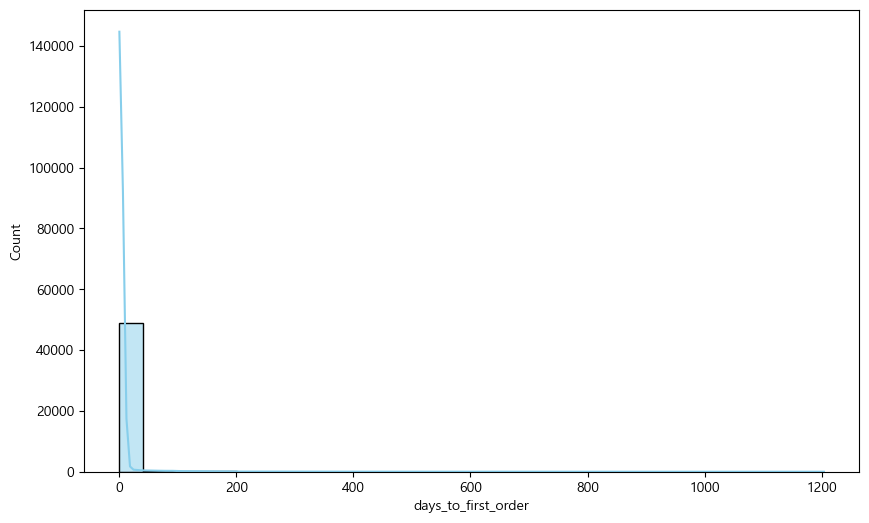

In [298]:
# Using 'first_join_date' as the join date and 'order_date' as the purchase date
# Calculate the days to the first order for each customer
df['first_join_date'] = pd.to_datetime(df['first_join_date'])
df['days_to_first_order'] = (df.groupby('customer_id')['order_date'].transform('min') - df['first_join_date']).dt.days

# Create a new DataFrame with unique customers and their days to first order
unique_customers_df = df.drop_duplicates(subset='customer_id')[['customer_id', 'days_to_first_order']]

# Display the first few rows of the new DataFrame
unique_customers_df.head()


# Plotting the distribution of days to the first order again with adjusted annotation
plt.figure(figsize=(10, 6))
ax = sns.histplot(unique_customers_df['days_to_first_order'], bins=30, kde=True, color='skyblue')



In [336]:
df_drop_dup = df[df.duplicated(subset=['order_date','customer_id']) == True]

In [340]:
# Using 'first_join_date' as the join date and 'order_date' as the purchase date
# Calculate the days to the first order for each customer
df_drop_dup['first_join_date'] = pd.to_datetime(df_drop_dup['first_join_date'])
df_drop_dup['days_to_first_order'] = (df_drop_dup.groupby('customer_id')['order_date'].transform('min') - df_drop_dup['first_join_date']).dt.days

# Create a new DataFrame with unique customers and their days to first order
unique_customers_df = df_drop_dup.drop_duplicates(subset='customer_id')[['customer_id', 'days_to_first_order']]

# Display the first few rows of the new DataFrame
unique_customers_df.head()


,customer_id,days_to_first_order
352133,3,252
631245,8,152
850584,9,1
421801,15,2
271117,18,258


In [371]:

# Calculate the number of customers who made a purchase and those who didn't
total_customers = len(customers_with_purchase)
customers_who_made_purchase = customers_with_purchase['made_purchase'].sum()
customers_who_did_not_purchase = total_customers - customers_who_made_purchase

# Create a DataFrame for frequency distribution of made_purchase column
made_purchase_freq_updated = pd.DataFrame({
    'made_purchase': [True, False],
    'frequency': [customers_who_made_purchase, customers_who_did_not_purchase]
})

# Create frequency distribution for 'days_to_first_order'
days_to_first_order_freq = customers_with_purchase['days_to_first_order'].value_counts().reset_index()
days_to_first_order_freq.columns = ['days_to_first_order', 'frequency']

# Inserting the total customers as the first row
total_row = pd.DataFrame({'days_to_first_order': ['Total Customers'], 'frequency': [total_customers]})
days_to_first_order_freq = pd.concat([total_row, days_to_first_order_freq]).reset_index(drop=True)

# Combining the two frequency distributions into one DataFrame
join_to_fir_purchase = days_to_first_order_freq.rename(columns={'days_to_first_order': 'Category', 'frequency': 'Frequency'})
join_to_fir_purchase_made_purchase = made_purchase_freq_updated.rename(columns={'made_purchase': 'Category', 'frequency': 'Frequency'})

join_to_fir_purchase = pd.concat([join_to_fir_purchase_made_purchase, join_to_fir_purchase], ignore_index=True)
join_to_fir_purchase.drop(join_to_fir_purchase.index[2], axis=0, inplace=True)
join_to_fir_purchase.drop(join_to_fir_purchase.index[1], axis=0, inplace=True)
join_to_fir_purchase.reset_index(drop=True, inplace=True)

join_to_fir_purchase


,Category,Frequency
0,True,50242
1,0,22400
2,1,14967
3,2,5388
4,3,2657
...,...,...
467,443,1
468,721,1
469,530,1
470,247,1


In [343]:
len(customers_with_purchase)

50242

In [344]:
join_to_fir_purchase['Frequency'].sum()

100484

In [345]:
# 1. Calculate the weighted average
weighted_avg = (join_to_fir_purchase['Category'][1:].astype(int) * join_to_fir_purchase['Frequency'][1:]).sum() / join_to_fir_purchase['Frequency'][1:].sum()

# 2. Calculate the median
cumulative_freq = join_to_fir_purchase['Frequency'][1:].cumsum()
median_index = cumulative_freq[cumulative_freq >= join_to_fir_purchase['Frequency'][1:].sum() / 2].index[0]
median_value = join_to_fir_purchase['Category'][median_index + 1]

# 3. Calculate the period with the maximum number of customers
max_customers_period = join_to_fir_purchase['Category'][join_to_fir_purchase['Frequency'].idxmax()]

weighted_avg, median_value, max_customers_period


(6.213446916922097, 2, True)

In [372]:
# Setting the first index of combined_df to 'No_purchase'
join_to_fir_purchase.at[0, 'Category'] = 'New_join'
join_to_fir_purchase.head()


,Category,Frequency
0,New_join,50242
1,0,22400
2,1,14967
3,2,5388
4,3,2657


In [395]:
join_to_fir_purchase

,Category,Frequency
0,New_join,50242
1,0,22400
2,1,14967
3,2,5388
4,3,2657
...,...,...
467,443,1
468,721,1
469,530,1
470,247,1


In [396]:
join_to_fir_purchase.iloc[1:]

,Category,Frequency
1,0,22400
2,1,14967
3,2,5388
4,3,2657
5,4,1361
...,...,...
467,443,1
468,721,1
469,530,1
470,247,1


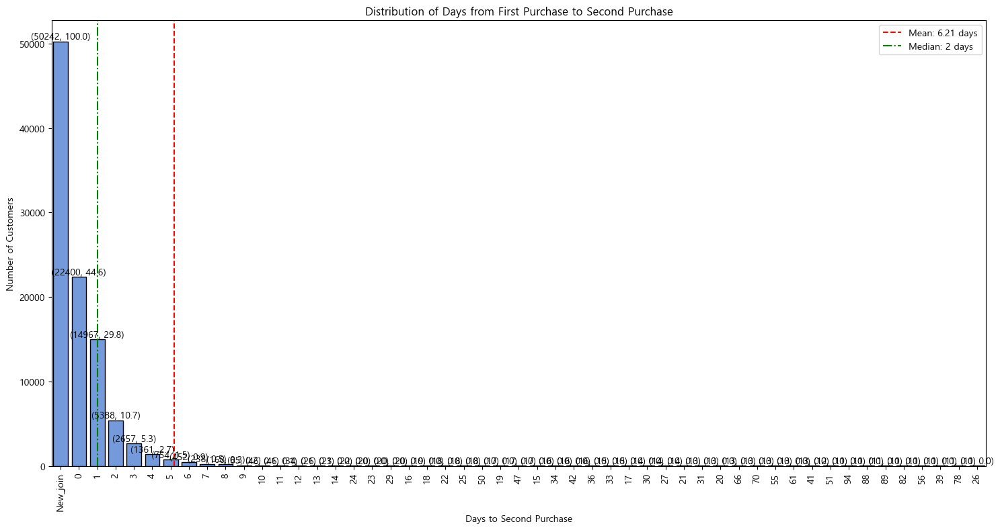

In [374]:
# Set the percentile value
percentile_value = 0.90

# Filter data according to the percentile
quantile_limit = join_to_fir_purchase['Frequency'][1:].quantile(percentile_value)
filtered_data = join_to_fir_purchase[join_to_fir_purchase['Frequency'] >= quantile_limit]

# Plotting
plt.figure(figsize=(15, 8))
ax = sns.barplot(x='Category', y='Frequency', data=filtered_data[0:200], color='cornflowerblue', edgecolor='black')

# Highlighting the mean, median, and max customer periods
plt.axvline(x=weighted_avg, color='r', linestyle='--', label=f'Mean: {weighted_avg:.2f} days')
plt.axvline(x=int(median_value), color='g', linestyle='-.', label=f'Median: {median_value} days')

# Annotate the bars with their frequency values
for p in ax.patches:
    ax.annotate(f'{int(p.get_height()),round(int(p.get_height())/len(customers_with_purchase)*100, 1)}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
                textcoords='offset points')
    
    
join_to_fir_purchase['Frequency'][2:].sum()

# Setting labels and title
plt.xticks(rotation=90)
plt.xlabel('Days to Second Purchase')
plt.ylabel('Number of Customers')
plt.title('Distribution of Days from First Purchase to Second Purchase')
plt.legend()
plt.tight_layout()
plt.show()


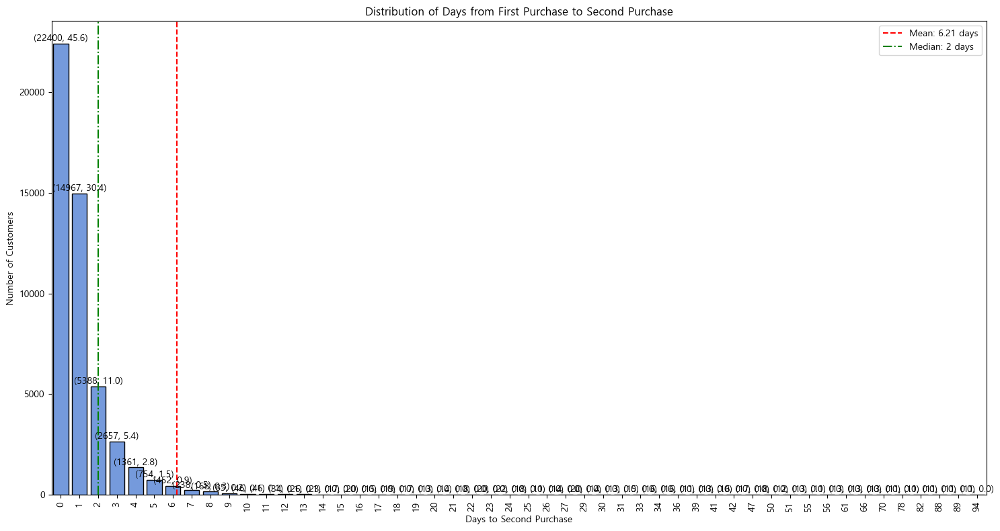

In [397]:
filtered_data = join_to_fir_purchase.iloc[1:]

# Set the percentile value
percentile_value = 0.90

# Filter data according to the percentile
quantile_limit = filtered_data['Frequency'][0:].quantile(percentile_value)
filtered_data = filtered_data[filtered_data['Frequency'] >= quantile_limit]

# Calculate the annotations first
annotations = [
    (int(p.get_height()), round(int(p.get_height()) / filtered_data['Frequency'].sum() * 100, 1))
    for p in ax.patches
]

plt.figure(figsize=(15, 8))
ax = sns.barplot(x='Category', y='Frequency', data=filtered_data[0:200], color='cornflowerblue', edgecolor='black')

# Highlighting the mean, median, and max customer periods
plt.axvline(x=weighted_avg, color='r', linestyle='--', label=f'Mean: {weighted_avg:.2f} days')
plt.axvline(x=int(median_value), color='g', linestyle='-.', label=f'Median: {median_value} days')

# Annotate the bars with their frequency values
for p, (height, percentage) in zip(ax.patches, annotations):
    ax.annotate(f'{height, percentage}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
                textcoords='offset points')
    
# Setting labels and title
plt.xticks(rotation=90)
plt.xlabel('Days to Second Purchase')
plt.ylabel('Number of Customers')
plt.title('Distribution of Days from First Purchase to Second Purchase')
plt.legend()
plt.tight_layout()
plt.show()


# 첫 구매 이후 재 구매까지 걸리는 기간 분포

In [ ]:
# Using pivot_table to get the first and second order dates for each customer
pivot_df = df.pivot_table(index='customer_id', columns=df.groupby('customer_id').cumcount() + 1, values='order_date', aggfunc='first')

# Calculate the difference in days between the first and second order
pivot_df['days_between_1_and_2'] = (pivot_df[2] - pivot_df[1]).dt.days

# Calculate the number of customers with NaN values for days between the first and second order
nan_count_2 = pivot_df['days_between_1_and_2'].isna().sum()

# Filter out NaN values for plotting
first_two_orders_cleaned_2 = pivot_df['days_between_1_and_2'].dropna()

nan_count_2, first_two_orders_cleaned_2.head()


(8476,
 customer_id
 3      28.0
 8      76.0
 9       0.0
 15      0.0
 17    672.0
 Name: days_between_1_and_2, dtype: float64)

In [ ]:

# 데이터 프레임으로 변경

first_two_orders_cleaned_2_df = first_two_orders_cleaned_2.reset_index()
first_two_orders_cleaned_2_df

mask = (first_two_orders_cleaned_2_df['days_between_1_and_2'] >= 0) & (first_two_orders_cleaned_2_df['days_between_1_and_2'] <= 1)
first_two_orders_cleaned_3 = first_two_orders_cleaned_2_df[~mask]



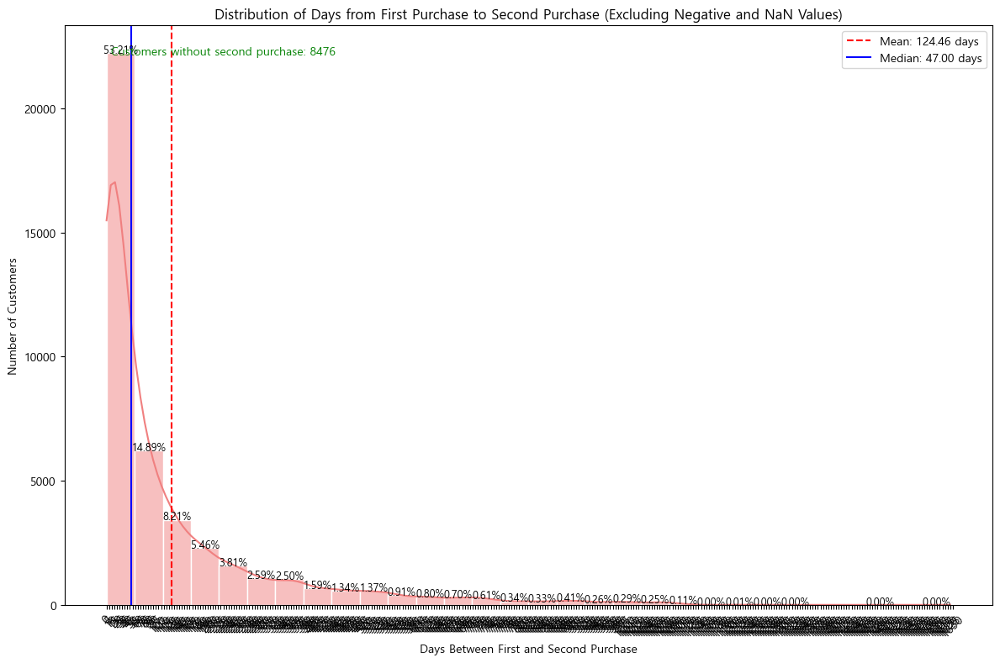

In [ ]:
# 기간 설정을 5 15 25 로 함
# bins=30으로 함

# Filter out negative values
first_two_orders_cleaned_2 = first_two_orders_cleaned_2[first_two_orders_cleaned_2 >= 0]

# Plotting the distribution excluding negative and NaN values
plt.figure(figsize=(12, 8))
ax = sns.histplot(data=first_two_orders_cleaned_2, bins=30, kde=True, color='lightcoral', edgecolor="w", linewidth=1)

# Adjusting x-axis ticks for granularity
ax.set_xticks(range(0, int(first_two_orders_cleaned_2.max()) + 10, 5))
plt.xticks(rotation=45)

# Annotate the percentages on the histogram
for p in ax.patches:
    if p.get_height() > 0:
        height = p.get_height()
        ax.text(p.get_x() + p.get_width() / 2.,
                height + 3,
                '{:1.2f}%'.format(100 * height / len(first_two_orders_cleaned_2)),
                ha="center", fontsize=9)

# Plotting mean and median
mean_val_2_updated = first_two_orders_cleaned_2.mean()
median_val_2_updated = first_two_orders_cleaned_2.median()
plt.axvline(mean_val_2_updated, color='r', linestyle='--', label=f'Mean: {mean_val_2_updated:.2f} days')
plt.axvline(median_val_2_updated, color='b', linestyle='-', label=f'Median: {median_val_2_updated:.2f} days')

# Annotate number of customers who haven't made a second purchase
plt.annotate(f'Customers without second purchase: {nan_count_2}', xy=(0.05, 0.95), xycoords='axes fraction', fontsize=10, color='green')

# Setting the title and labels
plt.title("Distribution of Days from First Purchase to Second Purchase (Excluding Negative and NaN Values)")
plt.xlabel("Days Between First and Second Purchase")
plt.ylabel("Number of Customers")
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()


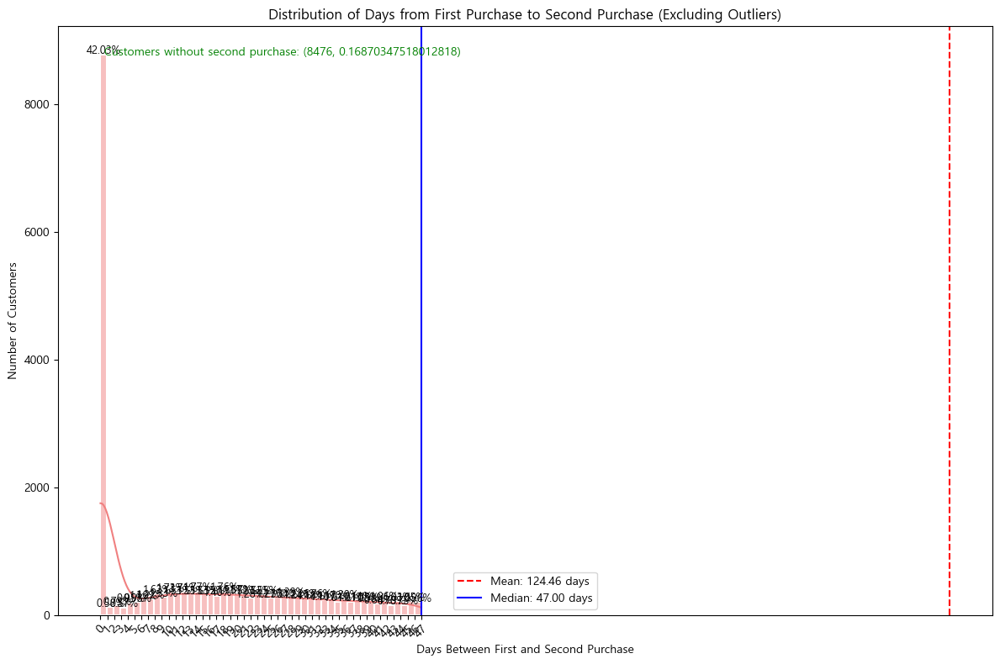

In [ ]:
# Calculate the 95th percentile of the 'days_between_1_and_2' column
percentile_95_2 = first_two_orders_cleaned_2.quantile(0.5)

# x축의 눈금 설정: 0일부터 95번째 백분위수까지 1일 간격
xticks = range(0, int(percentile_95_2) + 1)

# bins 설정: 데이터의 범위를 정확히 나타내기 위한 bin의 수
bins = int(percentile_95_2) + 1


# Plotting the distribution with increased spacing between bars
plt.figure(figsize=(12, 8))
ax = sns.histplot(data=first_two_orders_cleaned_2[first_two_orders_cleaned_2 <= percentile_95_2], bins=bins, kde=True, color='lightcoral', edgecolor="w", linewidth=1.5)

# Adjusting x-axis ticks for granularity
ax.set_xticks(range(0, int(percentile_95_2) + 1, 1))
plt.xticks(rotation=45)

# Annotate the percentages on the histogram
for p in ax.patches:
    if p.get_height() > 0:
        height = p.get_height()
        ax.text(p.get_x() + p.get_width() / 2.,
                height + 3,
                '{:1.2f}%'.format(100 * height / len(first_two_orders_cleaned_2[first_two_orders_cleaned_2 <= percentile_95_2])),
                ha="center", fontsize=9)

# Plotting mean and median
plt.axvline(mean_val_2_updated, color='r', linestyle='--', label=f'Mean: {mean_val_2_updated:.2f} days')
plt.axvline(median_val_2_updated, color='b', linestyle='-', label=f'Median: {median_val_2_updated:.2f} days')

# Annotate number of customers who haven't made a second purchase
plt.annotate(f'Customers without second purchase: {nan_count_2, nan_count_2/len(pivot_df)}', xy=(0.05, 0.95), xycoords='axes fraction', fontsize=10, color='green')

# Setting the title and labels
plt.title("Distribution of Days from First Purchase to Second Purchase (Excluding Outliers)")
plt.xlabel("Days Between First and Second Purchase")
plt.ylabel("Number of Customers")
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()


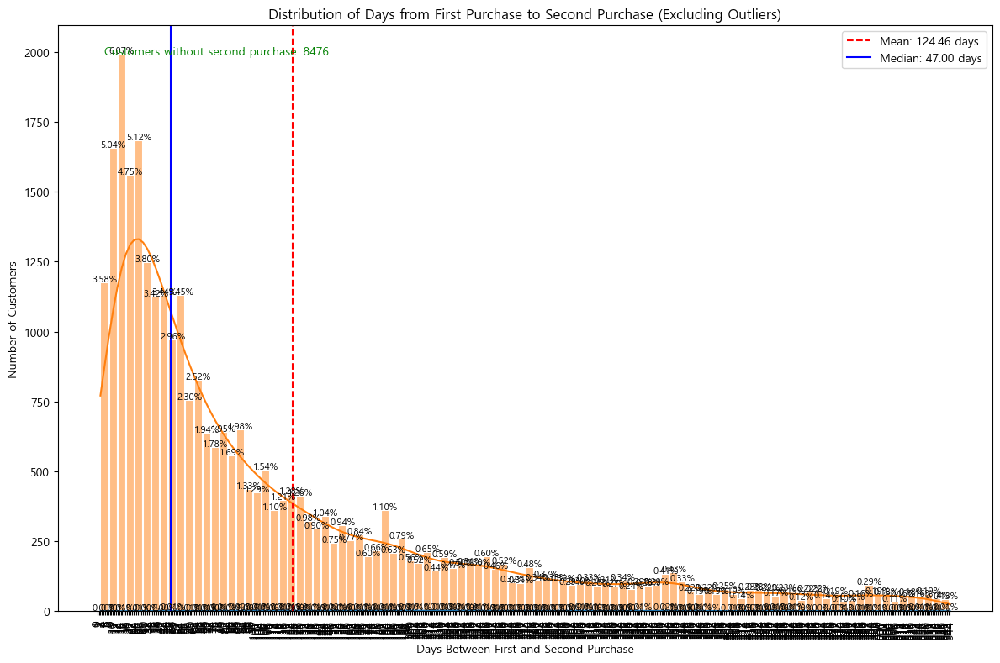

In [ ]:
# Plotting the distribution with improved x-axis ticks and labels
plt.figure(figsize=(12, 8))
ax = sns.histplot(data=first_two_orders_cleaned_2[first_two_orders_cleaned_2 <= percentile_95_2], bins=100, kde=True, color='lightcoral', edgecolor="w", linewidth=1.5)

# Adjusting x-axis ticks for granularity and better visibility
ax.set_xticks(range(0, int(percentile_95_2) + 1, 5))
plt.xticks(rotation=90, fontsize=10)

# Annotate the percentages on the histogram
for p in ax.patches:
    if p.get_height() > 0:
        height = p.get_height()
        ax.text(p.get_x() + p.get_width() / 2.,
                height + 3,
                '{:1.2f}%'.format(100 * height / len(first_two_orders_cleaned_2[first_two_orders_cleaned_2 <= percentile_95_2])),
                ha="center", fontsize=8)

# Plotting mean and median
plt.axvline(mean_val_2_updated, color='r', linestyle='--', label=f'Mean: {mean_val_2_updated:.2f} days')
plt.axvline(median_val_2_updated, color='b', linestyle='-', label=f'Median: {median_val_2_updated:.2f} days')

# Annotate number of customers who haven't made a second purchase
plt.annotate(f'Customers without second purchase: {nan_count_2}', xy=(0.05, 0.95), xycoords='axes fraction', fontsize=10, color='green')

# Setting the title and labels
plt.title("Distribution of Days from First Purchase to Second Purchase (Excluding Outliers)")
plt.xlabel("Days Between First and Second Purchase")
plt.ylabel("Number of Customers")
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()


# 전체데이터 구매 -> 구매까지 걸리는 기간 분포

In [28]:
df_sample = df.sample(1000)
df_sample.to_csv('df_sample.csv')

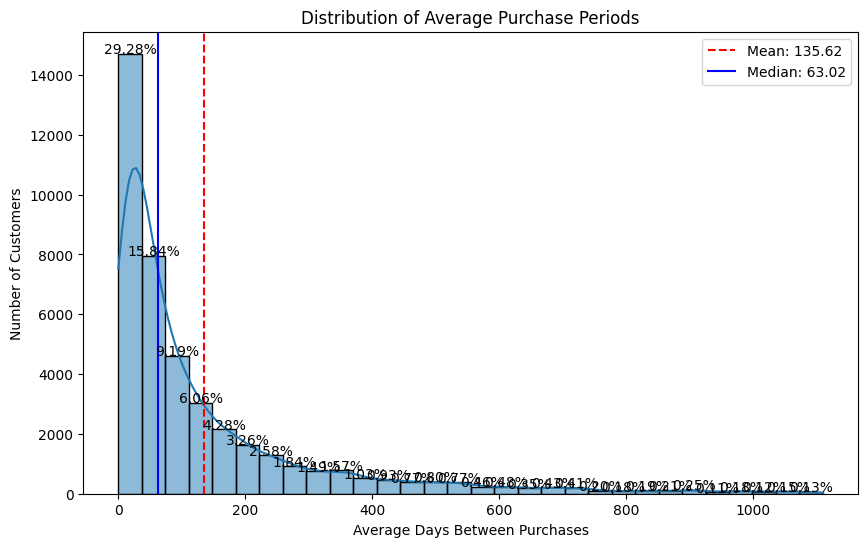

In [21]:
avg_periods = df.groupby('customer_id')['date_diff'].mean()

plt.figure(figsize=(10, 6))
ax = sns.histplot(avg_periods, bins=30, kde=True)

for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2.,
            height + 3,
            '{:1.2f}%'.format(100 * height / len(avg_periods)),
            ha="center")

mean_val = avg_periods.mean()
median_val = avg_periods.median()
plt.axvline(mean_val, color='r', linestyle='--', label=f'Mean: {mean_val:.2f}')
plt.axvline(median_val, color='b', linestyle='-', label=f'Median: {median_val:.2f}')

plt.title("Distribution of Average Purchase Periods")
plt.xlabel("Average Days Between Purchases")
plt.ylabel("Number of Customers")
plt.legend()
plt.show()

In [84]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1201035 entries, 352123 to 1202276
Data columns (total 23 columns):
 #   Column           Non-Null Count    Dtype              
---  ------           --------------    -----              
 0   created_at       1201035 non-null  datetime64[ns, UTC]
 1   order_date       1201035 non-null  datetime64[ns]     
 2   order_time       1201035 non-null  object             
 3   customer_id      1201035 non-null  int64              
 4   session_id       1201035 non-null  object             
 5   payment_method   1201035 non-null  object             
 6   payment_status   1201035 non-null  object             
 7   promo_amount     1201035 non-null  int64              
 8   promo_code       1201035 non-null  object             
 9   shipment_fee     1201035 non-null  int64              
 10  total_amount     1201035 non-null  int64              
 11  product_id       1201035 non-null  int64              
 12  quantity         1201035 non-null  int64  

In [83]:
df.head()

,created_at,order_date,order_time,customer_id,session_id,payment_method,payment_status,promo_amount,promo_code,shipment_fee,...,item_price,quantity_price,product_id,birthdate,first_join_date,order_month,order_year,join_year,order_num,date_diff
352123,2018-08-25 18:54:03.844494+00:00,2018-08-25,18:54:03,3,f03b6825-1e6e-4916-bf71-f94ecbcbaee5,Credit Card,Success,8073,WEEKENDMANTAP,0,...,166934,834670,56019,1986-07-12,2018-08-25,2018-08,2018,2018,1,NaN
352124,2018-09-22 18:42:52.844494+00:00,2018-09-22,18:42:52,3,36673b2f-940a-42b5-994d-1cce4796b55f,Credit Card,Success,0,Not Promoted,10000,...,153784,153784,30235,1986-07-12,2018-08-25,2018-09,2018,2018,2,28.0
352125,2018-10-20 19:07:54.844494+00:00,2018-10-20,19:07:54,3,93e1d3c4-bed1-4ef4-b79f-e24a79e905b7,Credit Card,Success,8828,WEEKENDSERU,10000,...,123760,123760,7808,1986-07-12,2018-08-25,2018-10,2018,2018,3,28.0
352126,2018-11-17 19:09:49.844494+00:00,2018-11-17,19:09:49,3,8356370c-267e-4530-a2d3-1830e4be3f2b,Credit Card,Success,3415,WEEKENDSERU,0,...,251317,251317,48968,1986-07-12,2018-08-25,2018-11,2018,2018,4,28.0
352127,2018-12-15 19:33:50.844494+00:00,2018-12-15,19:33:50,3,ef7f4829-e7d1-4513-861b-1fbbc6e41bbf,Credit Card,Success,2645,LIBURDONG,10000,...,173882,173882,59272,1986-07-12,2018-08-25,2018-12,2018,2018,5,28.0


In [ ]:
# 1. 각 구매 주기별 고객 수 (도수) 계산
frequencies = filtered_avg_periods.value_counts()

# 2. 각 구매 주기와 해당 도수를 곱합니다.
weighted_values = frequencies.index * frequencies.values

# 3. 모든 구매 주기의 가중치를 합산합니다.
total_weighted_sum = weighted_values.sum()

# 4. 가중치 합계를 전체 고객 수로 나누어 가중 평균을 얻습니다.
weighted_avg = total_weighted_sum / frequencies.values.sum()




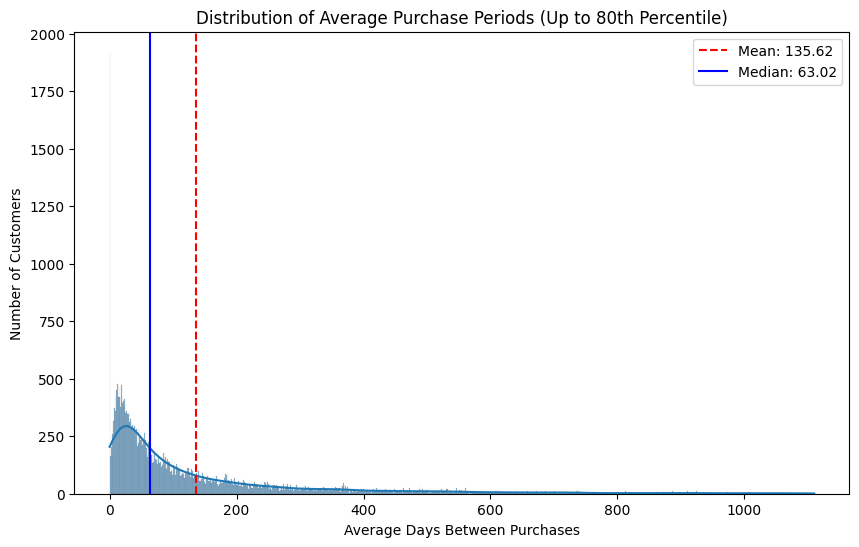

In [89]:
# 구매 주기 평균
avg_periods = df.groupby('customer_id')['date_diff'].mean()


# 80 백분위수 계산
quantile_80 = avg_periods.quantile(1)

# 해당 백분위수 이하의 데이터만 필터링
filtered_avg_periods = avg_periods[avg_periods <= quantile_80]


# x축의 단위를 1일로 설정
plt.figure(figsize=(10, 6))
ax = sns.histplot(filtered_avg_periods, bins=int(quantile_80), kde=True)

    
mean_val = filtered_avg_periods.mean()
median_val = filtered_avg_periods.median()


# 평균 및 중앙값 계산 및 표시
plt.axvline(mean_val, color='r', linestyle='--', label=f'Mean: {mean_val:.2f}')
plt.axvline(median_val, color='b', linestyle='-', label=f'Median: {median_val:.2f}')

# 그래프 제목 및 레이블 설정
plt.title("Distribution of Average Purchase Periods (Up to 80th Percentile)")
plt.xlabel("Average Days Between Purchases")
plt.ylabel("Number of Customers")
plt.legend()
plt.show()



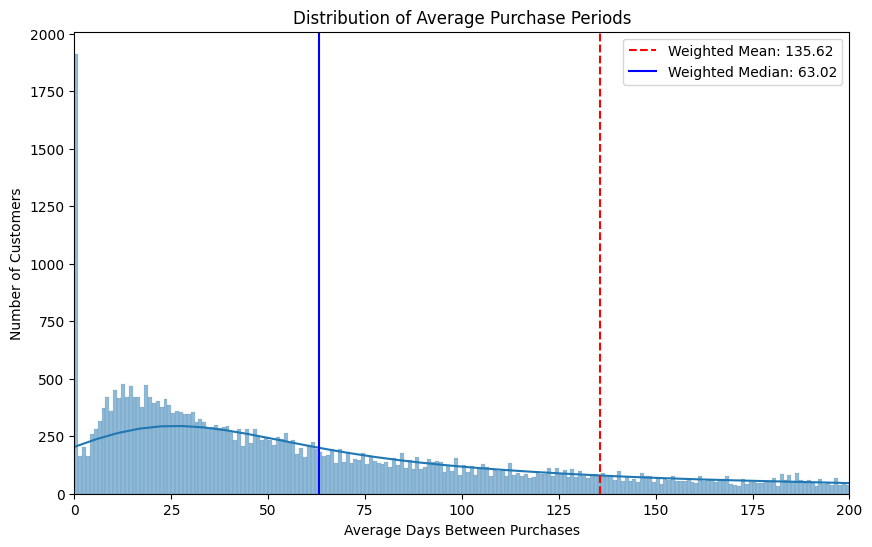

In [93]:
# 구매 주기 평균 계산
avg_periods = df.groupby('customer_id')['date_diff'].mean()

# 100% 백분위수 (즉, 최대값) 계산
quantile_100 = avg_periods.quantile(1)

# 해당 백분위수 이하의 데이터만 필터링
filtered_avg_periods = avg_periods[avg_periods <= quantile_100]

# 각 구매 주기별 고객 수 (도수) 계산
frequencies = filtered_avg_periods.value_counts()

# 가중 평균 계산
weighted_values = (frequencies.index * frequencies.values).tolist()
total_weighted_sum = sum(weighted_values)
weighted_avg = total_weighted_sum / frequencies.values.sum()

# 가중 중앙값 계산
cumulative_freq = frequencies.sort_index().cumsum()
mid_freq = cumulative_freq.iloc[-1] / 2
weighted_median = cumulative_freq[cumulative_freq >= mid_freq].index[0]

# 그래프 그리기
plt.figure(figsize=(10, 6))
ax = sns.histplot(filtered_avg_periods, bins=int(quantile_100), kde=True)
ax.set_xlim(0, 200)

# 평균 및 중앙값 표시
plt.axvline(weighted_avg, color='r', linestyle='--', label=f'Weighted Mean: {weighted_avg:.2f}')
plt.axvline(weighted_median, color='b', linestyle='-', label=f'Weighted Median: {weighted_median:.2f}')

# 그래프 제목 및 레이블 설정
plt.title("Distribution of Average Purchase Periods")
plt.xlabel("Average Days Between Purchases")
plt.ylabel("Number of Customers")
plt.legend()
plt.show()


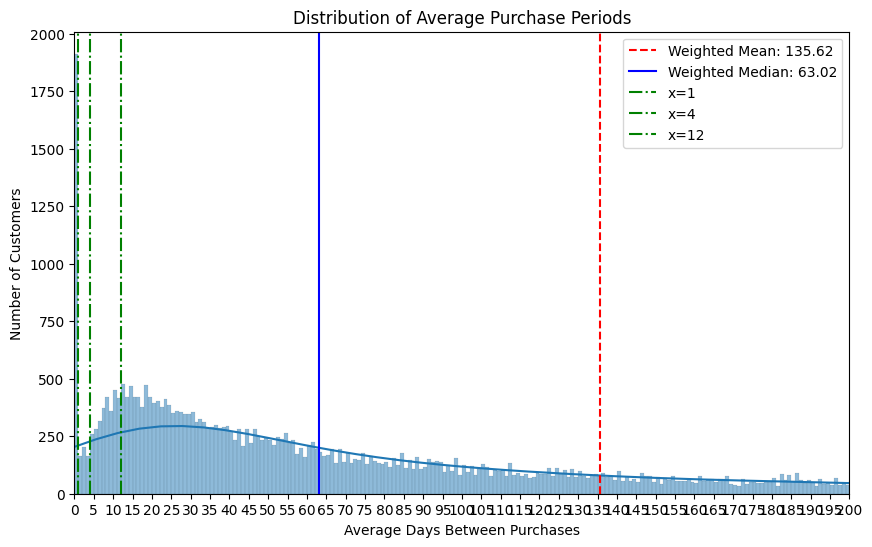

In [97]:
# 100% 백분위수 (즉, 최대값) 계산
quantile_100 = avg_periods.quantile(1)

# 해당 백분위수 이하의 데이터만 필터링
filtered_avg_periods = avg_periods[avg_periods <= quantile_100]

# 각 구매 주기별 고객 수 (도수) 계산
frequencies = filtered_avg_periods.value_counts()

# 가중 평균 계산
weighted_values = (frequencies.index * frequencies.values).tolist()
total_weighted_sum = sum(weighted_values)
weighted_avg = total_weighted_sum / frequencies.values.sum()

# 가중 중앙값 계산
cumulative_freq = frequencies.sort_index().cumsum()
mid_freq = cumulative_freq.iloc[-1] / 2
weighted_median = cumulative_freq[cumulative_freq >= mid_freq].index[0]

# 그래프 그리기
plt.figure(figsize=(10, 6))
ax = sns.histplot(filtered_avg_periods, bins=int(quantile_100), kde=True)
ax.set_xticks(range(0, 201, 5))
ax.set_xlim(0, 200)

# 평균 및 중앙값 표시
plt.axvline(weighted_avg, color='r', linestyle='--', label=f'Weighted Mean: {weighted_avg:.2f}')
plt.axvline(weighted_median, color='b', linestyle='-', label=f'Weighted Median: {weighted_median:.2f}')
plt.axvline(1, color='g', linestyle='-.', label='x=1')
plt.axvline(4, color='g', linestyle='-.', label='x=4')
plt.axvline(12, color='g', linestyle='-.', label='x=12')

# 그래프 제목 및 레이블 설정
plt.title("Distribution of Average Purchase Periods")
plt.xlabel("Average Days Between Purchases")
plt.ylabel("Number of Customers")
plt.legend()
plt.show()



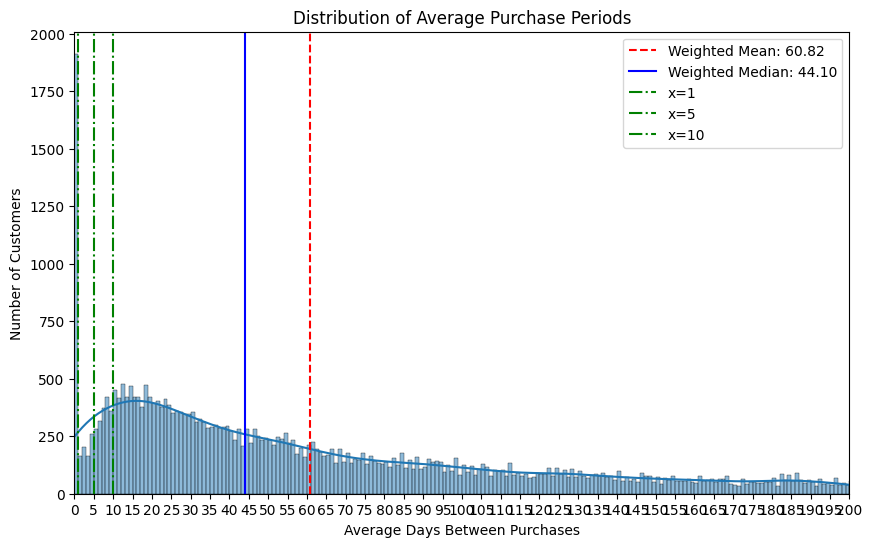

In [96]:
# 100% 백분위수 (즉, 최대값) 계산
quantile_100 = avg_periods.quantile(0.8)

# 해당 백분위수 이하의 데이터만 필터링
filtered_avg_periods = avg_periods[avg_periods <= quantile_100]

# 각 구매 주기별 고객 수 (도수) 계산
frequencies = filtered_avg_periods.value_counts()

# 가중 평균 계산
weighted_values = (frequencies.index * frequencies.values).tolist()
total_weighted_sum = sum(weighted_values)
weighted_avg = total_weighted_sum / frequencies.values.sum()

# 가중 중앙값 계산
cumulative_freq = frequencies.sort_index().cumsum()
mid_freq = cumulative_freq.iloc[-1] / 2
weighted_median = cumulative_freq[cumulative_freq >= mid_freq].index[0]

# 그래프 그리기
plt.figure(figsize=(10, 6))
ax = sns.histplot(filtered_avg_periods, bins=int(quantile_100), kde=True)
ax.set_xticks(range(0, 201, 5))
ax.set_xlim(0, 200)

# 평균 및 중앙값 표시
plt.axvline(weighted_avg, color='r', linestyle='--', label=f'Weighted Mean: {weighted_avg:.2f}')
plt.axvline(weighted_median, color='b', linestyle='-', label=f'Weighted Median: {weighted_median:.2f}')
plt.axvline(1, color='g', linestyle='-.', label='x=1')
plt.axvline(5, color='g', linestyle='-.', label='x=5')
plt.axvline(10, color='g', linestyle='-.', label='x=10')

# 그래프 제목 및 레이블 설정
plt.title("Distribution of Average Purchase Periods")
plt.xlabel("Average Days Between Purchases")
plt.ylabel("Number of Customers")
plt.legend()
plt.show()




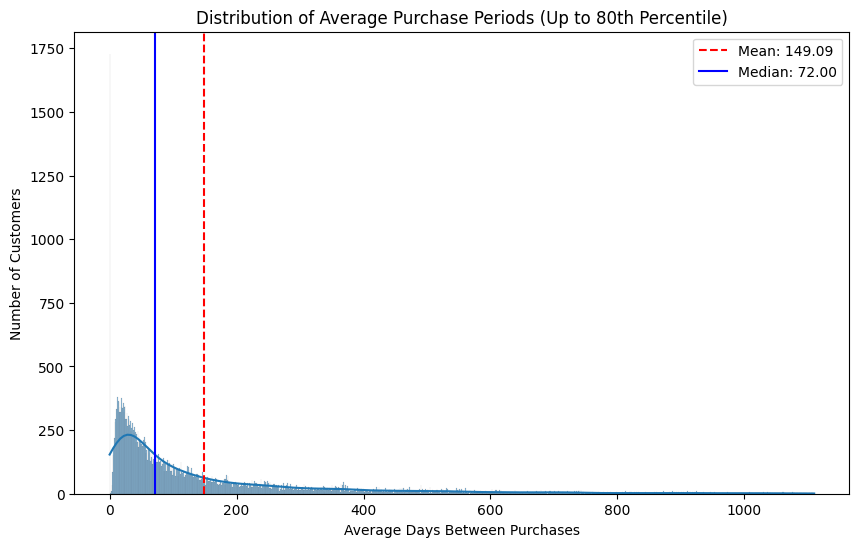

In [86]:


df_without_22 = df.query('order_date < "2022-01-01"')

# 구매 주기 평균
avg_periods = df_without_22.groupby('customer_id')['date_diff'].mean()


# 80 백분위수 계산
quantile_80 = avg_periods.quantile(1)

# 해당 백분위수 이하의 데이터만 필터링
filtered_avg_periods = avg_periods[avg_periods <= quantile_80]


# x축의 단위를 1일로 설정
plt.figure(figsize=(10, 6))
ax = sns.histplot(filtered_avg_periods, bins=int(quantile_80), kde=True)

    
mean_val = filtered_avg_periods.mean()
median_val = filtered_avg_periods.median()
# 평균 및 중앙값 계산 및 표시
plt.axvline(mean_val, color='r', linestyle='--', label=f'Mean: {mean_val:.2f}')
plt.axvline(median_val, color='b', linestyle='-', label=f'Median: {median_val:.2f}')

# 그래프 제목 및 레이블 설정
plt.title("Distribution of Average Purchase Periods (Up to 80th Percentile)")
plt.xlabel("Average Days Between Purchases")
plt.ylabel("Number of Customers")
plt.legend()
plt.show()



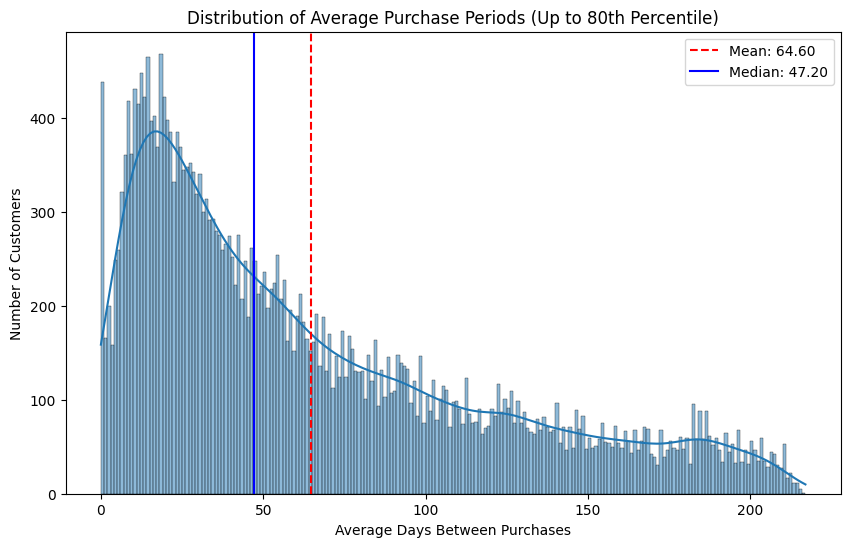

In [87]:
df_without_22 = df.query('order_date > "2022-01-01"')

# 구매 주기 평균
avg_periods = df_without_22.groupby('customer_id')['date_diff'].mean()


# 80 백분위수 계산
quantile_80 = avg_periods.quantile(1)

# 해당 백분위수 이하의 데이터만 필터링
filtered_avg_periods = avg_periods[avg_periods <= quantile_80]


# x축의 단위를 1일로 설정
plt.figure(figsize=(10, 6))
ax = sns.histplot(filtered_avg_periods, bins=int(quantile_80), kde=True)

    
mean_val = filtered_avg_periods.mean()
median_val = filtered_avg_periods.median()
# 평균 및 중앙값 계산 및 표시
plt.axvline(mean_val, color='r', linestyle='--', label=f'Mean: {mean_val:.2f}')
plt.axvline(median_val, color='b', linestyle='-', label=f'Median: {median_val:.2f}')

# 그래프 제목 및 레이블 설정
plt.title("Distribution of Average Purchase Periods (Up to 80th Percentile)")
plt.xlabel("Average Days Between Purchases")
plt.ylabel("Number of Customers")
plt.legend()
plt.show()



In [80]:
# 제안된 구매 주기 후보
proposed_periods = [30, 60, 90, 100, 120, 150, 180, 210, 365]

# 각 구매 주기마다 해당하는 고객의 백분율 계산
percentages = {}
for period in proposed_periods:
    percentages[period] = round((avg_periods[avg_periods <= period].count() / avg_periods.count()) * 100,1)

percentages


{30: 30.2,
 60: 48.5,
 90: 59.5,
 100: 62.4,
 120: 67.0,
 150: 72.7,
 180: 76.7,
 210: 80.3,
 365: 89.9}

In [81]:
# 제안된 구매 주기 후보
proposed_periods = [30, 60, 90, 120, 150, 180, 210, 365]

# 각 구매 주기마다 해당하는 고객의 백분율 계산
percentages = {}
for period in proposed_periods:
    percentages[period] = round((filtered_avg_periods[filtered_avg_periods <= period].count() / filtered_avg_periods.count()) * 100,1)

percentages


{30: 37.7,
 60: 60.7,
 90: 74.3,
 120: 83.7,
 150: 90.9,
 180: 95.9,
 210: 100.0,
 365: 100.0}

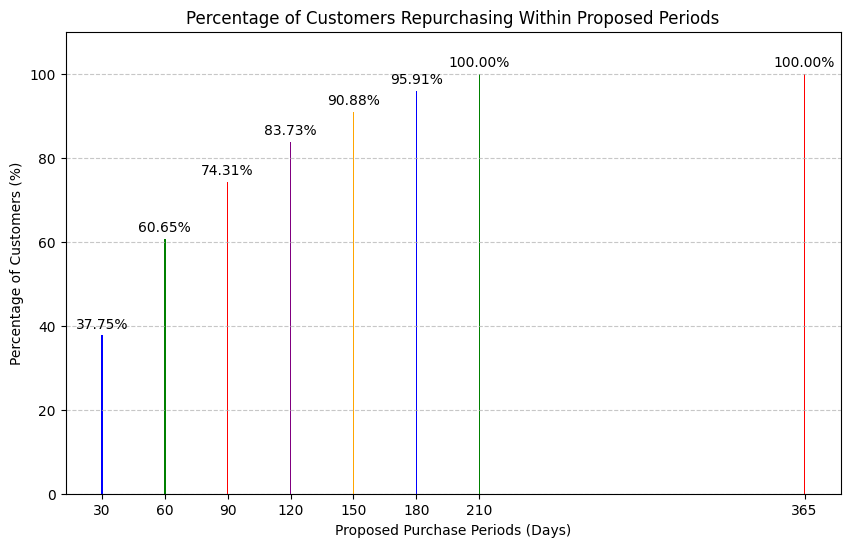

In [58]:
# 막대 그래프로 percentages 표시
plt.figure(figsize=(10, 6))
plt.bar(percentages.keys(), percentages.values(), color=['blue', 'green', 'red', 'purple', 'orange'])
plt.xlabel('Proposed Purchase Periods (Days)')
plt.ylabel('Percentage of Customers (%)')
plt.title('Percentage of Customers Repurchasing Within Proposed Periods')
plt.xticks(list(percentages.keys()))
plt.ylim(0, 110)  # y-axis limit set to 110 to better visualize the data
plt.grid(axis='y', linestyle='--', alpha=0.7)

# 각 막대 위에 백분율 표시
for x, y in percentages.items():
    plt.text(x, y + 1, f"{y:.2f}%", ha='center', va='bottom')

plt.show()


In [98]:
bins = [0, 30, 60, 90, 120, 150, np.inf]  
labels = ['0-30', '31-60', '61-90', '91-120', '121-150', '151+']

df['date_diff_bin'] = pd.cut(df['date_diff'], bins=bins, labels=labels, right=False)


# 구매 주기 평균
avg_periods = df_without_22.groupby('customer_id')['date_diff'].mean()

sum_quantity_price_per_bin = df.groupby(['customer_id', 'date_diff_bin'])['quantity_price'].sum().reset_index()

average_of_sums_per_bin = sum_quantity_price_per_bin.groupby('date_diff_bin')['quantity_price'].mean()


quantile_80 = average_of_sums_per_bin.quantile(0.8)
# 해당 백분위수 이하의 데이터만 필터링
filtered_average_of_sums_per_bin = average_of_sums_per_bin[average_of_sums_per_bin <= quantile_80]


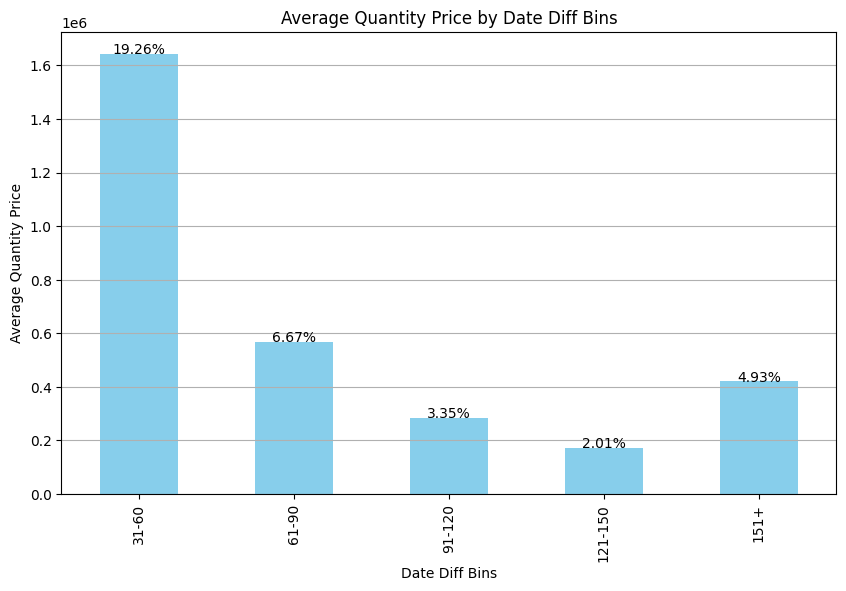

In [104]:
bins = [0, 30, 60, 90, 120, 150, np.inf]  
labels = ['0-30', '31-60', '61-90', '91-120', '121-150', '151+']

df['date_diff_bin'] = pd.cut(df['date_diff'], bins=bins, labels=labels, right=False)


# 구매 주기 평균
avg_periods = df_without_22.groupby('customer_id')['date_diff'].mean()

sum_quantity_price_per_bin = df.groupby(['customer_id', 'date_diff_bin'])['quantity_price'].sum().reset_index()

average_of_sums_per_bin = sum_quantity_price_per_bin.groupby('date_diff_bin')['quantity_price'].mean()


quantile_80 = average_of_sums_per_bin.quantile(0.8)
# 해당 백분위수 이하의 데이터만 필터링
filtered_average_of_sums_per_bin = average_of_sums_per_bin[average_of_sums_per_bin <= quantile_80]

total_avg_qty_price = average_of_sums_per_bin.sum()

plt.figure(figsize=(10, 6))
ax = filtered_average_of_sums_per_bin.plot(kind='bar', color='skyblue')
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2.,
            height + 3,
            '{:1.2f}%'.format(100 * height / total_avg_qty_price),
            ha="center")

plt.title('Average Quantity Price by Date Diff Bins')
plt.xlabel('Date Diff Bins')
plt.ylabel('Average Quantity Price')
plt.grid(True, axis='y')
plt.show()


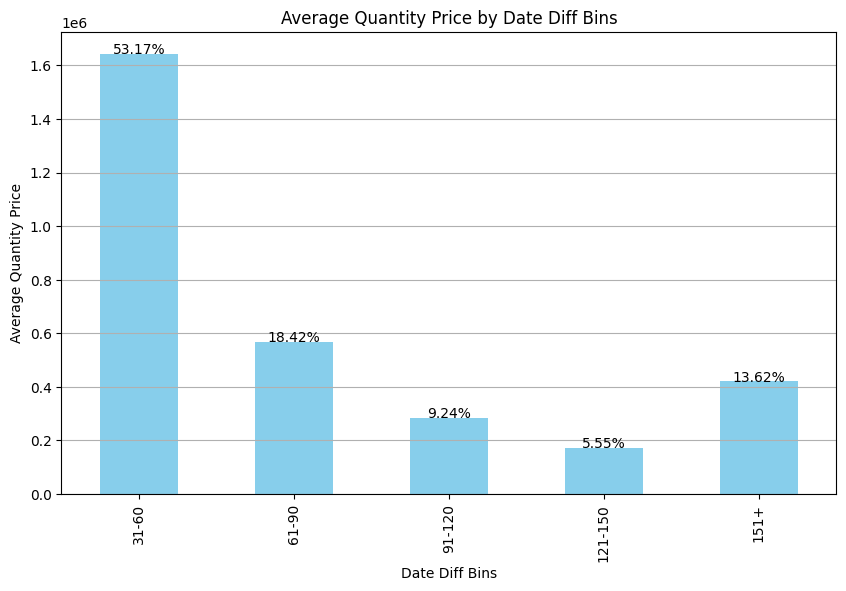

In [103]:
total_avg_qty_price = filtered_average_of_sums_per_bin.sum()

plt.figure(figsize=(10, 6))
ax = filtered_average_of_sums_per_bin.plot(kind='bar', color='skyblue')
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2.,
            height + 3,
            '{:1.2f}%'.format(100 * height / total_avg_qty_price),
            ha="center")

plt.title('Average Quantity Price by Date Diff Bins')
plt.xlabel('Date Diff Bins')
plt.ylabel('Average Quantity Price')
plt.grid(True, axis='y')
plt.show()


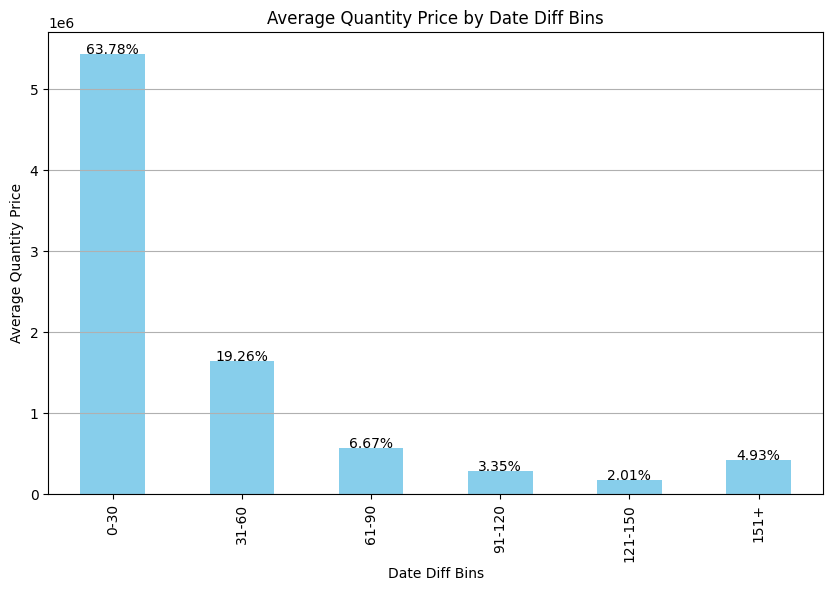

In [105]:
bins = [0, 30, 60, 90, 120, 150, np.inf]  
labels = ['0-30', '31-60', '61-90', '91-120', '121-150', '151+']

df['date_diff_bin'] = pd.cut(df['date_diff'], bins=bins, labels=labels, right=False)


# 구매 주기 평균
avg_periods = df_without_22.groupby('customer_id')['date_diff'].mean()

sum_quantity_price_per_bin = df.groupby(['customer_id', 'date_diff_bin'])['quantity_price'].sum().reset_index()

average_of_sums_per_bin = sum_quantity_price_per_bin.groupby('date_diff_bin')['quantity_price'].mean()

total_avg_qty_price = average_of_sums_per_bin.sum()

plt.figure(figsize=(10, 6))
ax = average_of_sums_per_bin.plot(kind='bar', color='skyblue')
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2.,
            height + 3,
            '{:1.2f}%'.format(100 * height / total_avg_qty_price),
            ha="center")

plt.title('Average Quantity Price by Date Diff Bins')
plt.xlabel('Date Diff Bins')
plt.ylabel('Average Quantity Price')
plt.grid(True, axis='y')
plt.show()


# 구매 순서별 이전 구매로부터 걸리는 기간


In [40]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1201035 entries, 352123 to 1202276
Data columns (total 24 columns):
 #   Column               Non-Null Count    Dtype              
---  ------               --------------    -----              
 0   created_at           1201035 non-null  datetime64[ns, UTC]
 1   order_date           1201035 non-null  datetime64[ns]     
 2   order_time           1201035 non-null  object             
 3   customer_id          1201035 non-null  int64              
 4   session_id           1201035 non-null  object             
 5   payment_method       1201035 non-null  object             
 6   payment_status       1201035 non-null  object             
 7   promo_amount         1201035 non-null  int64              
 8   promo_code           1201035 non-null  object             
 9   shipment_fee         1201035 non-null  int64              
 10  total_amount         1201035 non-null  int64              
 11  product_id           1201035 non-null  int64      

In [44]:
df_without_july = df.query('created_at < "2022-06-01T00:00:00+00:00"')


# Pivot_table

In [51]:


data_sorted = df_without_july.sort_values(by=['order_date', 'order_num'])

# Group by customer_id and order_num and then calculate the difference in days for each order_num
data_sorted['date_diff_per_order'] = data_sorted.groupby('customer_id')['order_date'].diff().dt.days
#date_diff 컬럼 이전 구매로부터 걸리는 기간 컬럼 만들어 놓으셧음

# Create a pivot table to count the number of customers for each date difference per order_num
pivot_table = data_sorted.pivot_table(index='order_num', columns='date_diff_per_order', values='customer_id', aggfunc='count')

# Calculate the number of customers who did not make any further purchases after a particular order_num
non_purchasers = data_sorted.groupby('customer_id')['order_num'].max().value_counts().sort_index().cumsum()
non_purchasers = data_sorted['customer_id'].nunique() - non_purchasers
pivot_table['No Purchase Afterwards'] = non_purchasers

# Replace NaN values with 0 and convert the values to integers
pivot_table.fillna(0, inplace=True)
pivot_table = pivot_table.astype(int)
pivot_table = pivot_table.reset_index()

In [52]:
print(pivot_table)

date_diff_per_order  order_num    0.0  1.0  2.0  3.0  4.0  5.0  6.0  7.0  8.0  \
0                            1  22038    0    0    0    0    0    0    0    0   
1                            2  17926    4   15   41  114  160  231  245  338   
2                            3  14610    3   15   42  117  158  239  248  336   
3                            4  13558    4   16   42  114  159  238  248  329   
4                            5  12276    4   16   43  111  162  222  249  333   
5                            6  11154    4   16   45  113  159  218  245  327   
6                            7  10539    4   16   45  117  153  220  253  324   
7                            8   9477    4   15   47  119  155  220  244  318   
8                            9   9155    4   16   42  114  154  220  236  316   
9                           10   7958    4   16   41  107  155  216  229  311   
10                          11   7918    4   15   43  110  153  206  225  304   
11                          

In [65]:
pd.reset_option('display.max_rows')

In [54]:
df_without_july_only_0 = df_without_july.sort_values(by=['order_date', 'order_num'])

# Group by customer_id and order_num and then calculate the difference in days for each order_num
df_without_july_only_0['date_diff_per_order'] = df_without_july_only_0.groupby('customer_id')['order_date'].diff().dt.days
df_without_july_only_0 = df_without_july_only_0[df_without_july_only_0['date_diff_per_order'] == 0]

In [67]:
df_without_july_only_0 = df_without_july.sort_values(by=['order_date', 'order_num'])

In [70]:
df_without_july_only_0.duplicated(subset=['order_date','customer_id']).count()

1125467

In [71]:
df_without_july_only_0_dup = df_without_july_only_0[df_without_july_only_0.duplicated(subset=['order_date','customer_id']) == True]

In [72]:
df_without_july_only_0_dup.head()

,created_at,order_date,order_time,customer_id,session_id,payment_method,payment_status,promo_amount,promo_code,shipment_fee,total_amount,product_id,quantity,item_price,quantity_price,product_id,birthdate,first_join_date,order_month,order_year,join_year,order_num,date_diff,days_to_first_order
1201590,2016-07-01 02:53:26.720195+00:00,2016-07-01,02:53:26,6183,c5d3792d-9220-47db-ad80-4932f3f88d0e,OVO,Success,6053,XX2022,10000,578826,7588,1,411340,411340,7588,1995-10-11,2016-07-01,2016-07,2016,2016,1,0.0,0
817185,2016-07-03 19:23:21.972374+00:00,2016-07-03,19:23:21,3675,298157dc-3898-4bd8-b96b-10b5d8255c4e,Debit Card,Success,5840,WEEKENDSERU,0,291335,59903,1,131206,131206,59903,1997-10-10,2016-07-03,2016-07,2016,2016,1,0.0,0
1098070,2016-07-04 17:10:39.774156+00:00,2016-07-04,17:10:39,29631,36e271fc-a5ae-4a09-8000-589bf738626d,Gopay,Success,0,Not Promoted,10000,1173813,27288,1,208181,208181,27288,1994-04-22,2016-07-04,2016-07,2016,2016,1,0.0,0
1098071,2016-07-04 17:10:39.774156+00:00,2016-07-04,17:10:39,29631,36e271fc-a5ae-4a09-8000-589bf738626d,Gopay,Success,0,Not Promoted,10000,1173813,27834,3,205454,616362,27834,1994-04-22,2016-07-04,2016-07,2016,2016,1,0.0,0
817201,2016-07-04 03:19:37.878958+00:00,2016-07-04,03:19:37,74769,8aca9390-1ba5-4998-8e57-327ab85d2a6d,Credit Card,Success,6837,BUYMORE,0,539346,14305,1,226490,226490,14305,2004-11-25,2016-07-03,2016-07,2016,2016,1,0.0,1


In [420]:
df

,created_at,order_date,order_time,customer_id,session_id,payment_method,payment_status,promo_amount,promo_code,shipment_fee,total_amount,product_id,quantity,item_price,quantity_price,product_id,birthdate,first_join_date,order_month,order_year,join_year,order_num,date_diff,days_to_first_order
352123,2018-08-25 18:54:03.844494+00:00,2018-08-25,18:54:03,3,f03b6825-1e6e-4916-bf71-f94ecbcbaee5,Credit Card,Success,8073,WEEKENDMANTAP,0,826597,56019,5,166934,834670,56019,1986-07-12,2018-08-25,2018-08,2018,2018,1,NaN,0
352124,2018-09-22 18:42:52.844494+00:00,2018-09-22,18:42:52,3,36673b2f-940a-42b5-994d-1cce4796b55f,Credit Card,Success,0,Not Promoted,10000,163784,30235,1,153784,153784,30235,1986-07-12,2018-08-25,2018-09,2018,2018,2,28.0,0
352125,2018-10-20 19:07:54.844494+00:00,2018-10-20,19:07:54,3,93e1d3c4-bed1-4ef4-b79f-e24a79e905b7,Credit Card,Success,8828,WEEKENDSERU,10000,124932,7808,1,123760,123760,7808,1986-07-12,2018-08-25,2018-10,2018,2018,3,28.0,0
352126,2018-11-17 19:09:49.844494+00:00,2018-11-17,19:09:49,3,8356370c-267e-4530-a2d3-1830e4be3f2b,Credit Card,Success,3415,WEEKENDSERU,0,247902,48968,1,251317,251317,48968,1986-07-12,2018-08-25,2018-11,2018,2018,4,28.0,0
352127,2018-12-15 19:33:50.844494+00:00,2018-12-15,19:33:50,3,ef7f4829-e7d1-4513-861b-1fbbc6e41bbf,Credit Card,Success,2645,LIBURDONG,10000,181237,59272,1,173882,173882,59272,1986-07-12,2018-08-25,2018-12,2018,2018,5,28.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
336586,2022-01-25 00:54:09.703960+00:00,2022-01-25,00:54:09,99998,4fc4d81b-4b29-4aef-bd1f-263c373950d1,Credit Card,Success,1954,BUYMORE,10000,4222436,18523,1,358650,358650,18523,2014-05-21,2018-07-01,2022-01,2022,2018,8,187.0,1
336587,2022-01-25 00:54:09.703960+00:00,2022-01-25,00:54:09,99998,4fc4d81b-4b29-4aef-bd1f-263c373950d1,Credit Card,Success,1954,BUYMORE,10000,4222436,44211,1,135965,135965,44211,2014-05-21,2018-07-01,2022-01,2022,2018,8,187.0,1
336588,2022-01-25 00:54:09.703960+00:00,2022-01-25,00:54:09,99998,4fc4d81b-4b29-4aef-bd1f-263c373950d1,Credit Card,Success,1954,BUYMORE,10000,4222436,16555,1,248506,248506,16555,2014-05-21,2018-07-01,2022-01,2022,2018,8,187.0,1
336589,2022-01-25 00:54:09.703960+00:00,2022-01-25,00:54:09,99998,4fc4d81b-4b29-4aef-bd1f-263c373950d1,Credit Card,Success,1954,BUYMORE,10000,4222436,20236,1,170392,170392,20236,2014-05-21,2018-07-01,2022-01,2022,2018,8,187.0,1


In [73]:
df_without_july_only_0[df_without_july_only_0['customer_id'] == 6183]

,created_at,order_date,order_time,customer_id,session_id,payment_method,payment_status,promo_amount,promo_code,shipment_fee,total_amount,product_id,quantity,item_price,quantity_price,product_id,birthdate,first_join_date,order_month,order_year,join_year,order_num,date_diff,days_to_first_order
1201589,2016-07-01 02:53:26.720195+00:00,2016-07-01,02:53:26,6183,c5d3792d-9220-47db-ad80-4932f3f88d0e,OVO,Success,6053,XX2022,10000,578826,16061,1,163539,163539,16061,1995-10-11,2016-07-01,2016-07,2016,2016,1,0.0,0
1201590,2016-07-01 02:53:26.720195+00:00,2016-07-01,02:53:26,6183,c5d3792d-9220-47db-ad80-4932f3f88d0e,OVO,Success,6053,XX2022,10000,578826,7588,1,411340,411340,7588,1995-10-11,2016-07-01,2016-07,2016,2016,1,0.0,0
1201591,2016-07-26 03:33:31.720195+00:00,2016-07-26,03:33:31,6183,7f4b3976-48b0-4c8e-9ea4-dca75b515ddd,LinkAja,Success,4961,XX2022,5000,461124,4405,1,461085,461085,4405,1995-10-11,2016-07-01,2016-07,2016,2016,2,25.0,0
1201592,2016-08-20 04:01:22.720195+00:00,2016-08-20,04:01:22,6183,702de8f2-2e4e-455b-bd5a-e33f8bec8f9a,Gopay,Success,0,Not Promoted,10000,313512,4079,1,303512,303512,4079,1995-10-11,2016-07-01,2016-08,2016,2016,3,25.0,0
1201593,2016-09-14 04:32:54.720195+00:00,2016-09-14,04:32:54,6183,9cfa3c62-877a-4b64-a36f-afcbd3a54240,Gopay,Success,1431,BUYMORE,50000,467496,9632,1,418927,418927,9632,1995-10-11,2016-07-01,2016-09,2016,2016,4,25.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1201713,2022-02-10 21:21:26.720195+00:00,2022-02-10,21:21:26,6183,186c4333-d7f2-4406-b7a9-ef376569a7b6,Gopay,Success,0,Not Promoted,10000,328884,9470,1,318884,318884,9470,1995-10-11,2016-07-01,2022-02,2022,2016,83,25.0,0
1201714,2022-03-07 20:48:47.720195+00:00,2022-03-07,20:48:47,6183,ade0dacc-6a14-4659-a7fc-8c88cba9ba65,Gopay,Success,5069,AZ2022,15000,270620,4248,1,260689,260689,4248,1995-10-11,2016-07-01,2022-03,2022,2016,84,25.0,0
1201715,2022-04-01 20:53:14.720195+00:00,2022-04-01,20:53:14,6183,e2d2c42c-91a6-46d9-8e37-31fd55cae659,Gopay,Success,2333,BUYMORE,10000,485765,28446,2,239049,478098,28446,1995-10-11,2016-07-01,2022-04,2022,2016,85,25.0,0
1201716,2022-04-26 21:19:25.720195+00:00,2022-04-26,21:19:25,6183,14ca7052-2177-4add-8060-3e6ba308dae4,Gopay,Success,0,Not Promoted,10000,202168,25065,1,192168,192168,25065,1995-10-11,2016-07-01,2022-04,2022,2016,86,25.0,0


In [76]:
df_drop_same_day_purchase = df.drop_duplicates(subset=['order_date','customer_id'])

In [77]:
df_drop_same_day_purchase.shape

(814075, 24)

In [61]:
df_without_july_sampled = df_without_july.sample(1000)
df_without_july_sampled.to_csv('df_without_july_sampled.csv')

In [291]:
data_sorted = df.sort_values(by=['order_date', 'order_num'])

# Group by customer_id and order_num and then calculate the difference in days for each order_num
data_sorted['date_diff_per_order'] = data_sorted.groupby('customer_id')['order_date'].diff().dt.days
#date_diff 컬럼 이전 구매로부터 걸리는 기간 컬럼 만들어 놓으셧음

# Create a pivot table to count the number of customers for each date difference per order_num
pivot_table_3 = data_sorted.pivot_table(index='order_num', columns='date_diff_per_order', values='customer_id', aggfunc='count')

# Calculate the number of customers who did not make any further purchases after a particular order_num
non_purchasers = data_sorted.groupby('customer_id')['order_num'].max().value_counts().sort_index().cumsum()
non_purchasers = data_sorted['customer_id'].nunique() - non_purchasers
pivot_table_3['No Purchase Afterwards'] = non_purchasers

# Replace NaN values with 0 and convert the values to integers
pivot_table_3.fillna(0, inplace=True)
pivot_table_3 = pivot_table_3.astype(int)


In [421]:
pivot_table_3

date_diff_per_order    0.0  1.0  2.0  3.0  4.0  5.0  6.0  7.0  8.0  9.0  10.0  \
order_num                                                                       
1                    25058    0    0    0    0    0    0    0    0    0     0   
2                    18951  179  164  141  212  237  284  298  381  326   408   
3                    15200  130  165  139  216  236  289  295  372  316   390   
4                    14281  129  152  127  206  222  290  283  364  317   366   
5                    12821  128  139  130  188  220  265  273  368  302   350   
...                    ...  ...  ...  ...  ...  ...  ...  ...  ...  ...   ...   
546                      3    0    0    0    1    0    0    0    0    0     0   
547                      0    0    0    0    1    0    0    0    0    0     0   
548                      0    0    0    0    1    0    0    0    0    0     0   
549                      3    0    0    0    1    0    0    0    0    0     0   
550                      2    0    0    0    1    0    0    0    0    0     0   

date_diff_per_order  11.0  12.0  13.0  14.0  15.0  16.0  17.0  18.0  19.0  \
order_num                                                                   
1                       0     0     0     0     0     0     0     0     0   
2                     379   400   378   424   357   367   340   423   380   
3                     379   401   377   423   360   385   336   416   380   
4                     364   389   377   404   352   381   330   415   360   
5                     365   389   354   406   347   363   335   410   377   
...                   ...   ...   ...   ...   ...   ...   ...   ...   ...   
546                     0     0     0     0     0     0     0     0     0   
547                     0     0     0     0     0     0     0     0     0   
548                     0     0     0     0     0     0     0     0     0   
549                     0     0     0     0     0     0     0     0     0   
550                     0     0     0     0     0     0     0     0     0   

date_diff_per_order  20.0  21.0  22.0  23.0  24.0  25.0  26.0  27.0  28.0  \
order_num                                                                   
1                       0     0     0     0     0     0     0     0     0   
2                     368   354   293   345   354   313   312   321   313   
3                     364   359   295   348   357   303   319   313   301   
4                     381   338   313   343   351   301   321   312   300   
5                     374   331   304   343   336   297   330   311   286   
...                   ...   ...   ...   ...   ...   ...   ...   ...   ...   
546                     0     0     0     0     0     0     0     0     0   
547                     0     0     0     0     0     0     0     0     0   
548                     0     0     0     0     0     0     0     0     0   
549                     0     0     0     0     0     0     0     0     0   
550                     0     0     0     0     0     0     0     0     0   

date_diff_per_order  29.0  30.0  31.0  32.0  33.0  34.0  35.0  36.0  37.0  \
order_num                                                                   
1                       0     0     0     0     0     0     0     0     0   
2                     286   300   283   283   273   272   247   269   235   
3                     290   306   271   290   265   289   242   271   248   
4                     291   294   282   275   250   261   249   267   235   
5                     289   290   272   284   236   268   238   267   227   
...                   ...   ...   ...   ...   ...   ...   ...   ...   ...   
546                     0     0     0     0     0     0     0     0     0   
547                     0     0     0     0     0     0     0     0     0   
548                     0     0     0     0     0     0     0     0     0   
549                     0     0     0     0     0     0     0     0     0   
550               

In [232]:
pivot_table_3.shape

(549, 1065)

In [269]:
pivot_table_3.iloc[0, 1:]


date_diff_per_order
1.0                         179
2.0                         164
3.0                         141
4.0                         212
5.0                         237
                          ...  
1333.0                        0
1347.0                        0
1480.0                        0
1625.0                        0
No Purchase Afterwards    34743
Name: 0, Length: 1064, dtype: int32

In [142]:
    # Extract the specified row data for plotting
    selected_row = df.iloc[row_index, 1:]
    
    # Calculate the percentile value of the data
    percentile_value = selected_row.quantile(percentile / 100)

# 구매 순서 간 기간(일) 그래프 보기 함수

In [299]:
def plot_data_below_percentile_v4(df, percentile=95, row_index=0, width=1):
    """
    Plot a bar graph for a specified row of a DataFrame up to a given percentile.
    
    Parameters:
    - df: DataFrame containing the data for plotting
    - percentile: The percentile value to filter the data (default is 50)
    - row_index: The index of the row in the DataFrame to be plotted (default is 0 for the first row)
    - width: The width of the bars in the bar graph (default is 0.8)
    """
    # Extract the specified row data for plotting
    selected_row = df.iloc[row_index, 1:1063]
    
    # Calculate the percentile value of the data
    percentile_value = selected_row.quantile(percentile / 100)
    
    # Filter data up to the given percentile
    filtered_data_2 = selected_row[selected_row >= percentile_value]
    
    # Plotting with specified bar spacing
    plt.figure(figsize=(15, 5))
    ax = filtered_data_2.plot(kind='bar', width=width)
    plt.rcParams['font.family'] = 'Malgun Gothic'
    plt.title(f'{row_index+1}번째 구매까지({row_index}구매에서) 걸리는 기간 도수 분포(일) 백분위:{percentile}%  ')
    
    
    
    # 누적 도수 중앙값
    # 1. 누적 도수 계산
    cumulative_frequency = selected_row.cumsum()
    # 2. 전체 거래 횟수의 중간 위치 확인
    half_total = cumulative_frequency.iloc[-1] / 2
    # 3. 누적 도수와 중간 위치 비교
    median_day = cumulative_frequency[cumulative_frequency >= half_total].index[0]

    
    # 가중 평균값
    # 일수를 숫자로 변환
    numeric_days = pd.to_numeric(selected_row.index, errors='coerce')
    # 1. 각 일수와 해당 일수의 거래 횟수를 곱하기
    weighted_values = numeric_days * selected_row
    # 2. 이렇게 얻은 값들의 합을 구하기
    sum_weighted_values = weighted_values.sum()
    # 3. 그 합을 전체 거래 횟수로 나누기
    weighted_average = sum_weighted_values / selected_row.sum()
    
    
    # Find the day with the maximum frequency
    max_frequency_day = filtered_data_2.idxmax()
    max_frequency_value = filtered_data_2[max_frequency_day]
    
    plt.axvline(weighted_average, color='r', linestyle='--', label=f'평균 기간: {weighted_average:.2f} days')
    plt.axvline(median_day, color='b', linestyle='-', label=f'중앙값 기간: {median_day:.2f} days')
    plt.axvline(max_frequency_day-1, color='y', linestyle='-.', label=f'최대값 기간: {max_frequency_day} days ({max_frequency_value})')
    plt.legend()
    plt.xlabel('Distribution of Average Purchase Periods')
    plt.ylabel('Count')
    
    # Adjust x-axis tick frequency based on the width
    tick_frequency = int(1 / width)
    ax.set_xticks(ax.get_xticks()[::tick_frequency])

    
   
    
    plt.show()


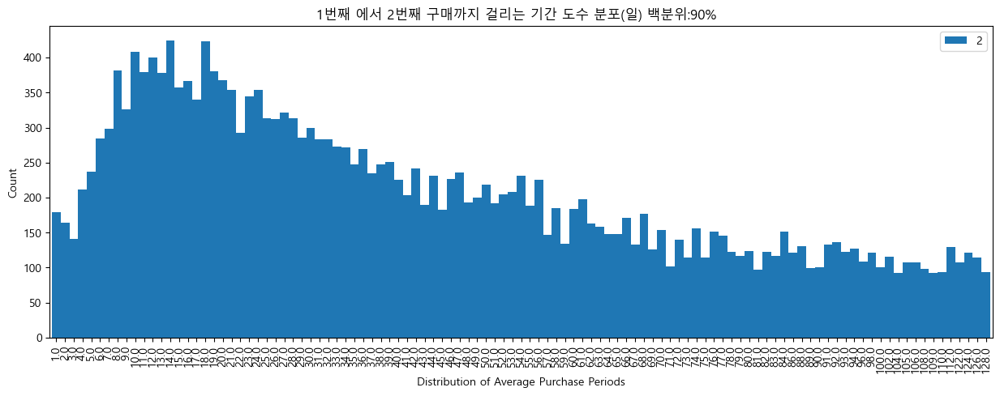

In [297]:
# Testing the updated function with pivot_table_3, the second row, and a different width
plot_data_below_percentile_v4(pivot_table_3,percentile=90, row_index=1, width=1)


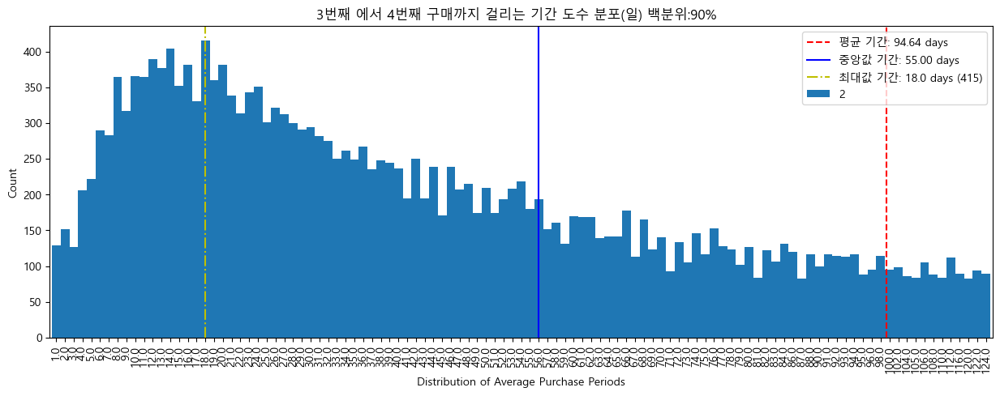

In [261]:
# Testing the updated function with pivot_table_3, the second row, and a different width
plot_data_below_percentile_v4(pivot_table_3,percentile=90, row_index=2, width=1)

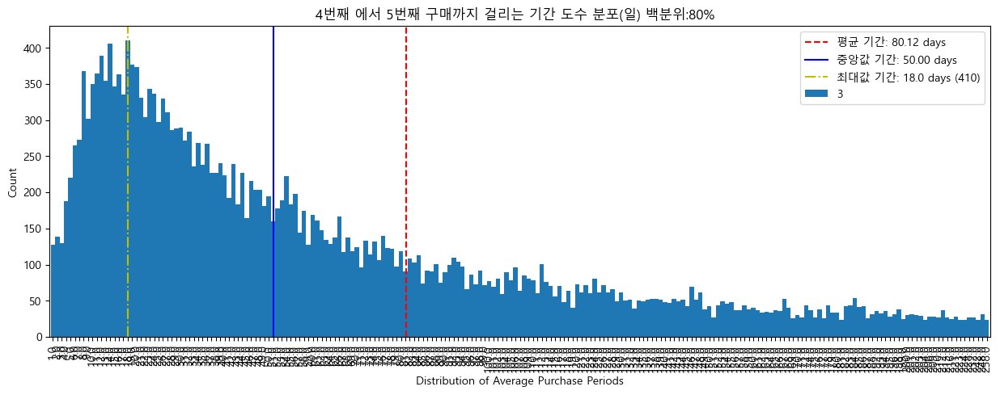

In [262]:
# Testing the updated function with pivot_table_3, the second row, and a different width
plot_data_below_percentile_v4(pivot_table_3,percentile=80, row_index=3, width=1)

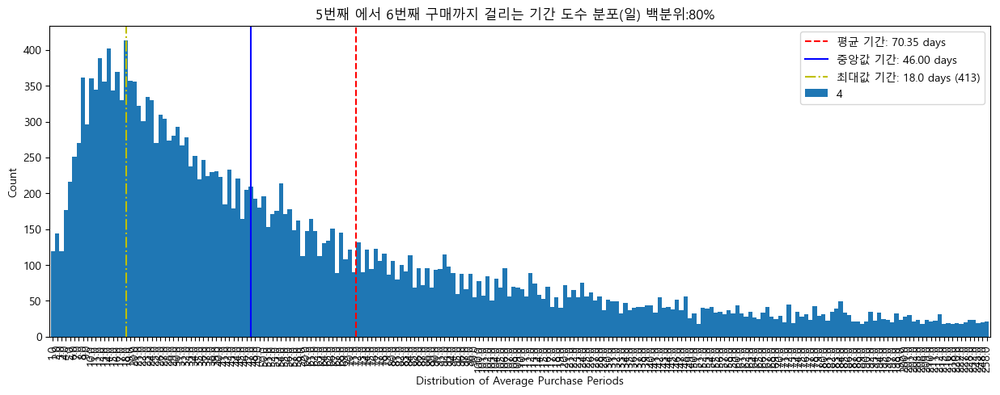

In [263]:
# Testing the updated function with pivot_table_3, the second row, and a different width
plot_data_below_percentile_v4(pivot_table_3,percentile=80, row_index=4, width=1)

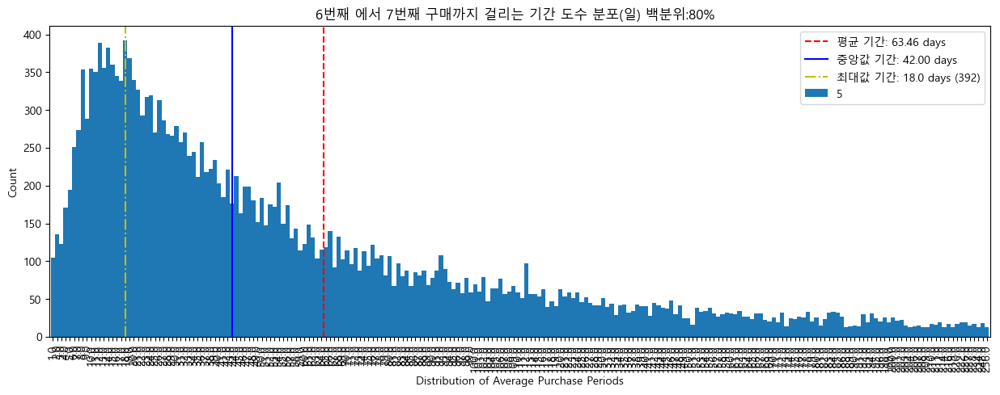

In [264]:
# Testing the updated function with pivot_table_3, the second row, and a different width
plot_data_below_percentile_v4(pivot_table_3,percentile=80, row_index=5, width=1)

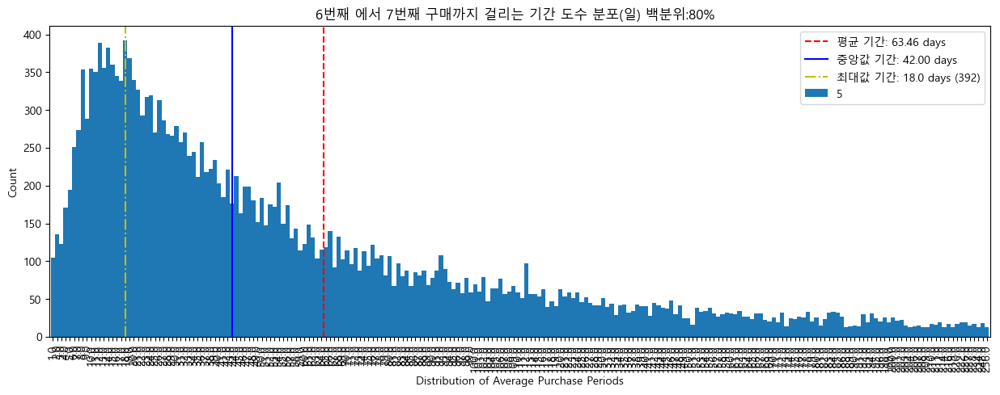

In [265]:
# Testing the updated function with pivot_table_3, the second row, and a different width
plot_data_below_percentile_v4(pivot_table_3,percentile=80, row_index=5, width=1)

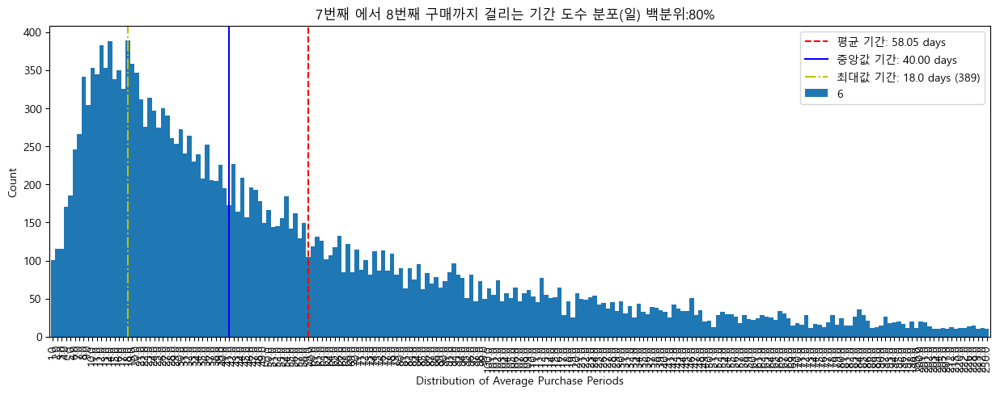

In [266]:
# Testing the updated function with pivot_table_3, the second row, and a different width
plot_data_below_percentile_v4(pivot_table_3,percentile=80, row_index=6, width=1)

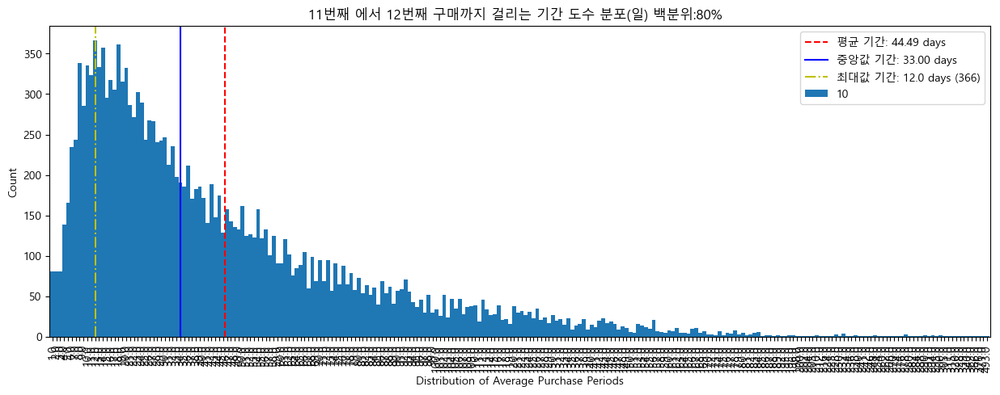

In [267]:
# Testing the updated function with pivot_table_3, the second row, and a different width
plot_data_below_percentile_v4(pivot_table_3,percentile=80, row_index=10, width=1)

In [401]:
def Take_time(df, row_index):
    # Extract the specified row data for plotting
    selected_row = df.iloc[row_index, 1:1063]
    
    # Convert the data to numeric if not already
    selected_row_numeric = pd.to_numeric(selected_row, errors='coerce')
    
    # 누적 도수 중앙값
    # 1. 누적 도수 계산
    cumulative_frequency = selected_row_numeric.cumsum()
    # 2. 전체 거래 횟수의 중간 위치 확인
    half_total = cumulative_frequency.iloc[-1] / 2
    # 3. 누적 도수와 중간 위치 비교
    median_day = cumulative_frequency[cumulative_frequency >= half_total].index[0]
    
    # 가중 평균값
    # 일수를 숫자로 변환
    numeric_days = pd.to_numeric(selected_row.index, errors='coerce')
    # 1. 각 일수와 해당 일수의 거래 횟수를 곱하기
    weighted_values = numeric_days * selected_row_numeric
    # 2. 이렇게 얻은 값들의 합을 구하기
    sum_weighted_values = weighted_values.sum()
    # 3. 그 합을 전체 거래 횟수로 나누기
    Weighted_Average_day = sum_weighted_values / selected_row_numeric.sum()
    
    # Find the day with the maximum frequency
    max_frequency_day = selected_row_numeric.idxmax()
    max_frequency_value = selected_row_numeric[max_frequency_day]

    return Weighted_Average_day, median_day, max_frequency_day

# Create a DataFrame to store the results
results_df = pd.DataFrame(columns=['Weighted_Average_day', 'Median_Day', 'Max_Frequency_Value'])

# Iterate over all rows of the DataFrame and add the results to results_df
for idx in range(len(pivot_table_3)):
    weighted_average, median_day, max_frequency_value = Take_time(pivot_table_3, idx)
    results_df.loc[idx] = [weighted_average, median_day, max_frequency_value]

results_df.head()


,Weighted_Average_day,Median_Day,Max_Frequency_Value
0,NaN,1.0,1.0
1,157.408042,76.0,14.0
2,116.337516,63.0,14.0
3,94.638921,55.0,18.0
4,80.115931,50.0,18.0


In [413]:
results_df.to_csv('results_df.csv')

In [83]:
pivot_table_3.to_csv('pivot_table_3.csv')

In [ ]:
# Plotting the number of customers who did not make any purchase after a specific order number
plt.figure(figsize=(14,6))
plt.bar(order_num['No Purchase Afterwards'].index, pivot_table['No Purchase Afterwards'].values, alpha=0.7, label='Non-Purchasers After Order Number')
plt.title('Number of Customers Not Purchasing After a Specific Order Number')
plt.xlabel('Order Number')
plt.ylabel('Number of Customers')
plt.legend()
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.show()

In [78]:
# 같은 날 구매순서별 시간 주기 분포

df_without_july_only_0 = df_without_july.sort_values(by=['order_date', 'order_num'])

# Group by customer_id and order_num and then calculate the difference in days for each order_num
df_without_july_only_0['date_diff_per_order'] = df_without_july_only_0.groupby('customer_id')['order_date'].diff().dt.days
df_without_july_only_0 = df_without_july_only_0[df_without_july_only_0['date_diff_per_order'] == 0]

data_sorted = df_without_july_only_0.sort_values(by=['created_at', 'order_num'])

# Calculate the difference in seconds for the created_at column and then convert it to hours
data_sorted['hours_diff_per_order'] = data_sorted.groupby('customer_id')['created_at'].diff().apply(lambda x: x.total_seconds() / 3600 if not pd.isnull(x) else x)

# Create a pivot table to count the number of customers for each date difference per order_num
pivot_table_2 = data_sorted.pivot_table(index='order_num', columns='hours_diff_per_order', values='customer_id', aggfunc='count')

# Calculate the number of customers who did not make any further purchases after a particular order_num
non_purchasers = data_sorted.groupby('customer_id')['order_num'].max().value_counts().sort_index().cumsum()
non_purchasers = data_sorted['customer_id'].nunique() - non_purchasers
pivot_table_2['No Purchase Afterwards'] = non_purchasers

# Replace NaN values with 0 and convert the values to integers
pivot_table_2.fillna(0, inplace=True)
pivot_table_2 = pivot_table_2.astype(int)
pivot_table_2 = pivot_table_2.reset_index()

# Display the resulting pivot table
pivot_table_2




KeyboardInterrupt: 

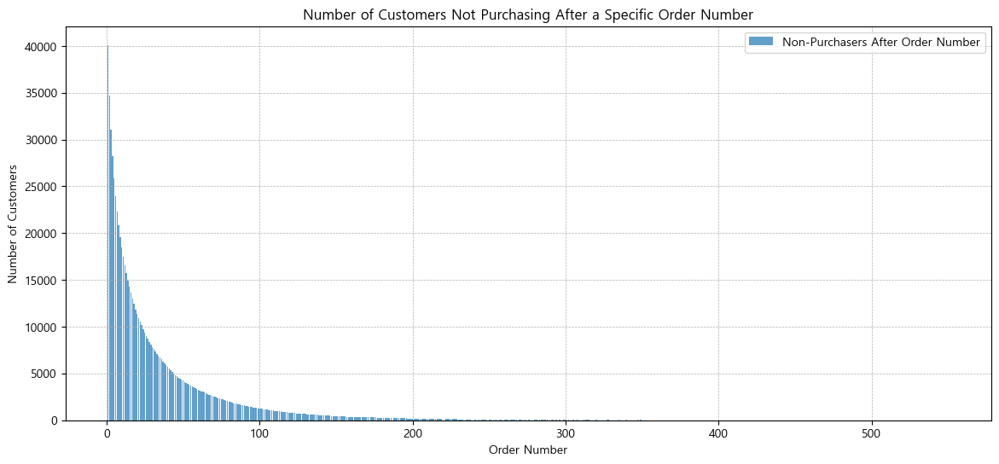

In [201]:
# Plotting the number of customers who did not make any purchase after a specific order number
plt.figure(figsize=(14,6))
plt.bar(pivot_table['No Purchase Afterwards'].index, pivot_table['No Purchase Afterwards'].values, alpha=0.7, label='Non-Purchasers After Order Number')
plt.title('Number of Customers Not Purchasing After a Specific Order Number')
plt.xlabel('Order Number')
plt.ylabel('Number of Customers')
plt.legend()
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.show()

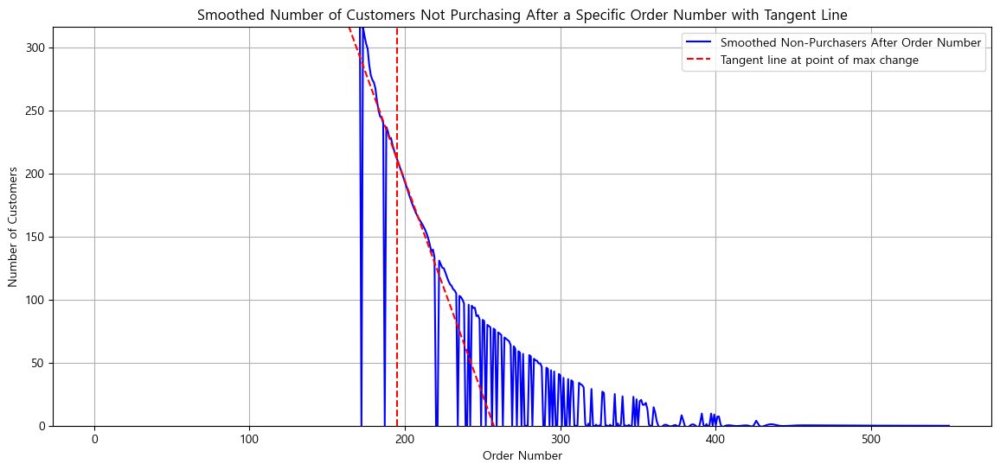

In [259]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import UnivariateSpline

# Load the data
data = pivot_table.copy()

# Fit a spline to the data
order_numbers = data['order_num'].values
non_purchasers = data['No Purchase Afterwards'].values
spline = UnivariateSpline(order_numbers, non_purchasers)

# Compute the derivative of the spline
spline_derivative = spline.derivative()

# Generate x values from the data
x = np.linspace(order_numbers.min(), order_numbers.max(), len(order_numbers))
y = spline(x)

# Define the tangent line at the point of maximum change
portion_to_consider = int(len(dy_vals) * 0.2)  # Consider the first 20% of the graph
max_slope_start_idx = np.argmax(dy_vals[:portion_to_consider])
x_tangent = x[max_slope_start_idx]  # This is the point of maximum change we found earlier
y_tangent = spline(x_tangent)
slope = spline_derivative(x_tangent)

# y = mx + b, we can find b using the point (x_tangent, y_tangent)
b = y_tangent - slope * x_tangent
tangent_line = slope * x + b

# Adjust the y-axis limits to focus on the tangent line and the curve near it
y_limit_upper = y_tangent + (y_tangent * 0.5)  # Adjusting the upper y-limit to 50% above the tangent point

plt.figure(figsize=(14,6))
plt.plot(x, y, label='Smoothed Non-Purchasers After Order Number', color='blue')
plt.plot(x, tangent_line, '--r', label="Tangent line at point of max change")
plt.legend()
plt.grid(True)
plt.ylim(bottom=0, top=y_limit_upper)
plt.axvline(x=intersection_x, color='red', linestyle='--', label='이탈률 둔화 지점')


intersection_x
plt.title('Smoothed Number of Customers Not Purchasing After a Specific Order Number with Tangent Line')
plt.xlabel('Order Number')
plt.ylabel('Number of Customers')
plt.show()


In [258]:
# Find the x-coordinate where the tangent line intersects the spline curve
intersection_idx = np.argmin(np.abs(tangent_line - y))
intersection_x = x[intersection_idx]

print("The x-coordinate where the tangent intersects the curve is:", intersection_x)


The x-coordinate where the tangent intersects the curve is: 195.0


In [417]:


# 데이터프레임에서 추출할 범위 설정
num_rows = 200
num_cols = 200  # 50번째 열까지 포함

# 빈 리스트 생성
results = []

# 반복문을 통해 연산 수행
for row_index in range(num_rows):
    row_data = []
    for col_index in range(num_cols):
        if col_index == 0:
            row_data.append(pivot_table.iloc[row_index, col_index])
        else:
            ratio = pivot_table.iloc[row_index, col_index] / pivot_table.iloc[row_index, 1:num_cols-1].sum()
            row_data.append(ratio)
    results.append(row_data)

# 결과 리스트를 데이터프레임으로 변환
result_df = pd.DataFrame(results, columns=pivot_table.columns[:num_cols])

print(result_df)


date_diff_per_order  order_num       1.0       2.0       3.0       4.0  \
0                            2  0.006447  0.005907  0.005078  0.007635   
1                            3  0.004801  0.006094  0.005133  0.007977   
2                            4  0.004991  0.005881  0.004913  0.007970   
3                            5  0.005213  0.005661  0.005294  0.007656   
4                            6  0.005120  0.006196  0.005120  0.007616   
..                         ...       ...       ...       ...       ...   
195                        197  0.000000  0.004926  0.004926  0.103448   
196                        198  0.000000  0.005051  0.005051  0.101010   
197                        199  0.000000  0.005155  0.010309  0.103093   
198                        200  0.000000  0.005263  0.010526  0.105263   
199                        201  0.000000  0.005376  0.005376  0.102151   

date_diff_per_order       5.0       6.0       7.0       8.0       9.0  \
0                    0.008536  0.01022

In [419]:
result_df

date_diff_per_order,order_num,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0,13.0,14.0,15.0,16.0,17.0,18.0,19.0,20.0,21.0,22.0,23.0,24.0,25.0,26.0,27.0,28.0,29.0,30.0,31.0,32.0,33.0,34.0,35.0,36.0,37.0,38.0,39.0,40.0,41.0,42.0,43.0,44.0,45.0,46.0,47.0,48.0,49.0,50.0,51.0,52.0,53.0,54.0,55.0,56.0,57.0,58.0,59.0,60.0,61.0,62.0,63.0,64.0,65.0,66.0,67.0,68.0,69.0,70.0,71.0,72.0,73.0,74.0,75.0,76.0,77.0,78.0,79.0,80.0,81.0,82.0,83.0,84.0,85.0,86.0,87.0,88.0,89.0,90.0,91.0,92.0,93.0,94.0,95.0,96.0,97.0,98.0,99.0,100.0,101.0,102.0,103.0,104.0,105.0,106.0,107.0,108.0,109.0,110.0,111.0,112.0,113.0,114.0,115.0,116.0,117.0,118.0,119.0,120.0,121.0,122.0,123.0,124.0,125.0,126.0,127.0,128.0,129.0,130.0,131.0,132.0,133.0,134.0,135.0,136.0,137.0,138.0,139.0,140.0,141.0,142.0,143.0,144.0,145.0,146.0,147.0,148.0,149.0,150.0,151.0,152.0,153.0,154.0,155.0,156.0,157.0,158.0,159.0,160.0,161.0,162.0,163.0,164.0,165.0,166.0,167.0,168.0,169.0,170.0,171.0,172.0,173.0,174.0,175.0,176.0,177.0,178.0,179.0,180.0,181.0,182.0,183.0,184.0,185.0,186.0,187.0,188.0,189.0,190.0,191.0,192.0,193.0,194.0,195.0,196.0,197.0,198.0,199.0
0,2,0.006447,0.005907,0.005078,0.007635,0.008536,0.010228,0.010733,0.013722,0.011741,0.014694,0.013650,0.014406,0.013614,0.015270,0.012857,0.013218,0.012245,0.015234,0.013686,0.013254,0.012749,0.010552,0.012425,0.012749,0.011273,0.011237,0.011561,0.011273,0.010300,0.010805,0.010192,0.010192,0.009832,0.009796,0.008896,0.009688,0.008464,0.008932,0.009040,0.008139,0.007347,0.008716,0.006843,0.008320,0.006591,0.008175,0.008500,0.006951,0.007203,0.007887,0.006915,0.007383,0.007491,0.008320,0.006807,0.008139,0.005294,0.006663,0.004826,0.006627,0.007131,0.005870,0.005690,0.005330,0.005330,0.006159,0.004790,0.006375,0.004538,0.005546,0.003674,0.005042,0.004106,0.005618,0.004142,0.005438,0.005258,0.004430,0.004214,0.004466,0.003493,0.004394,0.004214,0.005474,0.003241,0.004358,0.003277,0.004718,0.003566,0.003638,0.004790,0.004898,0.004430,0.004574,0.002953,0.003926,0.002989,0.004358,0.002809,0.003602,0.002881,0.004178,0.002917,0.003349,0.003890,0.003854,0.002629,0.003529,0.003349,0.003385,0.002305,0.004646,0.002917,0.002341,0.002485,0.003241,0.001909,0.002485,0.002485,0.002881,0.002773,0.003854,0.002629,0.004358,0.002485,0.004106,0.002557,0.003385,0.002449,0.003097,0.002449,0.002305,0.002269,0.002881,0.002089,0.002773,0.002629,0.002629,0.002017,0.003277,0.001873,0.002305,0.001909,0.002125,0.001801,0.002773,0.002593,0.002665,0.001621,0.002125,0.001369,0.002125,0.002017,0.002593,0.002053,0.001657,0.001729,0.002701,0.001801,0.001765,0.002269,0.001909,0.001765,0.002197,0.001765,0.002161,0.002377,0.002341,0.001405,0.001549,0.001116,0.001873,0.001549,0.001585,0.001801,0.001621,0.001729,0.002197,0.001585,0.001981,0.001116,0.003133,0.002197,0.002737,0.001981,0.003241,0.002125,0.001837,0.001981,0.001513,0.001261,0.002305,0.001549,0.001657,0.001152,0.002305,0.001261,0.001513,0.001080
1,3,0.004801,0.006094,0.005133,0.007977,0.008716,0.010673,0.010894,0.013738,0.011670,0.014403,0.013997,0.014809,0.013923,0.015622,0.013295,0.014218,0.012409,0.015363,0.014034,0.013443,0.013258,0.010894,0.012852,0.013184,0.011190,0.011781,0.011559,0.011116,0.010710,0.011301,0.010008,0.010710,0.009787,0.010673,0.008937,0.010008,0.009159,0.009491,0.008974,0.008162,0.007866,0.008679,0.007164,0.008642,0.006832,0.008235,0.008457,0.008125,0.007201,0.008051,0.006389,0.007349,0.007645,0.008937,0.006795,0.007497,0.005798,0.006574,0.004986,0.006611,0.007017,0.006795,0.005466,0.005429,0.005281,0.006906,0.004469,0.006869,0.004099,0.005983,0.003619,0.005170,0.004062,0.005540,0.004358,0.005540,0.005281,0.004247,0.004099,0.004875,0.002991,0.005133,0.004062,0.005429,0.003065,0.004764,0.003582,0.004727,0.003324,0.003693,0.004542,0.004949,0.004469,0.004247,0.003102,0.003952,0.002991,0.004616,0.002622,0.003361,0.002917,0.003988,0.002696,0.003471,0.003656,0.003508,0.002622,0.003767,0.003435,0.003102,0.002696,0.004506,0.003213,0.002585,0.002437,0.003139,0.002142,0.002511,0.002659,0.002954,0.003

In [414]:
# Plotting the data
plt.figure(figsize=(12, 7))

# Plot each series
plt.plot(results_df['Unnamed: 0'], results_df['Weighted_Average_day'], label='Average Day', marker='o')
plt.plot(results_df['Unnamed: 0'], results_df['Median_Day'], label='Median Day', marker='o')
plt.plot(results_df['Unnamed: 0'], results_df['Max_Frequency_Value'], label='Max Frequency Value', marker='o')

# Add labels, title, legend
plt.xlabel('Purchase Order')
plt.ylabel('Days')
plt.title('Days between Purchases by Purchase Order')
plt.legend()
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

plt.show()


KeyError: 'Unnamed: 0'

<Figure size 1200x700 with 0 Axes>

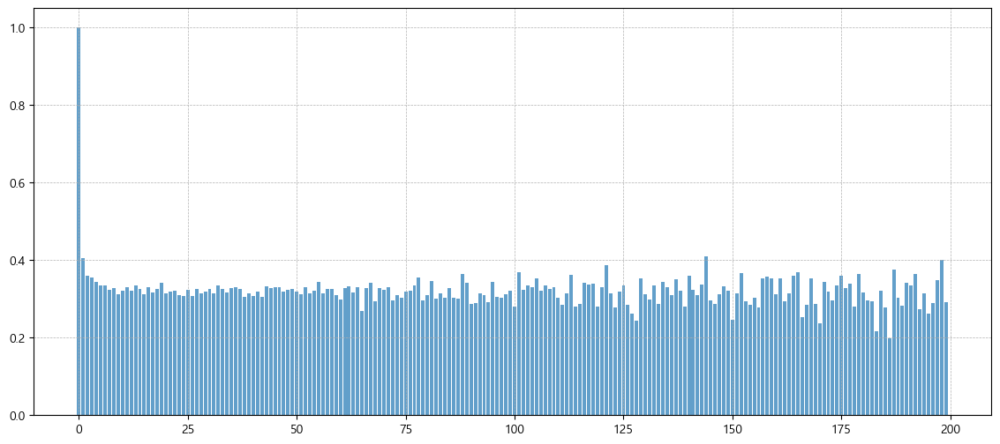

In [337]:
# Plotting the number of customers who did not make any purchase after a specific order number
plt.figure(figsize=(14,6))
plt.bar(result_df[0].index, result_df[0].values, alpha=0.7, label='0 next purch')
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.show()

In [336]:
result_df

date_diff_per_order,order_num,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,...,189.0,190.0,191.0,192.0,193.0,194.0,195.0,196.0,197.0,198.0
0,1,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,2,0.406020,0.003835,0.003514,0.003021,0.004542,0.005078,0.006085,0.006385,0.008163,...,0.001178,0.000900,0.000750,0.001371,0.000921,0.000986,0.000686,0.001371,0.000750,0.000900
2,3,0.359874,0.003078,0.003907,0.003291,0.005114,0.005588,0.006842,0.006984,0.008807,...,0.000971,0.000616,0.000710,0.001089,0.000781,0.000994,0.000710,0.000994,0.000568,0.000971
3,4,0.356197,0.003218,0.003791,0.003168,0.005138,0.005537,0.007233,0.007059,0.009079,...,0.000698,0.000773,0.000524,0.001172,0.000698,0.000973,0.000773,0.000773,0.000624,0.000898
4,5,0.343368,0.003428,0.003723,0.003482,0.005035,0.005892,0.007097,0.007311,0.009856,...,0.000562,0.000562,0.000375,0.000964,0.000857,0.000964,0.000750,0.000830,0.000536,0.001018
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,196,0.261194,0.000000,0.003731,0.003731,0.078358,0.085821,0.115672,0.119403,0.156716,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
196,197,0.290210,0.000000,0.003497,0.003497,0.073427,0.083916,0.111888,0.101399,0.136364,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
197,198,0.348684,0.000000,0.003289,0.003289,0.065789,0.078947,0.111842,0.098684,0.125000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
198,199,0.401235,0.000000,0.003086,0.006173,0.061728,0.070988,0.104938,0.095679,0.114198,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [ ]:
pivot_table

In [343]:
pivot_table
# 22년 7월 재구매가 신규 프로모션때문에 많음

date_diff_per_order,order_num,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,...,1227.0,1235.0,1261.0,1263.0,1306.0,1333.0,1347.0,1480.0,1625.0,No Purchase Afterwards
0,1,25058,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,40108
1,2,18951,179,164,141,212,237,284,298,381,...,0,0,0,0,0,0,0,0,0,34743
2,3,15200,130,165,139,216,236,289,295,372,...,0,1,0,0,1,0,1,1,0,31074
3,4,14281,129,152,127,206,222,290,283,364,...,1,0,1,1,0,0,0,0,0,28210
4,5,12821,128,139,130,188,220,265,273,368,...,0,0,0,0,0,0,0,0,1,25898
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
545,546,3,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
546,547,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
547,548,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
548,549,3,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [291]:
filtered_data = pivot_table.iloc[:20, :20]
filtered_data

date_diff_per_order,order_num,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0,13.0,14.0,15.0,16.0,17.0,18.0
0,1,25058,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,2,18951,179,164,141,212,237,284,298,381,326,408,379,400,378,424,357,367,340,423
2,3,15200,130,165,139,216,236,289,295,372,316,390,379,401,377,423,360,385,336,416
3,4,14281,129,152,127,206,222,290,283,364,317,366,364,389,377,404,352,381,330,415
4,5,12821,128,139,130,188,220,265,273,368,302,350,365,389,354,406,347,363,335,410
5,6,11644,119,144,119,177,216,251,270,361,296,360,344,388,356,402,343,369,330,413
6,7,11090,105,136,123,171,194,251,273,354,288,355,350,389,356,383,360,345,339,392
7,8,9949,101,116,115,171,185,246,266,341,304,353,345,383,353,388,338,350,326,389
8,9,9628,92,111,102,156,187,240,256,346,300,359,346,363,352,378,327,333,320,373
9,10,8460,87,100,100,140,189,236,249,344,286,350,334,368,345,360,333,332,309,363
